In [1]:
import numpy as np 
import pandas as pd  
import matplotlib.pyplot as plt
import seaborn as sns
import random
import importlib
import matplotlib.colors as mcolors
import matplotlib.cm as cm
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import sys
import os

# Add the 'code' folder directly to Python's search path
sys.path.append(os.path.join(os.getcwd(), 'src'))
from sklearn.datasets import make_moons
from sklearn.cluster import KMeans
from scipy.linalg import sqrtm


#import the synthetic data generation functions
import src.synthetic_data as syn_data
importlib.reload(syn_data)

#import the Wasserstein k-means clustering functions
import src.wasserstein as ws
importlib.reload(ws)

#import performance metrics functions for clustering evaluation 
import src.metrics as mt 
importlib.reload(mt)


#import trading alogrithms function for empirical performance 
import src.trading as tr
importlib.reload(tr)

import src.ledoit_wolf_sharpe_test as lw
importlib.reload(lw)

# Access to refinitiv data 
import refinitiv.data as rd

import src.equities_refinitiv as eq_ref
import src.macro_data as macro

# import FREDAPI 
from fredapi import Fred

#yahoo finance 
import yfinance as yf


from src import equity_loader

# (1) Results of UnifOrtho k-means Wasserstein clustering on Syntethic Data 

- Type A data generation with K = 2 and fixed $\rho$
- Type B data generation with K = 2 and varying $\rho$ 
- Type C data generation with K = 3 and varying $\rho$
- Type D data generation with K = 3 and with $\texttt{datasets.make\_moons()}$ from sklearn

In [3]:
theta_bull = (0.02, 0.2)
theta_bear = (-0.02,0.3)

## (1.1) Type A : Majority Regime I (Bullish) + Minority Regime II (Bearish)

- $\rho_{Bullish} =+ 1/2$ 
- $\rho_{Bearish} =+ 1/2$ 
- $K=2$
- $d \in \left\{3,4,5 \right\}$

### 2D Synthetic visualization 


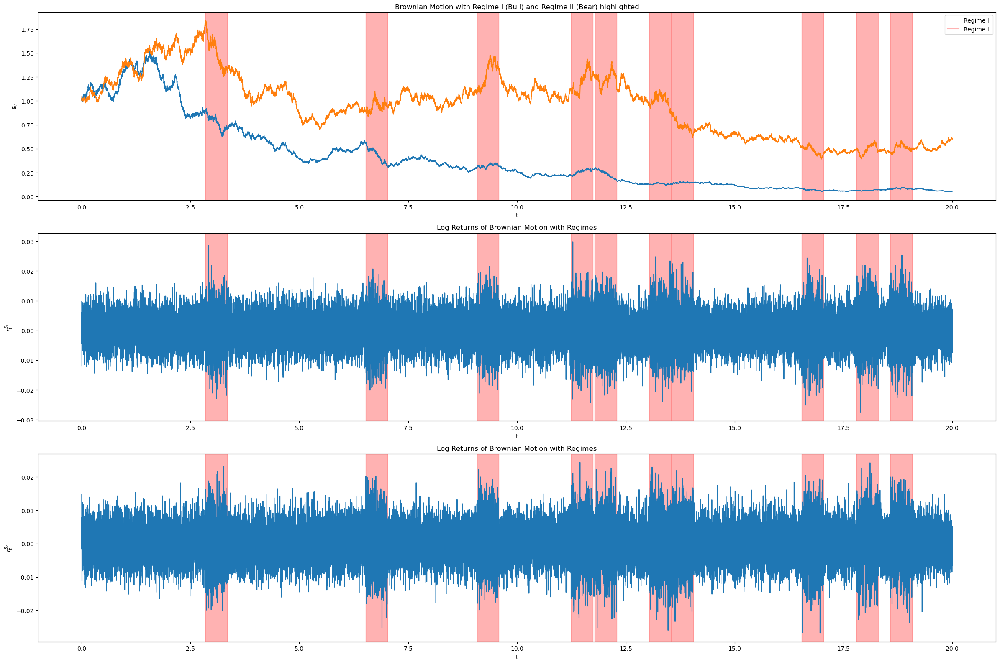

In [43]:
# Simulate 2D Brownian motion for bear and bull markets
S0 = 1
K = 2
T = 20
dt = 1/(252*7)
d = 2
rho = 0.5
n_bear_periods = 10
bear_duration_years = 1.0

t, S, bear_starts, true_regimes = syn_data.brownian_motion_mult_regime_A(S0, theta_bull, theta_bear, T, dt, d, rho, n_bear_periods, bear_duration_years)
# Plot the simulated Brownian motion with bear and bull regimes
syn_data.visualize_synthetic_data(t, S, bear_starts, K)


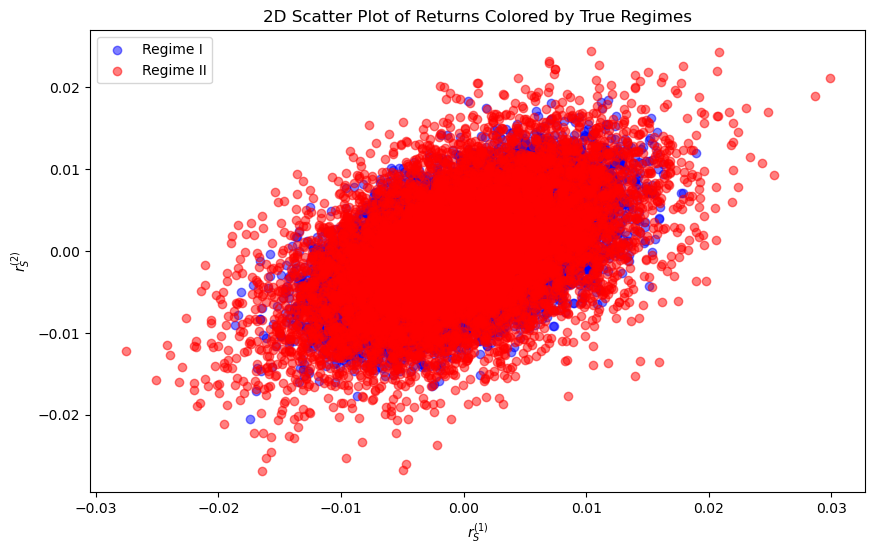

In [44]:
importlib.reload(syn_data)
syn_data.visualize_scatter_2D_returns(t, S, K, true_regimes[1:])

### 3D synthetic data with Clustering algo Unifortho

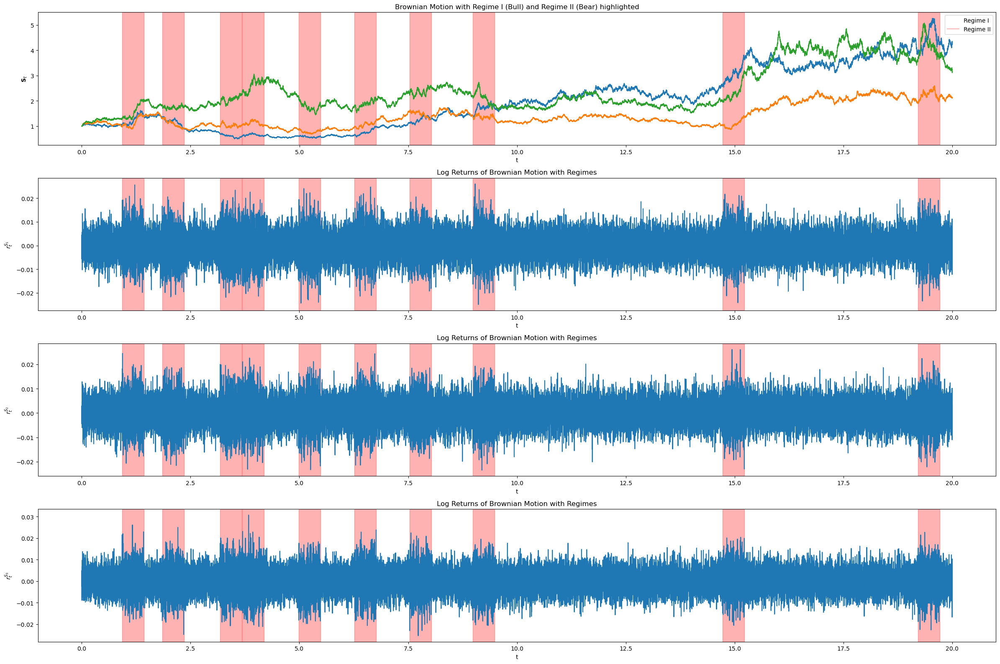

In [45]:
# Simulate 3D Brownian motion for bear and bull markets
S0 = 1
K = 2
T = 20
dt = 1/(252*7)
d = 3
rho = 0.5
n_bear_periods = 10
bear_duration_years = 1.0

t, S, bear_starts, true_regimes = syn_data.brownian_motion_mult_regime_A(S0, theta_bull, theta_bear, T, dt, d, rho, n_bear_periods, bear_duration_years)
# Plot the simulated Brownian motion with bear and bull regimes
syn_data.visualize_synthetic_data(t, S, bear_starts, K)


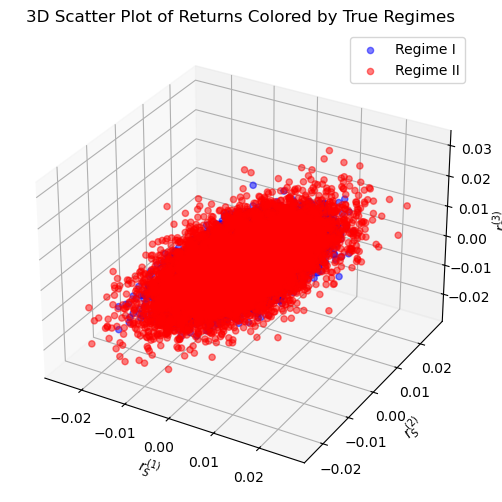

In [46]:
importlib.reload(syn_data)
syn_data.visualize_scatter_3D_returns(t, S, K, true_regimes[1:])

### Testing UnifOrtho algorithm

In [48]:
importlib.reload(ws)

L = 20 # 20, 40, 60, 80, 100
epsilon = 1e-6
h1 = 35 
h2 = 7
K = 2
N_S = 10

projected_emp_dist, centroids, labels = ws.max_acc_unifortho_sim(N_S, S, true_regimes[1:], K, L, epsilon, h1,h2, test=True)

Convergence reached based on centroid changes.
Simulation 1/10 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 2/10 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 3/10 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 4/10 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 5/10 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 6/10 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 7/10 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 8/10 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 9/10 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 10/10 completed. Evaluating accuracy...
--- Regime 0 ---
Mean: 0.0000

### Visualize clustering performance of the UnifOrtho Sliced Wasserstein k-means clustering algorithm

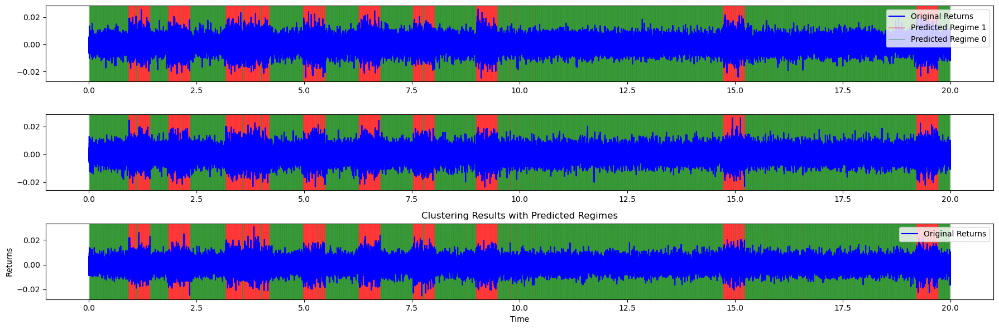

In [50]:
importlib.reload(mt)
mt.visualize_clustering_results(t, S, labels, h1, h2,K=2)

### Total Accuracy 


In [51]:
importlib.reload(mt)

r_s_true_regime = true_regimes[1:]
accuracy = mt.total_accuracy(S,r_s_true_regime, labels, h1, h2)
print("Total Accuracy:", accuracy)

balanced_acc = mt.balanced_accuracy(S, r_s_true_regime, labels, h1, h2)
print("Balanced Accuracy:", balanced_acc)




Total Accuracy: 0.9917798123529579
Balanced Accuracy: 0.9887754116474563


## Confusion Matrix


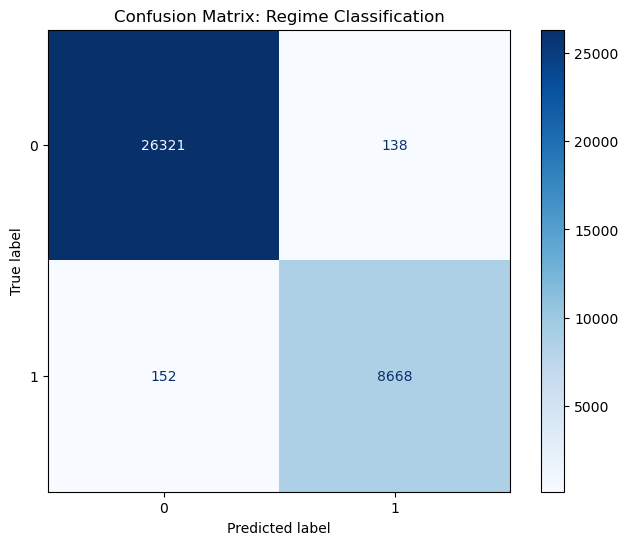

In [52]:
importlib.reload(mt)

cm = mt.confusion_matrix_WS(S, r_s_true_regime, labels, h1, h2)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])

fig, ax = plt.subplots(figsize=(8, 6))
disp.plot(cmap=plt.cm.Blues, ax=ax)

plt.title('Confusion Matrix: Regime Classification')
plt.show()

### Mean Squared Point Centroid Distance 

In [53]:
importlib.reload(mt)

mspd = mt.mean_squared_point_centroid_distance(centroids, labels, projected_emp_dist, K, p=2)

print("Mean Squared Point Centroid Distance:", mspd)

Mean Squared Point Centroid Distance: 2.4112121808653158e-06


### Mean Centroid Centroid Distance 

In [54]:
importlib.reload(mt)
mccd = mt.mean_centroid_centroid_distance(centroids,K, p=2)
print("Mean Centroid Centroid Distance:", mccd)

Mean Centroid Centroid Distance: 0.002166052357937519


## (1.2) Type B : Majority Regime I (Bullish) + Minority Regime II (Bearish)

- $\rho_{Bullish} =+ 1/2$ 
- $\rho_{Bearish} =- 1/2$ 
- $K=2$
- $d \in \left\{3,4,5 \right\}$

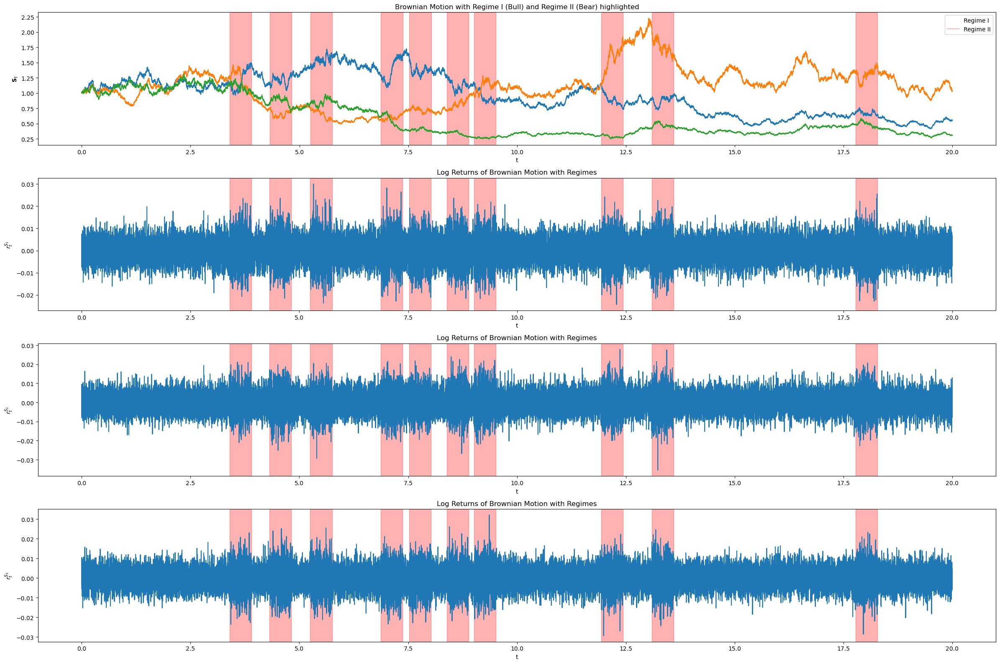

In [55]:
# Simulate 3D Brownian motion for bear and bull markets
S0 = 1
T = 20
dt = 1/(252*7)
d = 3
rho_bull = 0.5
rho_bear = -0.5
n_bear_periods = 10
bear_duration_years = 1.0

t, S, bear_starts, true_regimes = syn_data.brownian_motion_mult_regime_B(S0, theta_bull, theta_bear, T, dt, d, rho_bull, rho_bear, n_bear_periods, bear_duration_years)

syn_data.visualize_synthetic_data(t, S, bear_starts, K)



### Unifortho Algorithm

In [58]:
importlib.reload(ws)

L = 20 # 20, 40, 60, 80, 100
epsilon = 1e-6
h1 = 35
h2 = 7 
K = 2
N_S = 10 # nb of simulation 

projected_emp_dist, centroids, labels = ws.max_acc_unifortho_sim(N_S,S, true_regimes[1:], K, L, epsilon, h1,h2,test=True)




Convergence reached based on centroid changes.
Simulation 1/10 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 2/10 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 3/10 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 4/10 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 5/10 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 6/10 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 7/10 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 8/10 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 9/10 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 10/10 completed. Evaluating accuracy...
--- Regime 0 ---
Mean: 4.0648

### Visualize clustering performance of the UnifOrtho Sliced Wasserstein k-means clustering algorithm

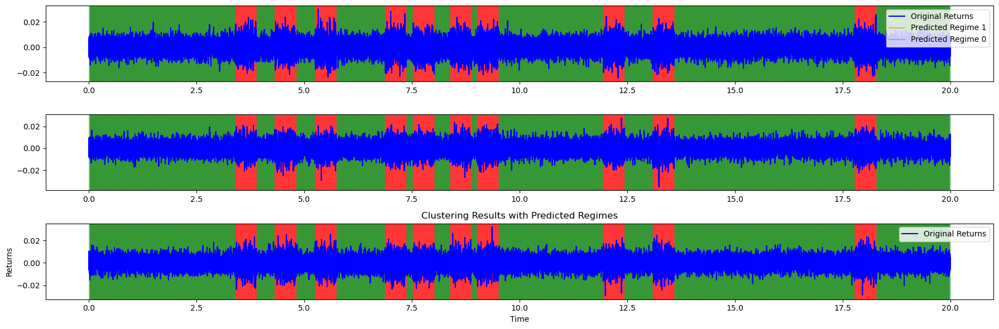

In [60]:
importlib.reload(mt)
mt.visualize_clustering_results(t, S, labels, h1, h2,K=2)

### Total Accuracy  

In [61]:
importlib.reload(mt)

r_s_true_regime = true_regimes[1:]
accuracy = mt.total_accuracy(S,r_s_true_regime, labels, h1, h2)
print("Total Accuracy:", accuracy)

balanced_acc = mt.balanced_accuracy(S, r_s_true_regime, labels, h1, h2)
print("Balanced Accuracy:", balanced_acc)

Total Accuracy: 0.9981575441480768
Balanced Accuracy: 0.9979402565163283


### Confusion Matrix

Text(0.5, 1.0, 'Confusion Matrix: Regime Classification')

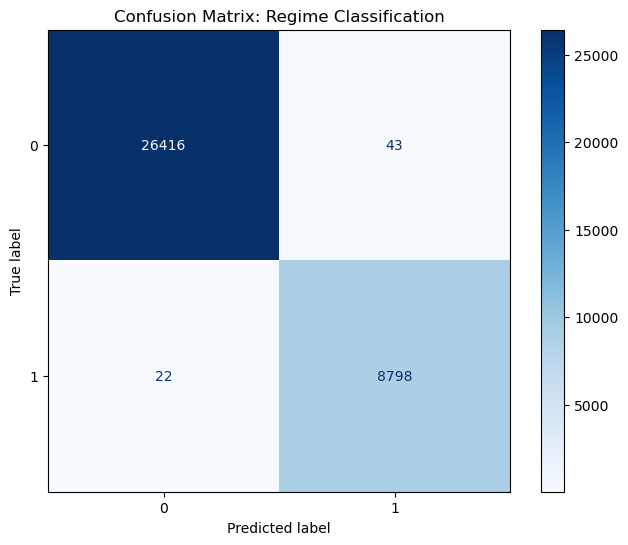

In [62]:
importlib.reload(mt)

cm = mt.confusion_matrix_WS(S, r_s_true_regime, labels, h1, h2)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])

fig, ax = plt.subplots(figsize=(8, 6))
disp.plot(cmap=plt.cm.Blues, ax=ax)

plt.title('Confusion Matrix: Regime Classification')

### Mean Squared Point Centroid Distance 

In [63]:
importlib.reload(mt)

mspd = mt.mean_squared_point_centroid_distance(centroids, labels, projected_emp_dist, K, p=2)

print("Mean Squared Point Centroid Distance:", mspd)

Mean Squared Point Centroid Distance: 2.259359562282447e-06


### Mean Centroid Centroid Distance 

In [64]:
mccd = mt.mean_centroid_centroid_distance(centroids,K, p=2)
print("Mean Centroid Centroid Distance:", mccd)

Mean Centroid Centroid Distance: 0.003131627061517303


## (1.3) Type C : Majority Regime I (Bull $\rho$= 1/2) + Minority Regime II (Bear $\rho$ = 1/2) + Minority Regime III (Bear)

- $\rho_{Bull} = 1/2$ 
- $\rho_{Bear_1} = 1/2$ 
- $\rho_{Bear_2} = -1/2$ 
- K = 3 
- $d \in \left\{3,4,5\right\}$

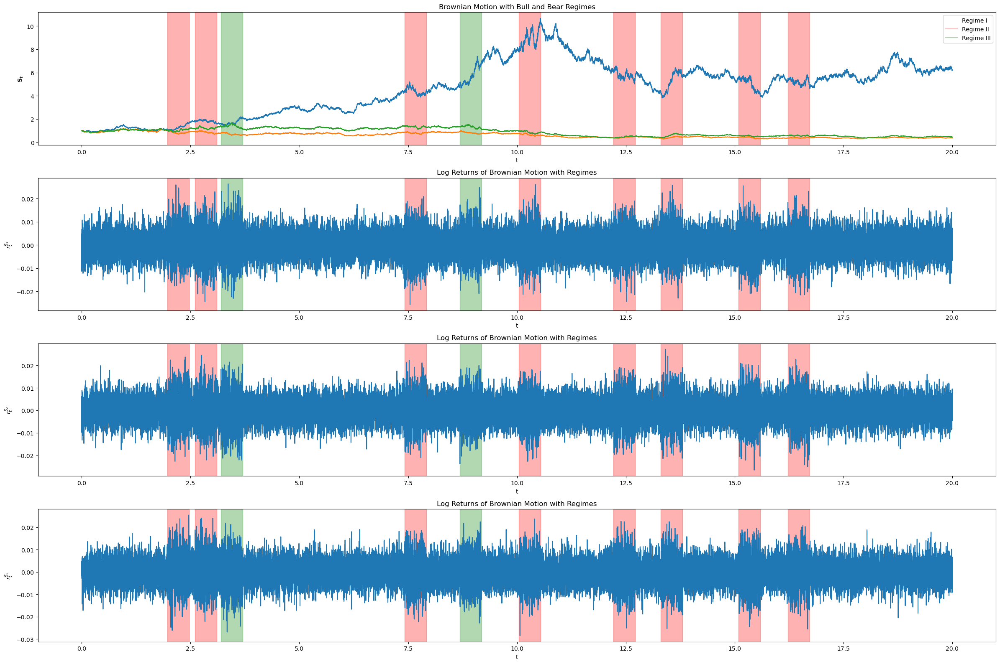

In [65]:
# Simulate 3D Brownian motion for bear and bull markets
S0 = 1
T = 20
dt = 1/(252*7)
d = 3
K = 3
rho_bull = 0.5
rho_bear_1 = 0.5
rho_bear_2 = -0.5
n_bear_periods = 10
bear_duration_years = 1.0
importlib.reload(syn_data)

t, S, bear_starts, true_regimes = syn_data.brownian_motion_mult_regime_C(S0, theta_bull, theta_bear, T, dt, d, rho_bull, rho_bear_1, rho_bear_2, n_bear_periods, bear_duration_years)

syn_data.visualize_synthetic_data(t, S, bear_starts, K, true_regimes)

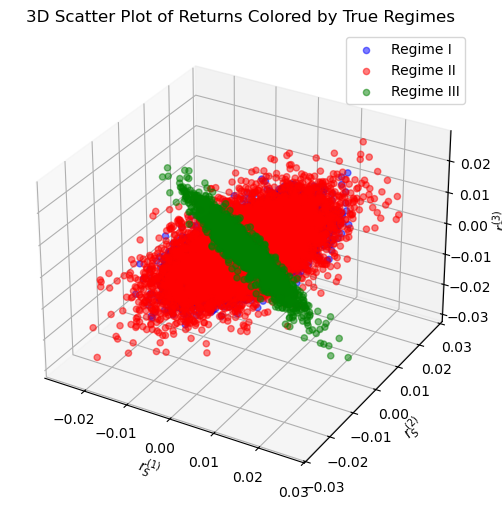

In [66]:
importlib.reload(syn_data)
syn_data.visualize_scatter_3D_returns(t, S, K, true_regimes[1:])

### Unifortho Algorithm

In [67]:
importlib.reload(ws)

L = 20 # 20, 40, 60, 80, 100
epsilon = 1e-6
h1 = 35
h2 = 7
K = 3
N_S = 10

projected_emp_dist, centroids, labels = ws.max_acc_unifortho_sim(N_S, S, true_regimes[1:], K, L, epsilon, h1,h2, test =True)

Convergence reached based on centroid changes.
Simulation 1/10 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 2/10 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 3/10 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 4/10 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 5/10 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 6/10 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 7/10 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 8/10 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 9/10 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 10/10 completed. Evaluating accuracy...
--- Regime 0 ---
Mean: 3.5159

### Visualize clustering performance of the UnifOrtho Sliced Wasserstein k-means clustering algorithm

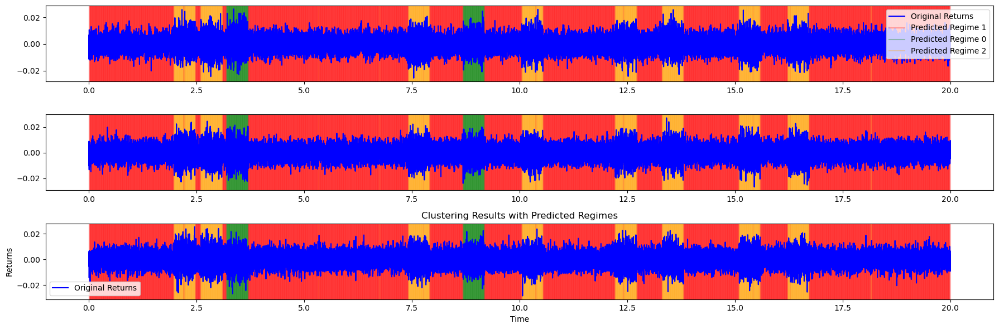

In [68]:
importlib.reload(mt)
mt.visualize_clustering_results(t, S, labels, h1, h2,K=3)

### Computation of Accuracies

In [69]:
importlib.reload(mt)

r_s_true_regime = true_regimes[1:]
accuracy = mt.total_accuracy(S,r_s_true_regime, labels, h1, h2)
print("Total Accuracy:", accuracy)

balanced_acc = mt.balanced_accuracy(S, r_s_true_regime, labels, h1, h2)
print("Balanced Accuracy:", balanced_acc)


mspd = mt.mean_squared_point_centroid_distance(centroids, labels, projected_emp_dist, K, p=2)

print("Mean Squared Point Centroid Distance:", mspd)

mccd = mt.mean_centroid_centroid_distance(centroids,K, p=2)
print("Mean Centroid Centroid Distance:", mccd)


Total Accuracy: 0.9953229966835795
Balanced Accuracy: 0.9936665030769521
Mean Squared Point Centroid Distance: 2.670602381800528e-06
Mean Centroid Centroid Distance: 0.0027262168148708544


### Confusion Matrix


Text(0.5, 1.0, 'Confusion Matrix: Regime Classification')

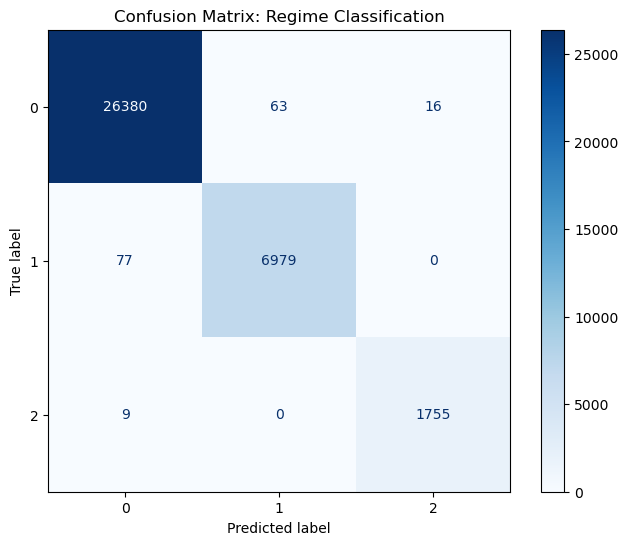

In [70]:
importlib.reload(mt)

cm = mt.confusion_matrix_WS(S, r_s_true_regime, labels, h1, h2)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1,2])

fig, ax = plt.subplots(figsize=(8, 6))
disp.plot(cmap=plt.cm.Blues, ax=ax)

plt.title('Confusion Matrix: Regime Classification')

## (1.4) Type D : Majority Regime I (Bull $\rho$= 1/2) + Minority Regime II (Bear $\rho$ = 1/2) + Minority Regime III (Moon)

- $\rho_{Bull} = 1/2$ 
- $\rho_{Bear} = 1/2$ 
- $\rho_{Moon} = 1/2$ with $\Theta_{Moon}=\Theta_{Bear}$
- K = 3 
- $d \in \left\{3,4,5\right\}$

### 2D Synthetic Data Generation 

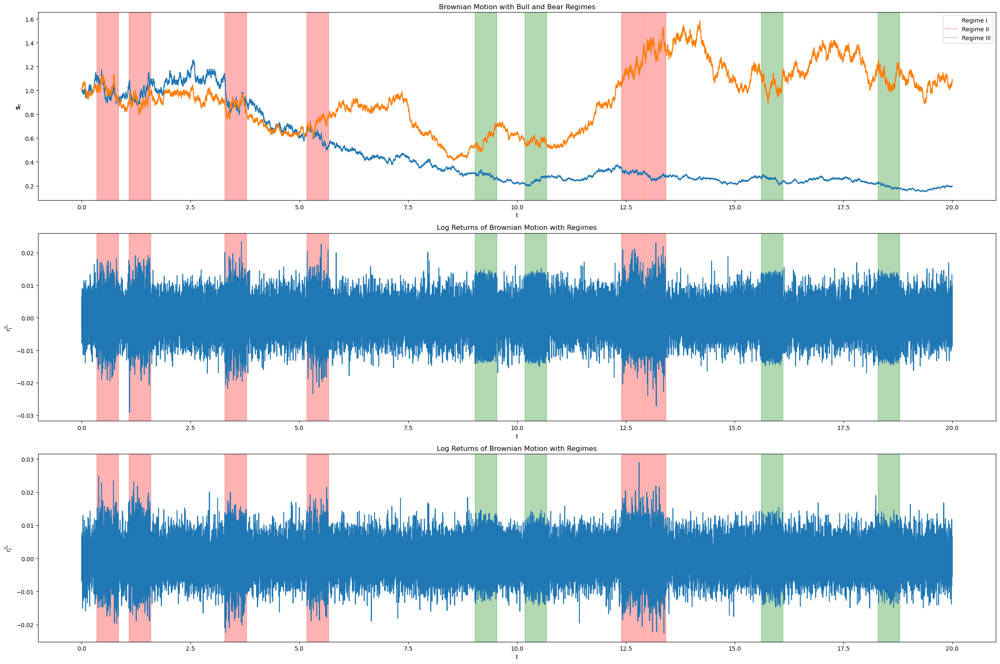

In [71]:
# Simulate 3D Brownian motion for bear and bull markets
S0 = 1
T = 20
dt = 1/(252*7)
d = 2
theta_bull = (0.02, 0.2)
theta_bear = (-0.02, 0.3)
rho_bull = 0.5
rho_bear = 0.5
rho_moon = 0.5
n_bear_periods = 10
bear_duration_years = 1.0
noise = 0.05
K = 3

t, S, bear_starts, true_regimes = syn_data.brownian_motion_mult_regime_D(S0, theta_bull, theta_bear, T, dt, d, rho_bull, rho_bear, rho_moon, noise, n_bear_periods, bear_duration_years)


syn_data.visualize_synthetic_data(t, S, bear_starts, K, true_regimes)

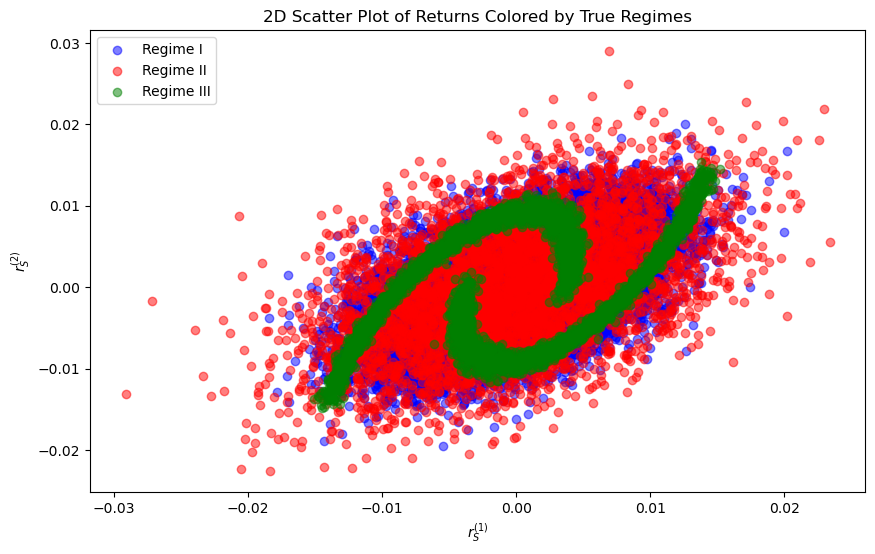

In [72]:
importlib.reload(syn_data)
syn_data.visualize_scatter_2D_returns(t, S, K, true_regimes[1:])

### UnifOrtho Algo on 2D Type D 


In [73]:
importlib.reload(ws)

L = 16 # 20, 40, 60, 80, 100
epsilon = 1e-6
h1 = 60
h2 = 12
K = 3
# multiple runs of the unifortho sliced wasserstein clustering to get a maximum performance metric
r_s_true_regime = true_regimes[1:]
projected_emp_dist, centroids, labels = ws.max_acc_unifortho_sim(10, S, r_s_true_regime, K, L, epsilon, h1, h2, test=True)

Convergence reached based on centroid changes.
Simulation 1/10 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 2/10 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 3/10 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 4/10 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 5/10 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 6/10 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 7/10 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 8/10 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 9/10 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 10/10 completed. Evaluating accuracy...
--- Regime 0 ---
Mean: -9.122

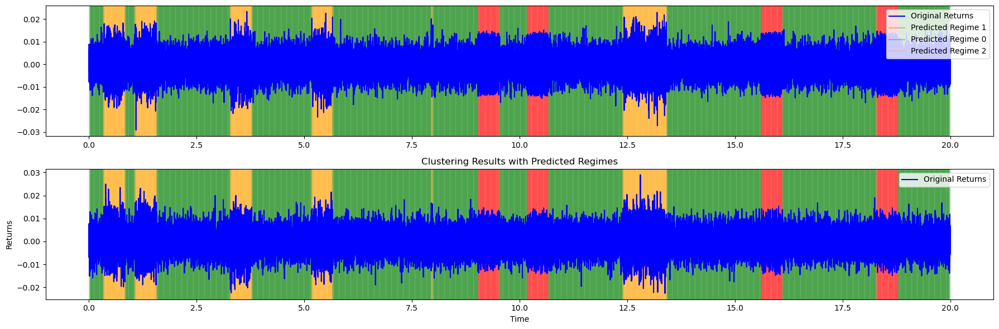

In [74]:
importlib.reload(mt)
mt.visualize_clustering_results(t, S, labels, h1, h2,K=3)

### Computation of Accuracies 

In [75]:
importlib.reload(mt)

r_s_true_regime = true_regimes[1:]
accuracy = mt.total_accuracy(S,r_s_true_regime, labels, h1, h2)
print("Total Accuracy:", accuracy)


balanced_acc = mt.balanced_accuracy(S, r_s_true_regime, labels, h1, h2)
print("Balanced Accuracy:", balanced_acc)


mspd = mt.mean_squared_point_centroid_distance(centroids, labels, projected_emp_dist, K, p=2)

print("Mean Squared Point Centroid Distance:", mspd)

mccd = mt.mean_centroid_centroid_distance(centroids,K, p=2)
print("Mean Centroid Centroid Distance:", mccd)


Total Accuracy: 0.99469939624139
Balanced Accuracy: 0.9946018477072363
Mean Squared Point Centroid Distance: 1.4881024473249984e-06
Mean Centroid Centroid Distance: 0.0019241757084561568


### Confusion Matrix

Text(0.5, 1.0, 'Confusion Matrix: Regime Classification')

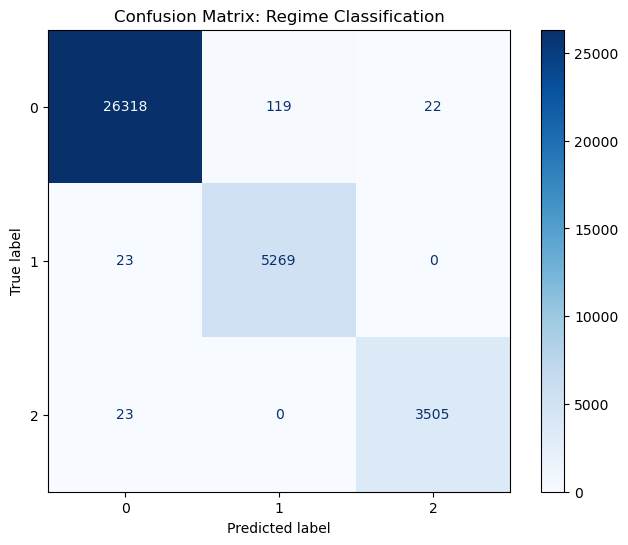

In [76]:
importlib.reload(mt)

cm = mt.confusion_matrix_WS(S, r_s_true_regime, labels, h1, h2)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1, 2])

fig, ax = plt.subplots(figsize=(8, 6))
disp.plot(cmap=plt.cm.Blues, ax=ax)

plt.title('Confusion Matrix: Regime Classification')

### 3D Synthetic Data Generation 

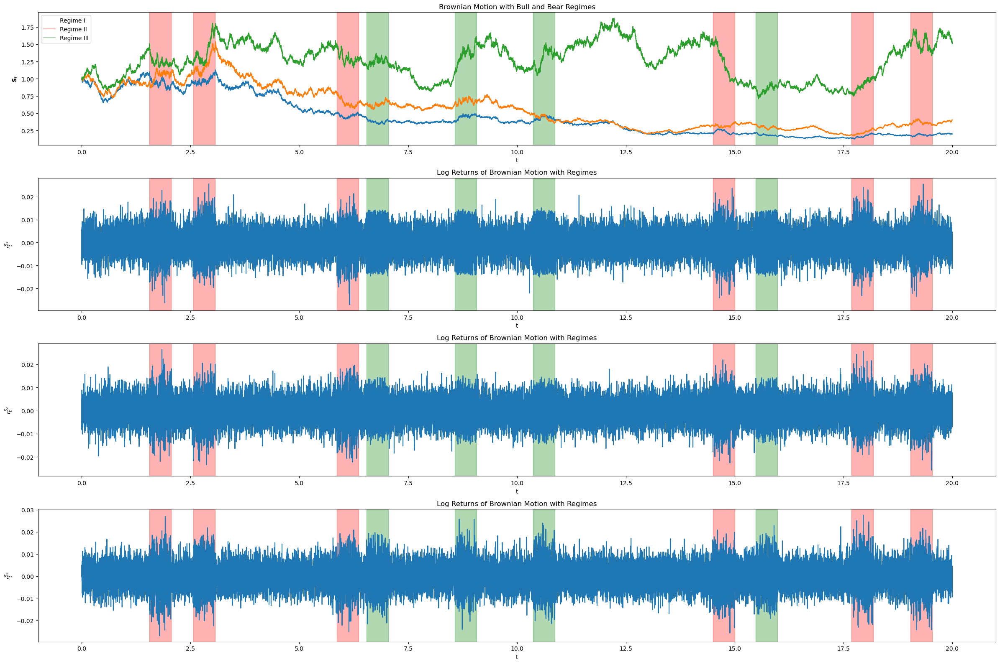

In [78]:
# Simulate 3D Brownian motion for bear and bull markets
S0 = 1
T = 20
dt = 1/(252*7)
d = 3
theta_bull = (0.02, 0.2)
theta_bear = (-0.02, 0.3)
rho_bull = 0.5
rho_bear = 0.5
rho_moon = 0.5
n_bear_periods = 10
bear_duration_years = 1.0
noise = 0.05
K = 3

t, S, bear_starts, true_regimes = syn_data.brownian_motion_mult_regime_D(S0, theta_bull, theta_bear, T, dt, d, rho_bull, rho_bear, rho_moon, noise, n_bear_periods, bear_duration_years)


syn_data.visualize_synthetic_data(t, S, bear_starts, K, true_regimes)

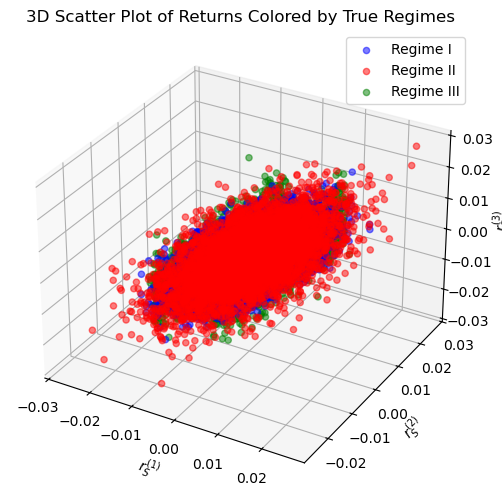

In [79]:
importlib.reload(syn_data)
syn_data.visualize_scatter_3D_returns(t, S, K, true_regimes[1:])

### Unifortho Algorithm

In [84]:
importlib.reload(ws)
import time 
L = 100 # 20, 40, 60, 80, 100
epsilon = 1e-6
h1 = 60
h2 = 12
K = 3
N_S = 20


# multiple runs of the unifortho sliced wasserstein clustering to get a maximum performance metric
r_s_true_regime = true_regimes[1:]

# time
start_time = time.perf_counter()
projected_emp_dist, centroids, labels = ws.max_acc_unifortho_sim(N_S, S, r_s_true_regime, K, L, epsilon, h1, h2, test=True)
# 3. Stop the timer
end_time = time.perf_counter()
# 4. Calculate and print the difference
execution_time = end_time - start_time
print(f"Simulation completed in {execution_time:.2f} seconds.")

Convergence reached based on centroid changes.
Simulation 1/20 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 2/20 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 3/20 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 4/20 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 5/20 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 6/20 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 7/20 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 8/20 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 9/20 completed. Evaluating accuracy...
Convergence reached based on centroid changes.
Simulation 10/20 completed. Evaluating accuracy...
Convergence reached based on 

### Visualize clustering performance of the UnifOrtho Sliced Wasserstein k-means clustering algorithm

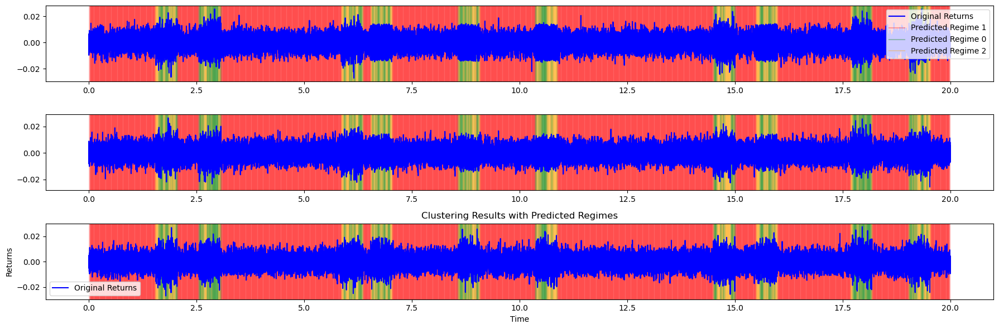

In [85]:
importlib.reload(mt)
mt.visualize_clustering_results(t, S, labels, h1, h2,K=3)

### Total Accuracy (TA)

In [86]:
importlib.reload(mt)

r_s_true_regime = true_regimes[1:]
accuracy = mt.total_accuracy(S,r_s_true_regime, labels, h1, h2)
print("Total Accuracy:", accuracy)

balanced_acc = mt.balanced_accuracy(S, r_s_true_regime, labels, h1, h2)
print("Balanced Accuracy:", balanced_acc)

mspd = mt.mean_squared_point_centroid_distance(centroids, labels, projected_emp_dist, K, p=2)

print("Mean Squared Point Centroid Distance:", mspd)

mccd = mt.mean_centroid_centroid_distance(centroids,K, p=2)
print("Mean Centroid Centroid Distance:", mccd)


Total Accuracy: 0.8863629921483035
Balanced Accuracy: 0.7053728494265875
Mean Squared Point Centroid Distance: 1.4691104484455097e-06
Mean Centroid Centroid Distance: 0.0018784724886693836


### Confusion Matrix 

Text(0.5, 1.0, 'Confusion Matrix: Regime Classification')

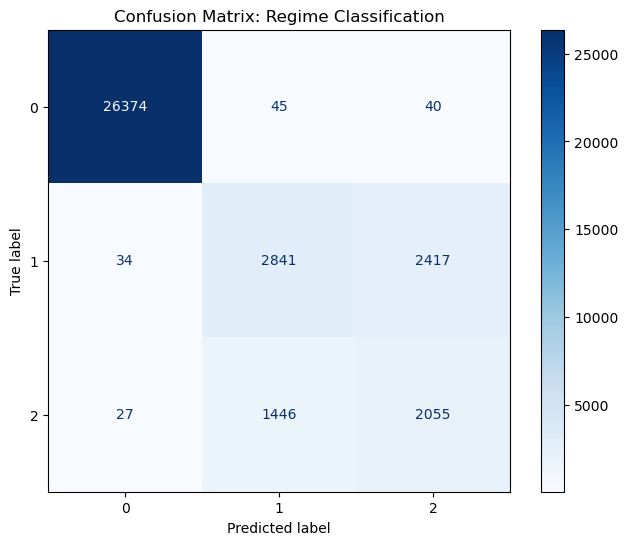

In [87]:
importlib.reload(mt)

cm = mt.confusion_matrix_WS(S, r_s_true_regime, labels, h1, h2)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1,2])

fig, ax = plt.subplots(figsize=(8, 6))
disp.plot(cmap=plt.cm.Blues, ax=ax)

plt.title('Confusion Matrix: Regime Classification')

## (1.5) General Results of Unifortho 

Testing the sliced Wasserstein k-means clustering algorithm for different values of $h1$, $h2$, $L$ 

### 2D Benchmark of UnifOrtho  

#### Type A and B Benchmarking 

In [4]:
theta_bull = (0.02, 0.2)
theta_bear = (-0.02,0.3)
importlib.reload(mt)
importlib.reload(ws)

d = 2
N_C = 50 # number of simulations for each hyperparameter combination

# Type A Simulations 
# Simulate 2D Brownian motion for bear and bull markets
S0 = 1
K = 2
T = 20
dt = 1/(252*7)
rho = 0.5
n_bear_periods = 10
bear_duration_years = 1.0
t_A, S_A, bear_starts_A, true_regimes_A = syn_data.brownian_motion_mult_regime_A(S0, theta_bull, theta_bear, T, dt, d, rho, n_bear_periods, bear_duration_years)

#Type B Simulations 
# Simulate 2D Brownian motion for bear and bull markets
S0 = 1
T = 20
dt = 1/(252*7)
rho_bull = 0.5
rho_bear = -0.5
n_bear_periods = 10
bear_duration_years = 1.0
epsilon = 1e-6
t_B, S_B, bear_starts_B, true_regimes_B = syn_data.brownian_motion_mult_regime_B(S0, theta_bull, theta_bear, T, dt, d, rho_bull, rho_bear, n_bear_periods, bear_duration_years)

liste_h1_h2 = [(10,2), (20,4), (30,6), (35,7)]
liste_L = [2,4,9,16]
results = []

#Type A Simulations 
for h1, h2 in liste_h1_h2:
    for L in liste_L:
        print("Running simulation with h1 =", h1, ", h2 =", h2, " and L =", L, " for Type A,B data...")
        max_accuracy_A, median_accuracy_A, max_mccd_A = mt.simulate_unifortho_data(N_S=N_C, S=S_A, true_regimes=true_regimes_A[1:], K=K, L=L, epsilon=epsilon, h1=h1, h2=h2, total_acc=True)
        print("-----Finished simulation with h1 =", h1, ", h2 =", h2, " and L =", L, " for Type A data. Max Accuracy:", max_accuracy_A,'-----')
        max_accuracy_B, median_accuracy_B, max_mccd_B = mt.simulate_unifortho_data(N_S=N_C, S=S_B, true_regimes=true_regimes_B[1:], K=K, L=L, epsilon=epsilon, h1=h1, h2=h2, total_acc=True)
        print("-----Finished simulation with h1 =", h1, ", h2 =", h2, " and L =", L, " for Type B data. Max Accuracy:", max_accuracy_B,'-----')
        results.append((h1, h2, L, max_accuracy_A, max_accuracy_B, median_accuracy_A, median_accuracy_B, max_mccd_A, max_mccd_B))

Running simulation with h1 = 10 , h2 = 2  and L = 2  for Type A,B data...
Simulation 1/50 completed. Evaluating Performance Metrics...
Simulation 2/50 completed. Evaluating Performance Metrics...
Simulation 3/50 completed. Evaluating Performance Metrics...
Simulation 4/50 completed. Evaluating Performance Metrics...
Simulation 5/50 completed. Evaluating Performance Metrics...
Simulation 6/50 completed. Evaluating Performance Metrics...
Simulation 7/50 completed. Evaluating Performance Metrics...
Simulation 8/50 completed. Evaluating Performance Metrics...
Simulation 9/50 completed. Evaluating Performance Metrics...
Simulation 10/50 completed. Evaluating Performance Metrics...
Simulation 11/50 completed. Evaluating Performance Metrics...
Simulation 12/50 completed. Evaluating Performance Metrics...
Simulation 13/50 completed. Evaluating Performance Metrics...
Simulation 14/50 completed. Evaluating Performance Metrics...
Simulation 15/50 completed. Evaluating Performance Metrics...
Simul

[3, 4, 5, 6, 7, 8]


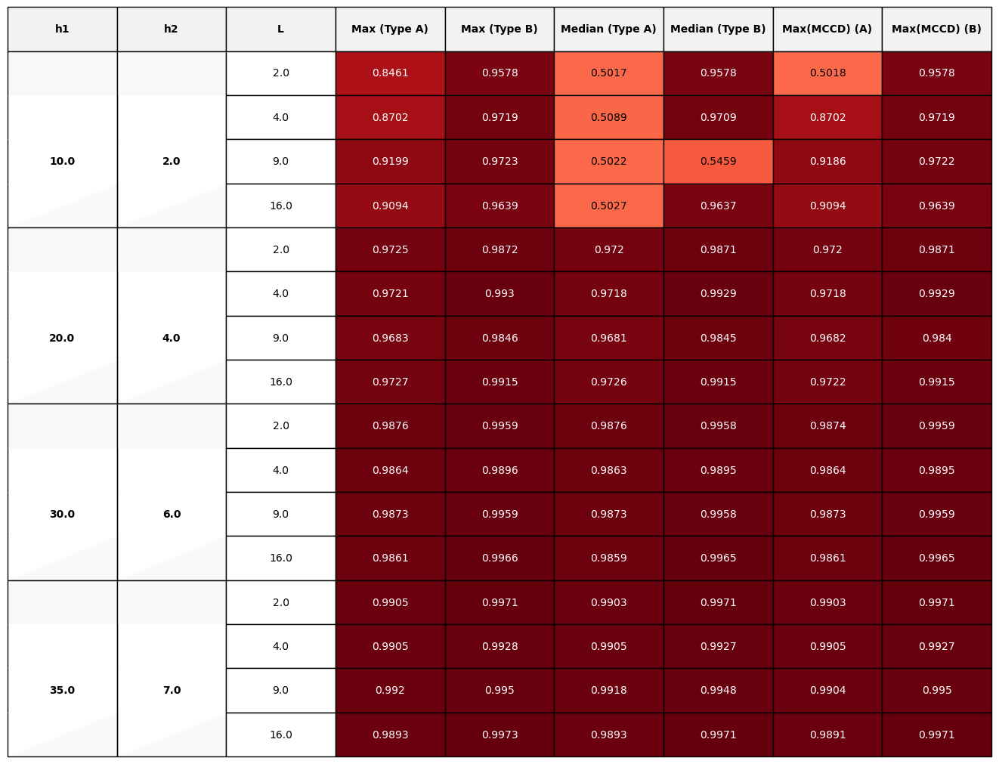

In [5]:
importlib.reload(mt)
results_AB = results
mt.display_results(N_C,results_AB, liste_L,liste_h1_h2, types=['A', 'B'])

#### Type C and D Benchmarking 

In [6]:
theta_bull = (0.02, 0.2)
theta_bear = (-0.02,0.3)
importlib.reload(mt)
d = 2 
N_C = 50 # number of simulations for each hyperparameter combination

# Type C Simulations
S0 = 1
T = 20
dt = 1/(252*7)
K = 3
rho_bull = 0.5
rho_bear_1 = 0.5
rho_bear_2 = -0.5
n_bear_periods = 10
bear_duration_years = 1.0
importlib.reload(syn_data)

t_C, S_C, bear_starts_C, true_regimes_C = syn_data.brownian_motion_mult_regime_C(S0, theta_bull, theta_bear, T, dt, d, rho_bull, rho_bear_1, rho_bear_2, n_bear_periods, bear_duration_years)


# Type D Simulations


S0 = 1
T = 20
dt = 1/(252*7)
theta_bull = (0.02, 0.2)
theta_bear = (-0.02, 0.3)
rho_bull = 0.5
rho_bear = 0.5
rho_moon = 0.5
bear_periods = 10
bear_duration_years = 1.0
noise = 0.05
K = 3

t_D, S_D, bear_starts_D, true_regimes_D = syn_data.brownian_motion_mult_regime_D(S0, theta_bull, theta_bear, T, dt, d, rho_bull, rho_bear, rho_moon, noise, n_bear_periods, bear_duration_years)



liste_h1_h2 = [(20,4), (30,6), (40,8), (50,10), (60,12)]
liste_L = [2,4,9,16]
results = []

#Type C,D Simulations
for h1, h2 in liste_h1_h2:
    for L in liste_L:
        print("Running simulation with h1 =", h1, ", h2 =", h2, " and L =", L, " for Type C,D data...")
        max_accuracy_C, median_accuracy_C, max_mccd_C = mt.simulate_unifortho_data(N_S=N_C, S=S_C, true_regimes=true_regimes_C[1:], K=K, L=L, epsilon=epsilon, h1=h1, h2=h2, total_acc=True)
        print("-----For Type C data. Max Accuracy:", max_accuracy_C,'-----', "Median Accuracy:", median_accuracy_C)
        max_accuracy_D, median_accuracy_D, max_mccd_D = mt.simulate_unifortho_data(N_S=N_C, S=S_D, true_regimes=true_regimes_D[1:], K=K, L=L, epsilon=epsilon, h1=h1, h2=h2, total_acc=True)
        print("-----For Type D data. Max Accuracy:", max_accuracy_D,'-----', "Median Accuracy:", median_accuracy_D)
        results.append((h1, h2, L, max_accuracy_C, max_accuracy_D, median_accuracy_C, median_accuracy_D, max_mccd_C, max_mccd_D))

Running simulation with h1 = 20 , h2 = 4  and L = 2  for Type C,D data...
Simulation 1/50 completed. Evaluating Performance Metrics...
Simulation 2/50 completed. Evaluating Performance Metrics...
Simulation 3/50 completed. Evaluating Performance Metrics...
Simulation 4/50 completed. Evaluating Performance Metrics...
Simulation 5/50 completed. Evaluating Performance Metrics...
Simulation 6/50 completed. Evaluating Performance Metrics...
Simulation 7/50 completed. Evaluating Performance Metrics...
Simulation 8/50 completed. Evaluating Performance Metrics...
Simulation 9/50 completed. Evaluating Performance Metrics...
Simulation 10/50 completed. Evaluating Performance Metrics...
Simulation 11/50 completed. Evaluating Performance Metrics...
Simulation 12/50 completed. Evaluating Performance Metrics...
Simulation 13/50 completed. Evaluating Performance Metrics...
Simulation 14/50 completed. Evaluating Performance Metrics...
Simulation 15/50 completed. Evaluating Performance Metrics...
Simul

[3, 4, 5, 6, 7, 8]


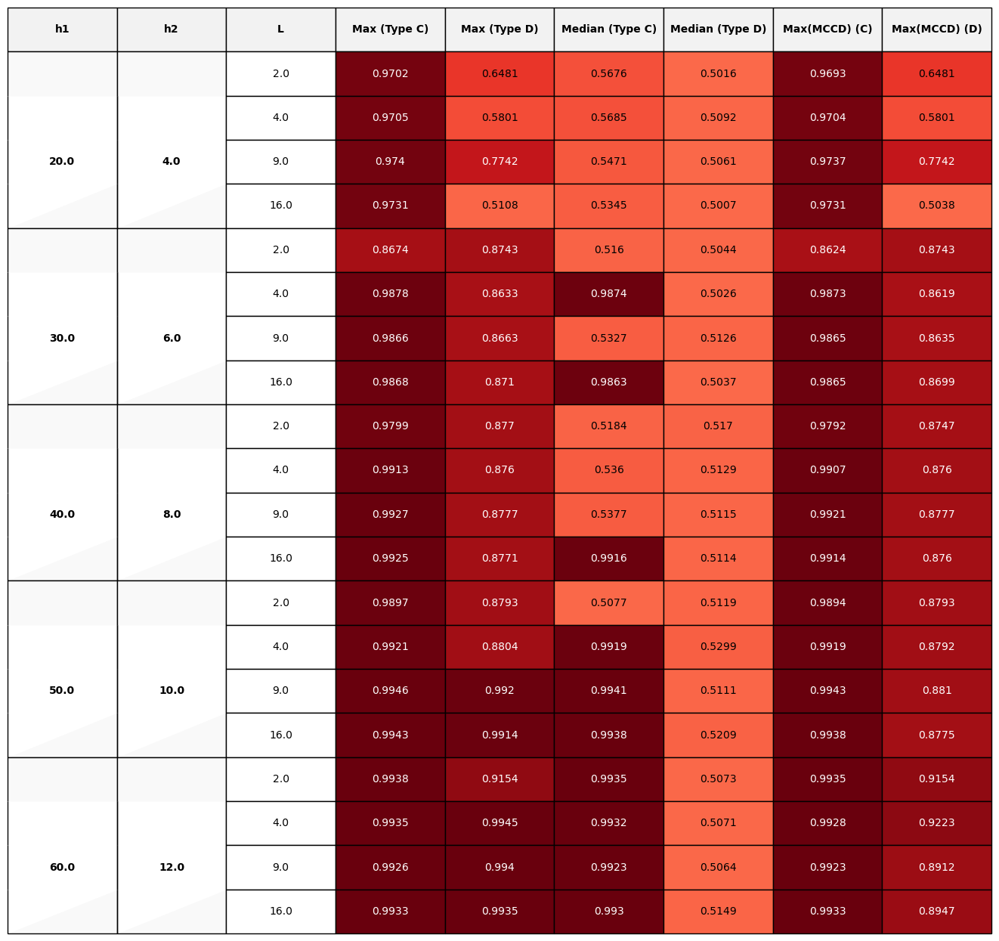

In [7]:
importlib.reload(mt)
results_CD = results
mt.display_results(N_C,results_CD, liste_L,liste_h1_h2, types=['C', 'D'])

### 3D Data 

#### Type A and B Benchmarking 

In [8]:
theta_bull = (0.02, 0.2)
theta_bear = (-0.02,0.3)
importlib.reload(mt)
importlib.reload(ws)


N_C = 50 # number of simulations for each hyperparameter combination

# Type A Simulations 
# Simulate 2D Brownian motion for bear and bull markets
S0 = 1
K = 2
T = 20
dt = 1/(252*7)
d = 3
rho = 0.5
n_bear_periods = 10
bear_duration_years = 1.0
t_A, S_A, bear_starts_A, true_regimes_A = syn_data.brownian_motion_mult_regime_A(S0, theta_bull, theta_bear, T, dt, d, rho, n_bear_periods, bear_duration_years)

#Type B Simulations 
# Simulate 2D Brownian motion for bear and bull markets
S0 = 1
T = 20
dt = 1/(252*7)
d = 3
rho_bull = 0.5
rho_bear = -0.5
n_bear_periods = 10
bear_duration_years = 1.0
t_B, S_B, bear_starts_B, true_regimes_B = syn_data.brownian_motion_mult_regime_B(S0, theta_bull, theta_bear, T, dt, d, rho_bull, rho_bear, n_bear_periods, bear_duration_years)

liste_h1_h2 = [(20,4), (30,6), (35,7)]
liste_L = [9,16, 20, 40]
results = []

#Type A Simulations 
for h1, h2 in liste_h1_h2:
    for L in liste_L:
        print("Running simulation with h1 =", h1, ", h2 =", h2, " and L =", L, " for Type A,B data...")
        max_accuracy_A, median_accuracy_A, max_mccd_A = mt.simulate_unifortho_data(N_S=N_C, S=S_A, true_regimes=true_regimes_A[1:], K=K, L=L, epsilon=epsilon, h1=h1, h2=h2, total_acc=True)
        print("-----Finished simulation with h1 =", h1, ", h2 =", h2, " and L =", L, " for Type A data. Max Accuracy:", max_accuracy_A,'-----')
        max_accuracy_B, median_accuracy_B, max_mccd_B = mt.simulate_unifortho_data(N_S=N_C, S=S_B, true_regimes=true_regimes_B[1:], K=K, L=L, epsilon=epsilon, h1=h1, h2=h2, total_acc=True)
        print("-----Finished simulation with h1 =", h1, ", h2 =", h2, " and L =", L, " for Type B data. Max Accuracy:", max_accuracy_B,'-----')
        results.append((h1, h2, L, max_accuracy_A, max_accuracy_B, median_accuracy_A, median_accuracy_B, max_mccd_A, max_mccd_B))

Running simulation with h1 = 20 , h2 = 4  and L = 9  for Type A,B data...
Simulation 1/50 completed. Evaluating Performance Metrics...
Simulation 2/50 completed. Evaluating Performance Metrics...
Simulation 3/50 completed. Evaluating Performance Metrics...
Simulation 4/50 completed. Evaluating Performance Metrics...
Simulation 5/50 completed. Evaluating Performance Metrics...
Simulation 6/50 completed. Evaluating Performance Metrics...
Simulation 7/50 completed. Evaluating Performance Metrics...
Simulation 8/50 completed. Evaluating Performance Metrics...
Simulation 9/50 completed. Evaluating Performance Metrics...
Simulation 10/50 completed. Evaluating Performance Metrics...
Simulation 11/50 completed. Evaluating Performance Metrics...
Simulation 12/50 completed. Evaluating Performance Metrics...
Simulation 13/50 completed. Evaluating Performance Metrics...
Simulation 14/50 completed. Evaluating Performance Metrics...
Simulation 15/50 completed. Evaluating Performance Metrics...
Simul

[3, 4, 5, 6, 7, 8]


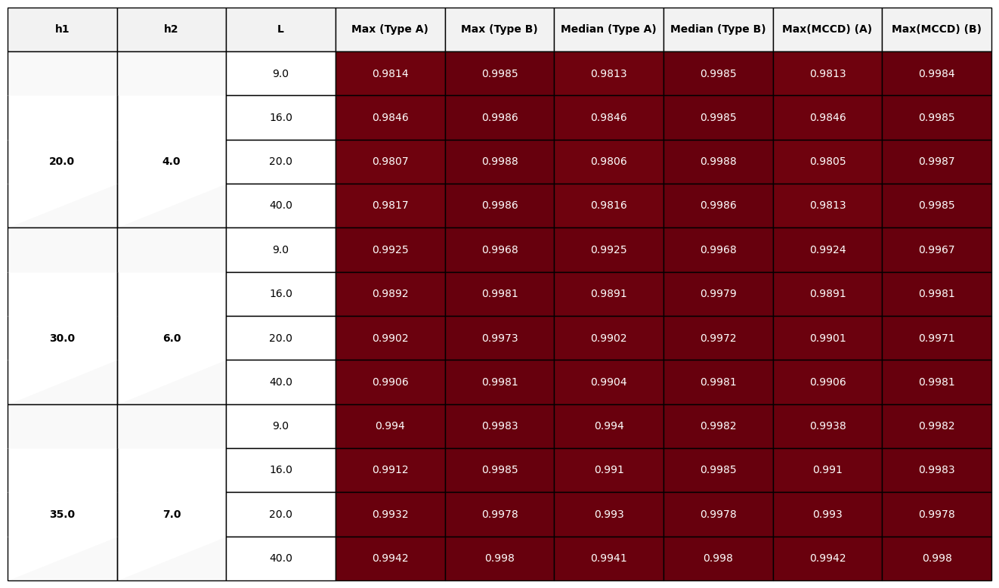

In [9]:
importlib.reload(mt)
results_AB = results
mt.display_results(N_C,results_AB, liste_L,liste_h1_h2, types=['A', 'B'])

#### Type C and D Benchmarking 

In [10]:
theta_bull = (0.02, 0.2)
theta_bear = (-0.02,0.3)
epsilon = 1e-6
importlib.reload(mt)

N_C = 50 # number of simulations for each hyperparameter combination

# Type C Simulations
S0 = 1
T = 20
dt = 1/(252*7)
d = 3
K = 3
rho_bull = 0.5
rho_bear_1 = 0.5
rho_bear_2 = -0.5
n_bear_periods = 10
bear_duration_years = 1.0
importlib.reload(syn_data)

t_C, S_C, bear_starts_C, true_regimes_C = syn_data.brownian_motion_mult_regime_C(S0, theta_bull, theta_bear, T, dt, d, rho_bull, rho_bear_1, rho_bear_2, n_bear_periods, bear_duration_years)


# Type D Simulations


S0 = 1
T = 20
dt = 1/(252*7)
d = 3
theta_bull = (0.02, 0.2)
theta_bear = (-0.02, 0.3)
rho_bull = 0.5
rho_bear = 0.5
rho_moon = 0.5
n_bear_periods = 10
bear_duration_years = 1.0
noise = 0.05
K = 3

t_D, S_D, bear_starts_D, true_regimes_D = syn_data.brownian_motion_mult_regime_D(S0, theta_bull, theta_bear, T, dt, d, rho_bull, rho_bear, rho_moon, noise, n_bear_periods, bear_duration_years)



liste_h1_h2 = [(20,4), (30,6), (40,8), (50,10), (60,12)]
liste_L = [9,16, 20, 40]
results = []

#Type C,D Simulations
for h1, h2 in liste_h1_h2:
    for L in liste_L:
        print("Running simulation with h1 =", h1, ", h2 =", h2, " and L =", L, " for Type C,D data...")
        max_accuracy_C, median_accuracy_C,max_mccd_C = mt.simulate_unifortho_data(N_S=N_C, S=S_C, true_regimes=true_regimes_C[1:], K=K, L=L, epsilon=epsilon, h1=h1, h2=h2, total_acc=True)
        print("-----For Type C data. Max Accuracy:", max_accuracy_C,'-----', "Median Accuracy:", median_accuracy_C)
        max_accuracy_D, median_accuracy_D, max_mccd_D = mt.simulate_unifortho_data(N_S=N_C, S=S_D, true_regimes=true_regimes_D[1:], K=K, L=L, epsilon=epsilon, h1=h1, h2=h2, total_acc=True)
        print("-----For Type D data. Max Accuracy:", max_accuracy_D,'-----', "Median Accuracy:", median_accuracy_D)
        results.append((h1, h2, L, max_accuracy_C, max_accuracy_D, median_accuracy_C, median_accuracy_D, max_mccd_C, max_mccd_D))

Running simulation with h1 = 20 , h2 = 4  and L = 9  for Type C,D data...
Simulation 1/50 completed. Evaluating Performance Metrics...
Simulation 2/50 completed. Evaluating Performance Metrics...
Simulation 3/50 completed. Evaluating Performance Metrics...
Simulation 4/50 completed. Evaluating Performance Metrics...
Simulation 5/50 completed. Evaluating Performance Metrics...
Simulation 6/50 completed. Evaluating Performance Metrics...
Simulation 7/50 completed. Evaluating Performance Metrics...
Simulation 8/50 completed. Evaluating Performance Metrics...
Simulation 9/50 completed. Evaluating Performance Metrics...
Simulation 10/50 completed. Evaluating Performance Metrics...
Simulation 11/50 completed. Evaluating Performance Metrics...
Simulation 12/50 completed. Evaluating Performance Metrics...
Simulation 13/50 completed. Evaluating Performance Metrics...
Simulation 14/50 completed. Evaluating Performance Metrics...
Simulation 15/50 completed. Evaluating Performance Metrics...
Simul

[3, 4, 5, 6, 7, 8]


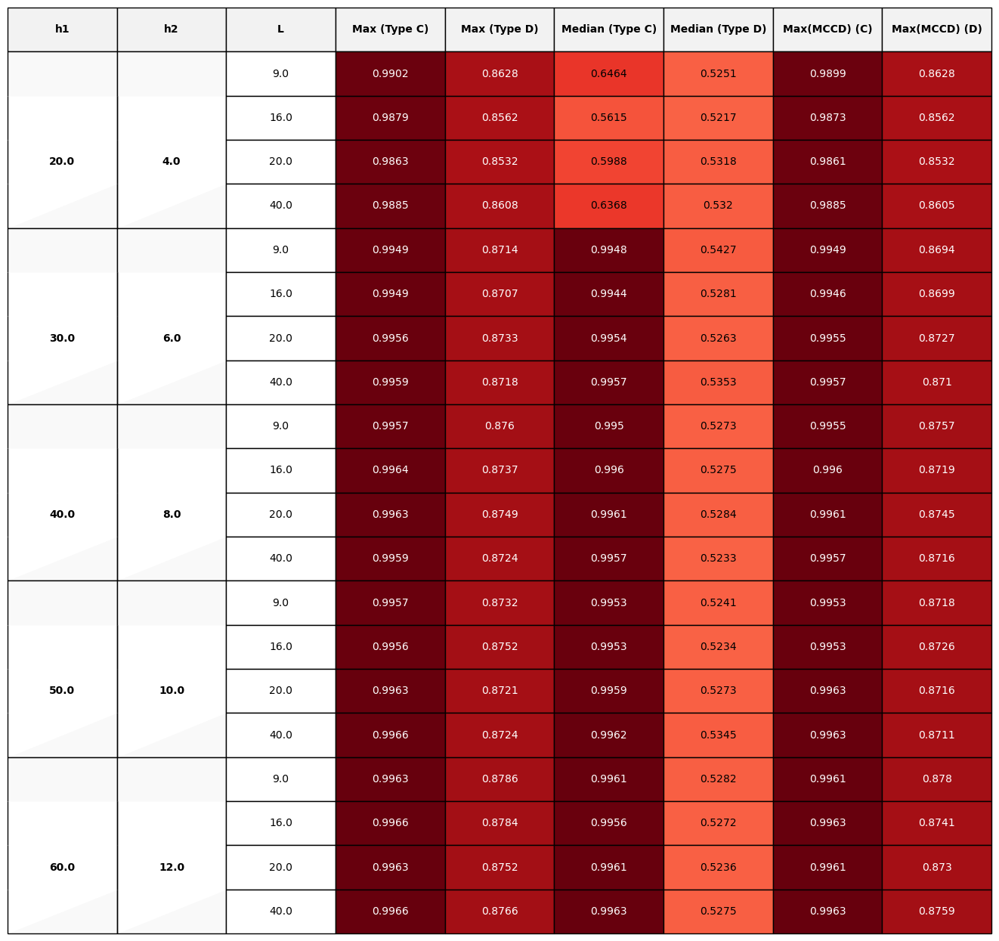

In [11]:
importlib.reload(mt)
results_CD = results
mt.display_results(N_C,results_CD, liste_L,liste_h1_h2, types=['C', 'D'])

### 4D Data 


#### Type A and B Benchmarking 

In [12]:
theta_bull = (0.02, 0.2)
theta_bear = (-0.02,0.3)
importlib.reload(mt)
importlib.reload(ws)


N_C = 50  # number of simulations for each hyperparameter combination
# Type A Simulations 
# Simulate 4D Brownian motion for bear and bull markets
S0 = 1
K = 2
T = 20
dt = 1/(252*7)
d = 4
rho = 0.5
n_bear_periods = 10
bear_duration_years = 1.0
t_A, S_A, bear_starts_A, true_regimes_A = syn_data.brownian_motion_mult_regime_A(S0, theta_bull, theta_bear, T, dt, d, rho, n_bear_periods, bear_duration_years)

# #Type B Simulations 
# # Simulate 4D Brownian motion for bear and bull markets
S0 = 1
T = 20
dt = 1/(252*7)
d = 4
rho_bull = 0.5
rho_bear = -0.5
n_bear_periods = 10
bear_duration_years = 1.0
t_B, S_B, bear_starts_B, true_regimes_B = syn_data.brownian_motion_mult_regime_B(S0, theta_bull, theta_bear, T, dt, d, rho_bull, rho_bear, n_bear_periods, bear_duration_years)

liste_h1_h2 = [(20,4), (30,6), (35,7)]
liste_L = [9,16, 20, 40]
results = []

# #Type A Simulations 
for h1, h2 in liste_h1_h2:
    for L in liste_L:
        print("Running simulation with h1 =", h1, ", h2 =", h2, " and L =", L, " for Type A,B data...")
        max_accuracy_A, median_accuracy_A, max_mccd_A = mt.simulate_unifortho_data(N_S=N_C, S=S_A, true_regimes=true_regimes_A[1:], K=K, L=L, epsilon=epsilon, h1=h1, h2=h2, total_acc=True)
        print("-----Finished simulation with h1 =", h1, ", h2 =", h2, " and L =", L, " for Type A data. Max Accuracy:", max_accuracy_A,'-- Median Accuracy:', median_accuracy_A)
        max_accuracy_B, median_accuracy_B, max_mccd_B = mt.simulate_unifortho_data(N_S=N_C, S=S_B, true_regimes=true_regimes_B[1:], K=K, L=L, epsilon=epsilon, h1=h1, h2=h2, total_acc=True)
        print("-----Finished simulation with h1 =", h1, ", h2 =", h2, " and L =", L, " for Type B data. Max Accuracy:", max_accuracy_B,'-- Median Accuracy:', median_accuracy_B)
        results.append((h1, h2, L, max_accuracy_A, max_accuracy_B, median_accuracy_A, median_accuracy_B, max_mccd_A, max_mccd_B))




/Users/oscarpeyron/Downloads/003_ETUDE_POST_BAC/MASTER_UCL_COMP_FINANCE/T3/ADIA/src/synthetic_data.py:153:RuntimeWarning: covariance is not symmetric positive-semidefinite.


Running simulation with h1 = 20 , h2 = 4  and L = 9  for Type A,B data...
Simulation 1/50 completed. Evaluating Performance Metrics...
Simulation 2/50 completed. Evaluating Performance Metrics...
Simulation 3/50 completed. Evaluating Performance Metrics...
Simulation 4/50 completed. Evaluating Performance Metrics...
Simulation 5/50 completed. Evaluating Performance Metrics...
Simulation 6/50 completed. Evaluating Performance Metrics...
Simulation 7/50 completed. Evaluating Performance Metrics...
Simulation 8/50 completed. Evaluating Performance Metrics...
Simulation 9/50 completed. Evaluating Performance Metrics...
Simulation 10/50 completed. Evaluating Performance Metrics...
Simulation 11/50 completed. Evaluating Performance Metrics...
Simulation 12/50 completed. Evaluating Performance Metrics...
Simulation 13/50 completed. Evaluating Performance Metrics...
Simulation 14/50 completed. Evaluating Performance Metrics...
Simulation 15/50 completed. Evaluating Performance Metrics...
Simul

[3, 4, 5, 6, 7, 8]


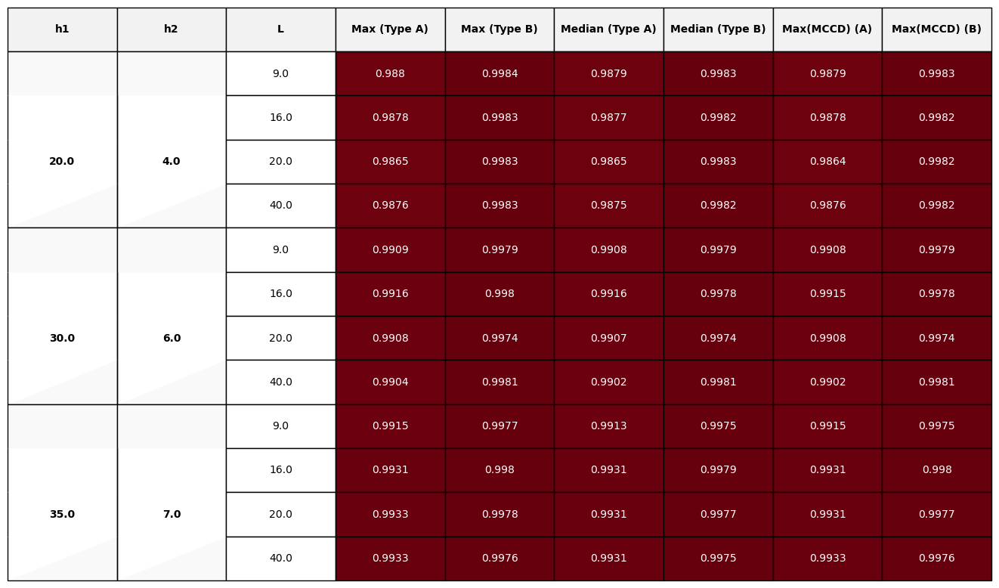

In [13]:
importlib.reload(mt)
results_AB = results
mt.display_results(N_C,results_AB, liste_L,liste_h1_h2, types=['A', 'B'])

#### Type C and D Benchmarking 

In [14]:
theta_bull = (0.02, 0.2)
theta_bear = (-0.02,0.3)
importlib.reload(mt)

N_C = 50 # number of simulations for each hyperparameter combination

# Type C Simulations
S0 = 1
T = 20
dt = 1/(252*7)
d = 4
K = 3
rho_bull = 0.5
rho_bear_1 = 0.5
rho_bear_2 = -0.5
n_bear_periods = 10
bear_duration_years = 1.0
importlib.reload(syn_data)

t_C, S_C, bear_starts_C, true_regimes_C = syn_data.brownian_motion_mult_regime_C(S0, theta_bull, theta_bear, T, dt, d, rho_bull, rho_bear_1, rho_bear_2, n_bear_periods, bear_duration_years)


# Type D Simulations


S0 = 1
T = 20
dt = 1/(252*7)
d = 4
theta_bull = (0.02, 0.2)
theta_bear = (-0.02, 0.3)
rho_bull = 0.5
rho_bear = 0.5
rho_moon = 0.5
n_bear_periods = 10
bear_duration_years = 1.0
noise = 0.05
K = 3

t_D, S_D, bear_starts_D, true_regimes_D = syn_data.brownian_motion_mult_regime_D(S0, theta_bull, theta_bear, T, dt, d, rho_bull, rho_bear, rho_moon, noise, n_bear_periods, bear_duration_years)



liste_h1_h2 = [(20,4), (30,6), (40,8), (50,10), (60,12)]
liste_L = [9,16, 20, 40]
results = []

#Type C,D Simulations
for h1, h2 in liste_h1_h2:
    for L in liste_L:
        print("Running simulation with h1 =", h1, ", h2 =", h2, " and L =", L, " for Type C,D data...")
        max_accuracy_C, median_accuracy_C,max_mccd_C = mt.simulate_unifortho_data(N_S=N_C, S=S_C, true_regimes=true_regimes_C[1:], K=K, L=L, epsilon=epsilon, h1=h1, h2=h2, total_acc=True)
        print("-----For Type C data. Max Accuracy:", max_accuracy_C,'-----', "Median Accuracy:", median_accuracy_C)
        max_accuracy_D, median_accuracy_D, max_mccd_D = mt.simulate_unifortho_data(N_S=N_C, S=S_D, true_regimes=true_regimes_D[1:], K=K, L=L, epsilon=epsilon, h1=h1, h2=h2, total_acc=True)
        print("-----For Type D data. Max Accuracy:", max_accuracy_D,'-----', "Median Accuracy:", median_accuracy_D)
        results.append((h1, h2, L, max_accuracy_C, max_accuracy_D, median_accuracy_C, median_accuracy_D, max_mccd_C, max_mccd_D))

/Users/oscarpeyron/Downloads/003_ETUDE_POST_BAC/MASTER_UCL_COMP_FINANCE/T3/ADIA/src/synthetic_data.py:223:RuntimeWarning: covariance is not symmetric positive-semidefinite.


Running simulation with h1 = 20 , h2 = 4  and L = 9  for Type C,D data...
Simulation 1/50 completed. Evaluating Performance Metrics...
Simulation 2/50 completed. Evaluating Performance Metrics...
Simulation 3/50 completed. Evaluating Performance Metrics...
Simulation 4/50 completed. Evaluating Performance Metrics...
Simulation 5/50 completed. Evaluating Performance Metrics...
Simulation 6/50 completed. Evaluating Performance Metrics...
Simulation 7/50 completed. Evaluating Performance Metrics...
Simulation 8/50 completed. Evaluating Performance Metrics...
Simulation 9/50 completed. Evaluating Performance Metrics...
Simulation 10/50 completed. Evaluating Performance Metrics...
Simulation 11/50 completed. Evaluating Performance Metrics...
Simulation 12/50 completed. Evaluating Performance Metrics...
Simulation 13/50 completed. Evaluating Performance Metrics...
Simulation 14/50 completed. Evaluating Performance Metrics...
Simulation 15/50 completed. Evaluating Performance Metrics...
Simul

[3, 4, 5, 6, 7, 8]


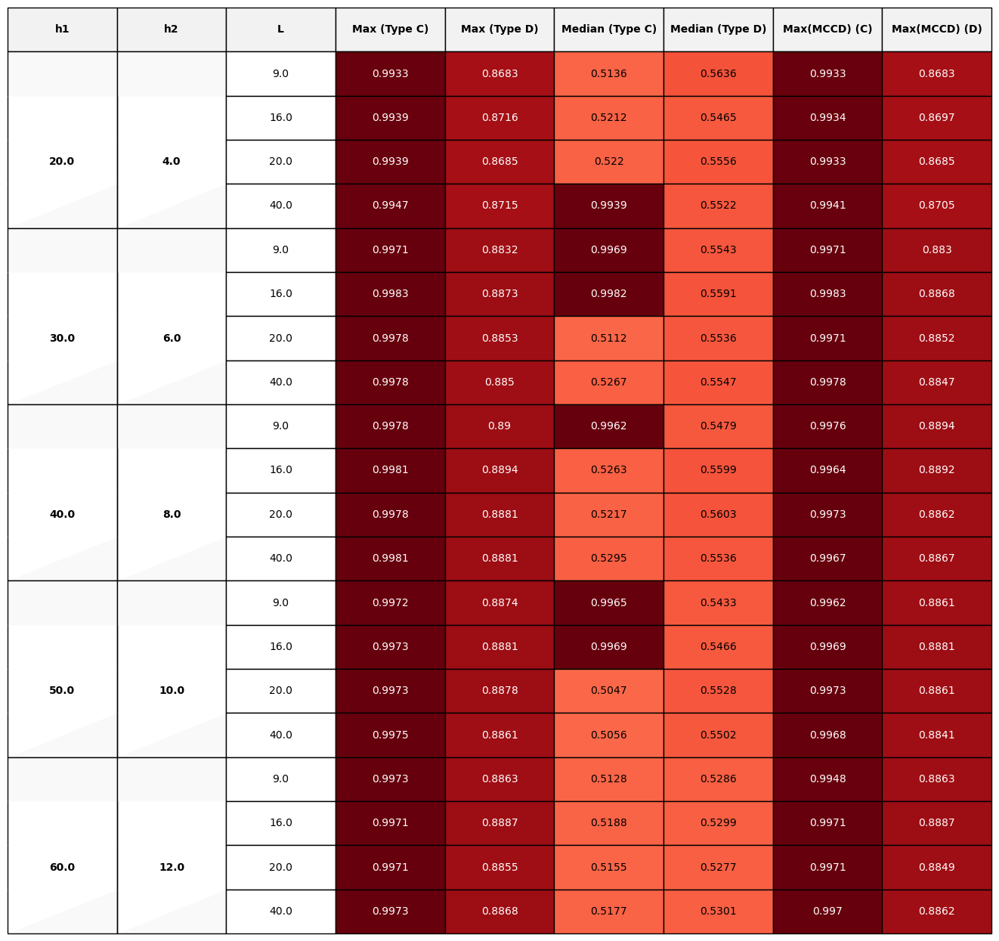

In [15]:
importlib.reload(mt)
results_CD = results
mt.display_results(N_C,results_CD, liste_L,liste_h1_h2, types=['C', 'D'])

### 5D Data 


### Type A and B Benchmarks 

In [17]:
theta_bull = (0.02, 0.2)
theta_bear = (-0.02,0.3)
importlib.reload(mt)
importlib.reload(ws)

d= 5
N_C = 50 # number of simulations for each hyperparameter combination

# Type A Simulations 
# Simulate 5D Brownian motion for bear and bull markets
S0 = 1
K = 2
T = 20
dt = 1/(252*7)

rho = 0.5
n_bear_periods = 10
bear_duration_years = 1.0
t_A, S_A, bear_starts_A, true_regimes_A = syn_data.brownian_motion_mult_regime_A(S0, theta_bull, theta_bear, T, dt, d, rho, n_bear_periods, bear_duration_years)

#Type B Simulations 
# Simulate 5D Brownian motion for bear and bull markets
S0 = 1
T = 20
dt = 1/(252*7)
rho_bull = 0.5
rho_bear = -0.5
n_bear_periods = 10
bear_duration_years = 1.0
t_B, S_B, bear_starts_B, true_regimes_B = syn_data.brownian_motion_mult_regime_B(S0, theta_bull, theta_bear, T, dt, d, rho_bull, rho_bear, n_bear_periods, bear_duration_years)

liste_h1_h2 = [(20,4), (30,6), (35,7)]
liste_L = [9,20, 40, 60]
results = []

#Type A Simulations 
for h1, h2 in liste_h1_h2:
    for L in liste_L:
        print("Running simulation with h1 =", h1, ", h2 =", h2, " and L =", L, " for Type A,B data...")
        max_accuracy_A, median_accuracy_A, max_mccd_A = mt.simulate_unifortho_data(N_S=N_C, S=S_A, true_regimes=true_regimes_A[1:], K=K, L=L, epsilon=epsilon, h1=h1, h2=h2, total_acc=True)
        print("-----Finished simulation with h1 =", h1, ", h2 =", h2, " and L =", L, " for Type A data. Max Accuracy:", max_accuracy_A,'-----')
        max_accuracy_B, median_accuracy_B, max_mccd_B = mt.simulate_unifortho_data(N_S=N_C, S=S_B, true_regimes=true_regimes_B[1:], K=K, L=L, epsilon=epsilon, h1=h1, h2=h2, total_acc=True)
        print("-----Finished simulation with h1 =", h1, ", h2 =", h2, " and L =", L, " for Type B data. Max Accuracy:", max_accuracy_B,'-----')
        results.append((h1, h2, L, max_accuracy_A, max_accuracy_B, median_accuracy_A, median_accuracy_B, max_mccd_A, max_mccd_B))

Running simulation with h1 = 20 , h2 = 4  and L = 9  for Type A,B data...
Simulation 1/50 completed. Evaluating Performance Metrics...
Simulation 2/50 completed. Evaluating Performance Metrics...
Simulation 3/50 completed. Evaluating Performance Metrics...
Simulation 4/50 completed. Evaluating Performance Metrics...
Simulation 5/50 completed. Evaluating Performance Metrics...
Simulation 6/50 completed. Evaluating Performance Metrics...
Simulation 7/50 completed. Evaluating Performance Metrics...
Simulation 8/50 completed. Evaluating Performance Metrics...
Simulation 9/50 completed. Evaluating Performance Metrics...
Simulation 10/50 completed. Evaluating Performance Metrics...
Simulation 11/50 completed. Evaluating Performance Metrics...
Simulation 12/50 completed. Evaluating Performance Metrics...
Simulation 13/50 completed. Evaluating Performance Metrics...
Simulation 14/50 completed. Evaluating Performance Metrics...
Simulation 15/50 completed. Evaluating Performance Metrics...
Simul

[3, 4, 5, 6, 7, 8]


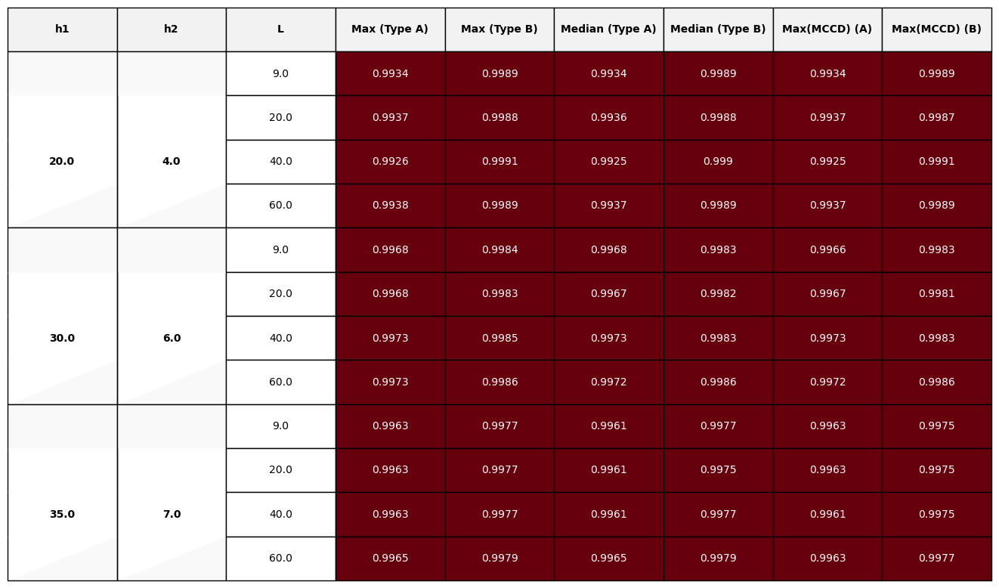

In [18]:
importlib.reload(mt)
results_AB = results
mt.display_results(N_C,results_AB, liste_L,liste_h1_h2, types=['A', 'B'])

### Type C and D Benchmarks 

In [3]:
theta_bull = (0.02, 0.2)
theta_bear = (-0.02,0.3)
importlib.reload(mt)

N_C = 50 # number of simulations for each hyperparameter combination

# Type C Simulations
S0 = 1
T = 20
dt = 1/(252*7)
d = 5
K = 3
rho_bull = 0.5
rho_bear_1 = 0.5
rho_bear_2 = -0.5
n_bear_periods = 10
bear_duration_years = 1.0
importlib.reload(syn_data)

t_C, S_C, bear_starts_C, true_regimes_C = syn_data.brownian_motion_mult_regime_C(S0, theta_bull, theta_bear, T, dt, d, rho_bull, rho_bear_1, rho_bear_2, n_bear_periods, bear_duration_years)


# Type D Simulations


S0 = 1
T = 20
dt = 1/(252*7)
d = 5
theta_bull = (0.02, 0.2)
theta_bear = (-0.02, 0.3)
rho_bull = 0.5
rho_bear = 0.5
rho_moon = 0.5
n_bear_periods = 10
bear_duration_years = 1.0
noise = 0.05
K = 3
epsilon = 1e-6
t_D, S_D, bear_starts_D, true_regimes_D = syn_data.brownian_motion_mult_regime_D(S0, theta_bull, theta_bear, T, dt, d, rho_bull, rho_bear, rho_moon, noise, n_bear_periods, bear_duration_years)



liste_h1_h2 = [(20,4), (30,6), (40,8), (50,10), (60,12)]
liste_L = [9,20, 40, 60]
results = []

#Type C,D Simulations
for h1, h2 in liste_h1_h2:
    for L in liste_L:
        print("Running simulation with h1 =", h1, ", h2 =", h2, " and L =", L, " for Type C,D data...")
        max_accuracy_C, median_accuracy_C,max_mccd_C = mt.simulate_unifortho_data(N_S=N_C, S=S_C, true_regimes=true_regimes_C[1:], K=K, L=L, epsilon=epsilon, h1=h1, h2=h2, total_acc=True)
        print("-----For Type C data. Max Accuracy:", max_accuracy_C,'-----', "Median Accuracy:", median_accuracy_C)
        max_accuracy_D, median_accuracy_D, max_mccd_D = mt.simulate_unifortho_data(N_S=N_C, S=S_D, true_regimes=true_regimes_D[1:], K=K, L=L, epsilon=epsilon, h1=h1, h2=h2, total_acc=True)
        print("-----For Type D data. Max Accuracy:", max_accuracy_D,'-----', "Median Accuracy:", median_accuracy_D)
        results.append((h1, h2, L, max_accuracy_C, max_accuracy_D, median_accuracy_C, median_accuracy_D, max_mccd_C, max_mccd_D))

Running simulation with h1 = 20 , h2 = 4  and L = 9  for Type C,D data...
Simulation 1/50 completed. Evaluating Performance Metrics...
Simulation 2/50 completed. Evaluating Performance Metrics...
Simulation 3/50 completed. Evaluating Performance Metrics...
Simulation 4/50 completed. Evaluating Performance Metrics...
Simulation 5/50 completed. Evaluating Performance Metrics...
Simulation 6/50 completed. Evaluating Performance Metrics...
Simulation 7/50 completed. Evaluating Performance Metrics...
Simulation 8/50 completed. Evaluating Performance Metrics...
Simulation 9/50 completed. Evaluating Performance Metrics...
Simulation 10/50 completed. Evaluating Performance Metrics...
Simulation 11/50 completed. Evaluating Performance Metrics...
Simulation 12/50 completed. Evaluating Performance Metrics...
Simulation 13/50 completed. Evaluating Performance Metrics...
Simulation 14/50 completed. Evaluating Performance Metrics...
Simulation 15/50 completed. Evaluating Performance Metrics...
Simul

[3, 4, 5, 6, 7, 8]


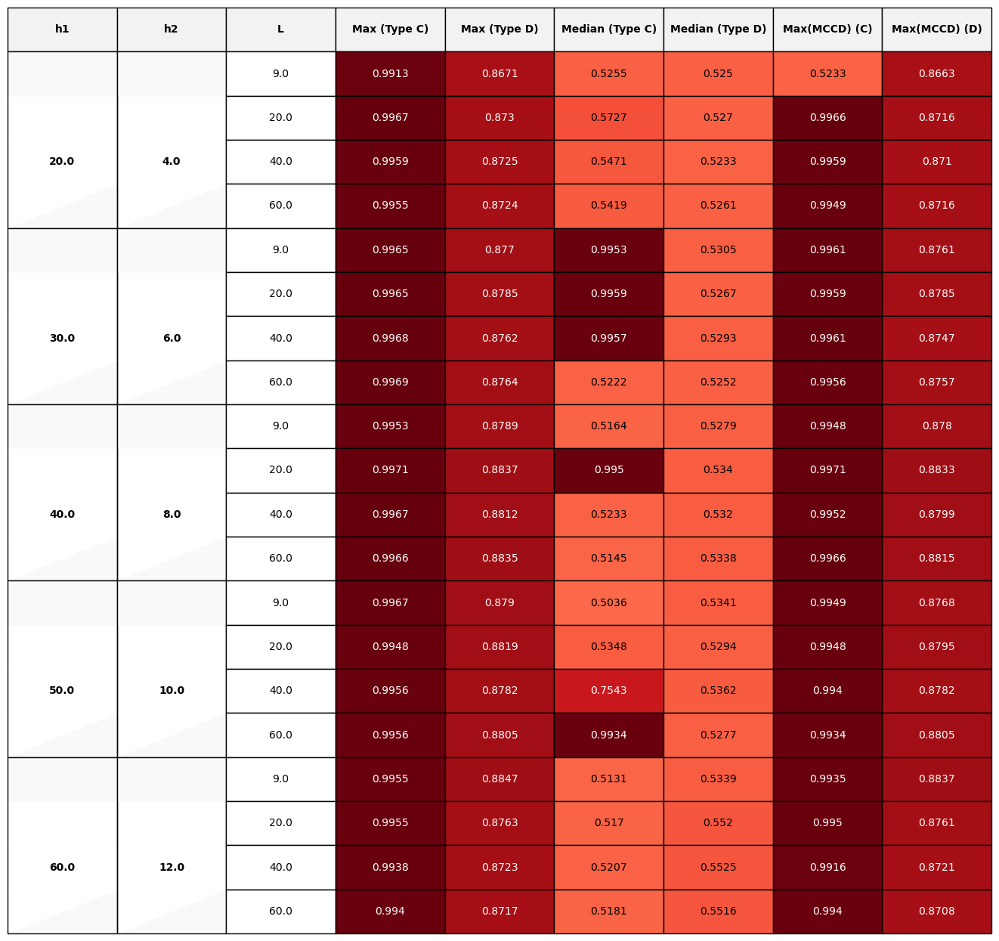

In [4]:
importlib.reload(mt)
results_CD = results
mt.display_results(N_C,results_CD, liste_L,liste_h1_h2, types=['C', 'D'])

# (2) Results on Real Data sets 

## (2.1) FX Spot Time Series Data (4D)

### (1) EURUSD, AUDUSD, USDJPY, USDCHF, USDCAD

### Data Preparation

In [2]:
# List of your cluster pairs
pairs = ['AUDUSD', 'EURUSD', 'USDCAD', 'USDCHF', 'USDJPY']

# Dictionary to hold dataframes
dfs = {}

for pair in pairs:
    # Load your downloaded file (adjust 'path/to/' and column names as needed)
    # Most forex CSVs use columns: Date, Time, Open, High, Low, Close
    df = pd.read_csv(f'data/g4_currencies/{pair}-2000-2020-15m.csv')
    # Set Date_Time as index and keep only the 'Close' price
    df.set_index('DATE_TIME', inplace=True)
    dfs[pair] = df['CLOSE']

currency_cluster = pd.concat(dfs.values(), axis=1, keys=dfs.keys())
currency_cluster.index = pd.to_datetime(currency_cluster.index, format='%Y.%m.%d %H:%M:%S')

# 2. IMPORTANT: Sort the index (required for .loc slicing)
currency_cluster = currency_cluster.sort_index()
# 3. Filter using a simpler date format 
# (Pandas handles partial string indexing, so you don't need the 00:00:00)
currency_cluster = currency_cluster.loc['2006-01-01':'2019-12-31']
currency_cluster.ffill(inplace=True)

# ---------------------------------------------------------
# RESAMPLING TO 7 MEASUREMENTS A DAY
# Note: A trading day is roughly 24 hours. 24 / 7 is ~3.4 hours.
# Most researchers use 4-hour (6 per day) or 3-hour (8 per day).
# To get exactly 7, we resample and take the first 7 samples of each day.
# ---------------------------------------------------------
currency_cluster = currency_cluster.resample('205min').first() # ~205 mins = 1/7 of a day
currency_cluster_7 = currency_cluster.groupby(currency_cluster.index.date).head(7)

#change colums AUDUSD, EURUSD -> USDAUD, USDEUR
for col in ['AUDUSD', 'EURUSD', 'USDCHF']:
    currency_cluster_7[col] = currency_cluster_7[col].apply(lambda x: 1/x)
currency_cluster_7.rename(columns={'AUDUSD': 'USDAUD', 'EURUSD': 'USDEUR'}, inplace=True)

currency_cluster_7.ffill(inplace=True)

,USDAUD,USDEUR,USDCAD,USDCHF,USDJPY
DATE_TIME,,,,,
2006-01-02 00:00:00,1.364443,0.844309,1.16320,0.760861,117.910
2006-01-02 03:25:00,1.362955,0.844024,1.16340,0.761209,117.610
2006-01-02 06:50:00,1.363512,0.845094,1.16130,0.760283,117.630
2006-01-02 10:15:00,1.362955,0.843668,1.16170,0.762253,117.890
2006-01-02 13:40:00,1.364443,0.845166,1.16190,0.761673,118.000
...,...,...,...,...,...
2019-12-31 04:35:00,1.427735,0.892085,1.30479,1.033389,108.649
2019-12-31 08:00:00,1.426981,0.892331,1.30474,1.033410,108.675
2019-12-31 11:25:00,1.426961,0.891862,1.30418,1.032844,108.619


### Vizualisation of the data 

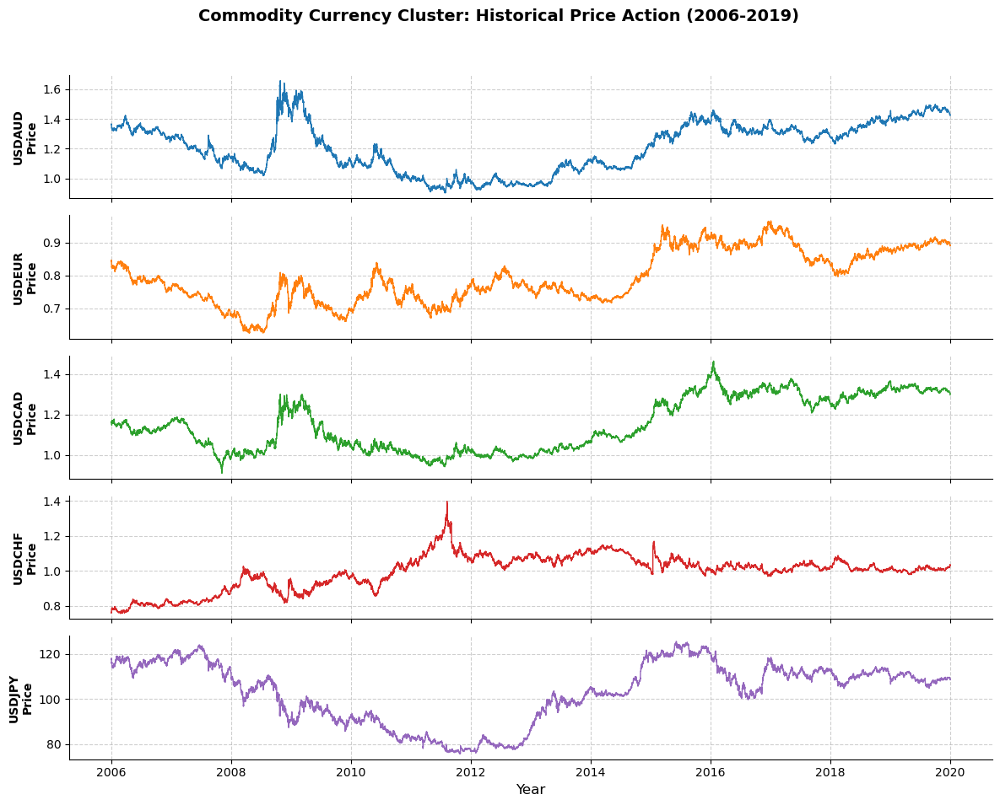

In [3]:
import matplotlib.dates as mdates
pairs = ['USDAUD', 'USDEUR', 'USDCAD', 'USDCHF', 'USDJPY']
# Adjust subplots to match the number of pairs exactly
fig, ax = plt.subplots(len(pairs), 1, figsize=(12, 10), sharex=True)

colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']
for i, pair in enumerate(pairs):
    ax[i].plot(currency_cluster_7.index, currency_cluster_7[pair], 
               color=colors[i], linewidth=1, label=pair)
    
    # Styling
    ax[i].set_ylabel(f"{pair}\nPrice", fontsize=10, fontweight='bold')
    ax[i].grid(True, linestyle='--', alpha=0.6)
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['right'].set_visible(False)
    
    # Set Date Formatting (Every 2 years for a 2006-2019 span)
    ax[i].xaxis.set_major_locator(mdates.YearLocator(2))
    ax[i].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

plt.xlabel("Year", fontsize=12)
plt.suptitle("Commodity Currency Cluster: Historical Price Action (2006-2019)", 
             fontsize=14, fontweight='bold', y=0.98)

plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust for suptitle
plt.show()

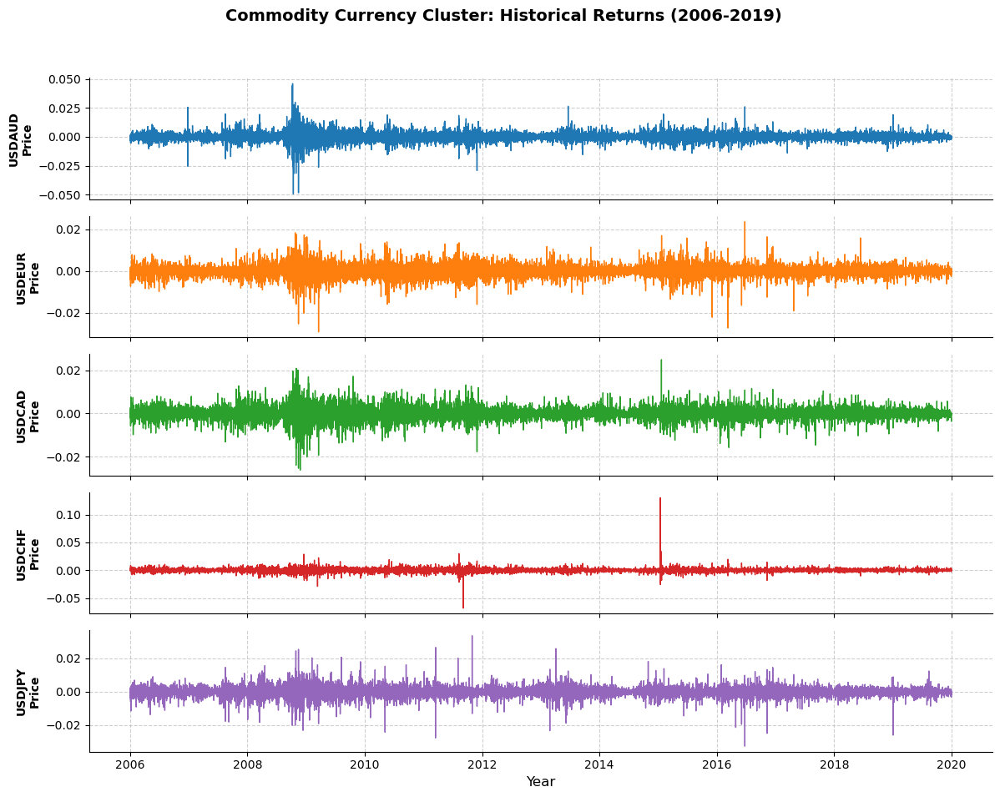

In [4]:
import matplotlib.dates as mdates
t_index = currency_cluster_7.index[1:]
r_S = np.diff(np.log(currency_cluster_7), axis =0)

# Adjust subplots to match the number of pairs exactly
fig, ax = plt.subplots(len(pairs), 1, figsize=(12, 10), sharex=True)

colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']
for i, pair in enumerate(pairs):
    ax[i].plot(t_index, r_S[:, i], 
               color=colors[i], linewidth=1, label=pair)
    
    # Styling
    ax[i].set_ylabel(f"{pair}\nPrice", fontsize=10, fontweight='bold')
    ax[i].grid(True, linestyle='--', alpha=0.6)
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['right'].set_visible(False)
    
    # Set Date Formatting (Every 2 years for a 2006-2019 span)
    ax[i].xaxis.set_major_locator(mdates.YearLocator(2))
    ax[i].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

plt.xlabel("Year", fontsize=12)
plt.suptitle("Commodity Currency Cluster: Historical Returns (2006-2019)", 
             fontsize=14, fontweight='bold', y=0.98)

plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust for suptitle
plt.show()

### Test UnifOrtho Sliced-Wasseserstein Algorithm 

In [9]:
importlib.reload(ws)

S = currency_cluster_7
print(S.shape)
N_S= 40 # number of simulation 
K = 2 # find two clusters 
L = 16
h1 = 10
h2 = 7
epsilon = 1e-6
projected_emp_dist, centroids, labels = ws.max_mccd_unifortho_sim(N_S, S, K, L, epsilon, h1, h2, metric = "CVaR")

(35783, 5)
Simulation 1/40 completed. Evaluating accuracy...
Simulation 2/40 completed. Evaluating accuracy...
Simulation 3/40 completed. Evaluating accuracy...
Simulation 4/40 completed. Evaluating accuracy...
Simulation 5/40 completed. Evaluating accuracy...
Simulation 6/40 completed. Evaluating accuracy...
Simulation 7/40 completed. Evaluating accuracy...
Simulation 8/40 completed. Evaluating accuracy...
Simulation 9/40 completed. Evaluating accuracy...
Simulation 10/40 completed. Evaluating accuracy...
Simulation 11/40 completed. Evaluating accuracy...
Simulation 12/40 completed. Evaluating accuracy...
Simulation 13/40 completed. Evaluating accuracy...
Simulation 14/40 completed. Evaluating accuracy...
Simulation 15/40 completed. Evaluating accuracy...
Simulation 16/40 completed. Evaluating accuracy...
Simulation 17/40 completed. Evaluating accuracy...
Simulation 18/40 completed. Evaluating accuracy...
Simulation 19/40 completed. Evaluating accuracy...
Simulation 20/40 completed. E

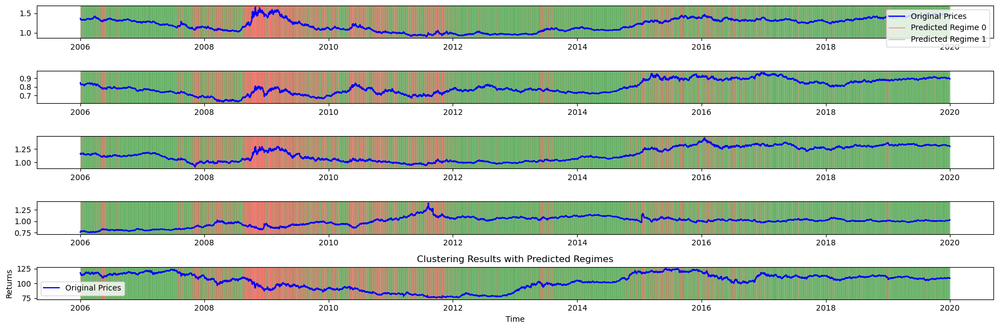

In [10]:
importlib.reload(mt)
t=S.index
mt.visualize_clustering_results(t,S, labels, h1, h2, K, returns = False)

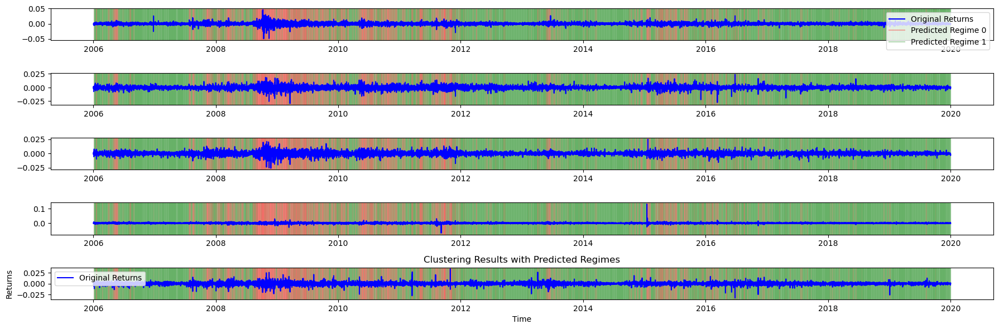

In [11]:
importlib.reload(mt)
t=S.index
mt.visualize_clustering_results(t,S, labels, h1, h2, K)

### Long Only Strategy on the 5 currencies using Regime detection

#### High Granularity Data for Backtesting Regime Detection base Trading Strat (15 min data)

In [12]:
pairs = ['AUDUSD', 'EURUSD', 'USDCAD', 'USDCHF', 'USDJPY']
# Dictionary to hold dataframes
dfs = {}

for pair in pairs:
    # Load your downloaded file (adjust 'path/to/' and column names as needed)
    # Most forex CSVs use columns: Date, Time, Open, High, Low, Close
    df = pd.read_csv(f'data/g4_currencies/{pair}-2000-2020-15m.csv')
    # Set Date_Time as index and keep only the 'Close' price
    df.set_index('DATE_TIME', inplace=True)
    dfs[pair] = df['CLOSE']

currency_cluster = pd.concat(dfs.values(), axis=1, keys=dfs.keys())
currency_cluster.index = pd.to_datetime(currency_cluster.index, format='%Y.%m.%d %H:%M:%S')

# 2. IMPORTANT: Sort the index (required for .loc slicing)
currency_cluster = currency_cluster.sort_index()
# 3. Filter using a simpler date format 
# (Pandas handles partial string indexing, so you don't need the 00:00:00)
currency_cluster = currency_cluster.loc['2006-01-01':'2019-12-31']

currency_cluster.ffill(inplace=True)

for col in ['AUDUSD', 'EURUSD', 'USDCHF']:
    currency_cluster[col] = currency_cluster[col].apply(lambda x: 1/x)
currency_cluster.rename(columns={'AUDUSD': 'USDAUD', 'EURUSD': 'USDEUR', 'USDCHF': 'USDCHF'}, inplace=True)
currency_cluster.drop(columns="USDCAD", inplace=True)
print(currency_cluster.shape)

(346000, 4)


Test Trading strategy with per week 480 data entry 


- with $h1 = 10$ and $h2 =2$ this gives $$M = \lfloor \frac{68-10-2}{2} \rfloor=234$$


In [13]:
importlib.reload(tr)
importlib.reload(ws)

# Resample by Week ('W') and count the number of valid (non-NaN) entries
h1 =10 
h2 =2  # M = 234 approximatively 
S = currency_cluster
window_size = 480 
L = 20
N_S = 20 #simulations 
majority_lookback = h2
print(S)
#metric 
portfolio_value_unif, trade_signals, cum_pnl = tr.long_strat_unifortho(initial_capital = 100, N_S=N_S, S=S, L=L, h1=h1, h2=h2, window_size=window_size, majority_lookback=majority_lookback)
print(portfolio_value_unif[-1])


                       USDAUD    USDEUR    USDCHF   USDJPY
DATE_TIME                                                 
2006-01-02 00:00:00  1.364443  0.844309  0.760861  117.910
2006-01-02 00:15:00  1.364443  0.844381  0.760861  117.930
2006-01-02 00:30:00  1.364443  0.844452  0.760919  117.910
2006-01-02 00:45:00  1.365374  0.844595  0.760572  117.920
2006-01-02 01:00:00  1.364815  0.844666  0.760919  117.920
...                       ...       ...       ...      ...
2019-12-31 19:45:00  1.423731  0.890567  1.034779  108.582
2019-12-31 20:00:00  1.423893  0.890892  1.034543  108.609
2019-12-31 20:15:00  1.424116  0.890932  1.034105  108.621
2019-12-31 20:30:00  1.424501  0.890869  1.034094  108.626
2019-12-31 20:45:00  1.425415  0.891027  1.034009  108.621

[346000 rows x 4 columns]
Analyzing Regime from 2006-01-02 00:00:00 to 2006-01-06 23:45:00 with 480 data points.
Simulation 1/20 completed. Evaluating accuracy...
Simulation 2/20 completed. Evaluating accuracy...
Simulation 3/20 com

In [14]:

importlib.reload(mt)
importlib.reload(ws)
importlib.reload(tr)

portfolio_value_long, cum_pnl_long, final_value_long = tr.long_only(S, initial_capital=100)
portfolio_value_short, cum_pnl_short, final_value_short = tr.short_only(S, initial_capital=100)


#### Trading Strategy Based on Implied Probability measure

It uses implied probability measure to compute wether it thinks it's going to be bear or bull. 


**Likelihood Function**
It uses SW-distance to every centroid to every centroid and then convert the likelihood via a softmax over the negative distances. 
We introduce a temperature parameter $\tau$ 
$$
\mathcal{L}(\text{regime } k \mid x_m) = \frac{e^{-d(x_m, c_k) / \tau}}{\sum_{j} e^{-d(x_m, c_j) / \tau}}
$$

**Empirical Transition Matrix**  Markov Prior :
A market in regime i is highly likely to stay in regime i tomorrow. We model this as a first-order Markov Chain using the historical labels. 
Probability of switching from i to j is: 
$$
\pi_{i,j} = P(Z_m = j \mid Z_{m-1} = i) = \frac{\text{Count}(i \to j)}{\sum_{x=1}^{K} \text{Count}(i \to x)}
$$
If the market was $z_{current}$ our prior belief that state M is going to be at regime $k$ is : 
$$
\mathbb{P}_{prior}(k) = \pi_{z_{current},k}
$$

Then we simply use Bayes rule to derive the following :
$$
\mathbb{P}_{Bayes}(k) = \frac{\mathbb{P}_{prior}(k) \cdot \mathcal{L}(k \mid X_m)}{\sum_{j=1}^{K} \mathbb{P}_{prior}(j) \cdot \mathcal{L}(j \mid X_m)}
$$

**Switch Probability** 
Finally the switch probability does the following : 
$$
\mathbb{P}_{switch} = 1- \mathbb{P}_{Bayes}(z_{current})
$$

**Use Gradient** 
One may also want to take into account the fact that one is moving away or getting closer to a certain regime. 

We consider a lookback window of size $\omega$, and one computes the linear trend slope of the Wasserstein distance to each centroid $k$. 
Let $t \in \{1,2, \dots, \omega \}$
We get using  OLS, $\beta_{k}$:

$$
\beta_k = \frac{\text{Covariance}(t, \, \mathcal{W}_2(X_{M-w+t}, \, C_k))}{\text{Variance}(t)}
$$

- if $\beta_{k} < 0$ the distance to regime k is shrinking (we are getting close to regime k)
- if $\beta_{k} > 0$ the distance to regime k is growing  (we are drifting away from regime k)

We apply softmax to get a probability: 
$$
P_{Grad}(k) = \frac{\exp\left(-\frac{\beta_k}{\tau}\right)}{\sum_{j=1}^{K} \exp\left(-\frac{\beta_j}{\tau}\right)}
$$

The final switch probability using gradient is therefore: 

$$
\mathbb{P}_{switch} = 1- \left[(1-\alpha)\mathbb{P}_{Bayes}(z_{current}) + \alpha \mathbb{P}_{Grad}(z_{current}) \right]
$$

with $\alpha \in [0:1]$ a weight. 







In [15]:
#%matplotlib tk

In [16]:
importlib.reload(tr)
importlib.reload(ws)

# Resample by Week ('W') and count the number of valid (non-NaN) entries
h1 =5 
h2 =1  # M = 234 approximatively 
S = currency_cluster
window_size = 480 
signal_type = "conviction"
L = 20
N_S = 10 #simulations 
_lookback = 10
grad_weight = 0.5
entry_threshold = 0.27
hold_threshold = 0.25
_use_gradient = False
_live_plot = False
#metric 
portfolio_value_unif_implied_conviction, trade_signals_implied_conviction, cum_pnl_implied_conviction, switch_proba_history_conviction = tr.long_strat_implied(initial_capital = 100, N_S=N_S, S=S, L=L, h1=h1, h2=h2, window_size=window_size, metric="CVaR", signal_type=signal_type, entry_threshold=entry_threshold, hold_threshold=hold_threshold, lookback=_lookback, use_gradient=_use_gradient, gradient_weight=grad_weight, live_plot=_live_plot)
print(f'Final portfolio value: {portfolio_value_unif_implied_conviction[-1]}')

Analyzing Regime from 2006-01-02 00:00:00 to 2006-01-06 23:45:00 with 480 data points.
Simulation 1/10 completed. Evaluating accuracy...
Simulation 2/10 completed. Evaluating accuracy...
Simulation 3/10 completed. Evaluating accuracy...
Simulation 4/10 completed. Evaluating accuracy...
Simulation 5/10 completed. Evaluating accuracy...
Simulation 6/10 completed. Evaluating accuracy...
Simulation 7/10 completed. Evaluating accuracy...
Simulation 8/10 completed. Evaluating accuracy...
Simulation 9/10 completed. Evaluating accuracy...
Simulation 10/10 completed. Evaluating accuracy...
------------------------------
Week 1
Switch Probability: 0.0050
Transition Matrix:
[[0.80357143 0.19642857]
 [0.02631579 0.97368421]]
Posterior Probabilities:
[0.00504653 0.99495347]
------------------------------
Final signal: 0.9924302025811652
------------------------------
Portfolio value after week 1: 99.712033658821
AND :Cumulative P&L: -0.28796634117900055
------------------------------
Analyzing Regi

In [17]:
importlib.reload(tr)
importlib.reload(ws)

# Resample by Week ('W') and count the number of valid (non-NaN) entries
h1 =5 
h2 =1  # M = 234 approximatively 
S = currency_cluster
window_size = 480 
signal_type = "continuous"
L = 20
N_S = 10 #simulations 
_lookback = 10
grad_weight = 0.5
entry_threshold = 0.27
hold_threshold = 0.25
_use_gradient = False
_live_plot = False
#metric 
portfolio_value_unif_implied_continuous, trade_signals_implied_continuous, cum_pnl_implied_continuous, switch_proba_history_continuous = tr.long_strat_implied(initial_capital = 100, N_S=N_S, S=S, L=L, h1=h1, h2=h2, window_size=window_size, metric="CVaR", signal_type=signal_type, entry_threshold=entry_threshold, hold_threshold=hold_threshold, lookback=_lookback, use_gradient=_use_gradient, gradient_weight=grad_weight, live_plot=_live_plot)
print(f'Final portfolio value: {portfolio_value_unif_implied_continuous[-1]}')

Analyzing Regime from 2006-01-02 00:00:00 to 2006-01-06 23:45:00 with 480 data points.
Simulation 1/10 completed. Evaluating accuracy...
Simulation 2/10 completed. Evaluating accuracy...
Simulation 3/10 completed. Evaluating accuracy...
Simulation 4/10 completed. Evaluating accuracy...
Simulation 5/10 completed. Evaluating accuracy...
Simulation 6/10 completed. Evaluating accuracy...
Simulation 7/10 completed. Evaluating accuracy...
Simulation 8/10 completed. Evaluating accuracy...
Simulation 9/10 completed. Evaluating accuracy...
Simulation 10/10 completed. Evaluating accuracy...
------------------------------
Week 1
Switch Probability: 0.0003
Transition Matrix:
[[0.8       0.2      ]
 [0.0021322 0.9978678]]
Posterior Probabilities:
[3.24658628e-04 9.99675341e-01]
------------------------------
Final signal: 0.999350682741891
------------------------------
Portfolio value after week 1: 99.7100158914822
AND :Cumulative P&L: -0.28998410851779965
------------------------------
Analyzing 

In [20]:
importlib.reload(tr)
importlib.reload(ws)

# Resample by Week ('W') and count the number of valid (non-NaN) entries
h1 =5 
h2 =1  # M = 234 approximatively 
S = currency_cluster
window_size = 480 
signal_type = "hysteresis"
L = 20
N_S = 10 #simulations 
_lookback = 10
grad_weight = 0.5
entry_threshold = 0.1
hold_threshold = 0.05
_use_gradient = False
_live_plot = False
#metric 
portfolio_value_unif_implied_hysteresis, trade_signals_implied_hysteresis, cum_pnl_implied_hysteresis, switch_proba_history_hysteresis = tr.long_strat_implied(initial_capital = 100, N_S=N_S, S=S, L=L, h1=h1, h2=h2, window_size=window_size, metric="CVaR", signal_type=signal_type, entry_threshold=entry_threshold, hold_threshold=hold_threshold, lookback=_lookback, use_gradient=_use_gradient, gradient_weight=grad_weight, live_plot=_live_plot)
print(f'Final portfolio value: {portfolio_value_unif_implied_hysteresis[-1]}')

Analyzing Regime from 2006-01-02 00:00:00 to 2006-01-06 23:45:00 with 480 data points.
Simulation 1/10 completed. Evaluating accuracy...
Simulation 2/10 completed. Evaluating accuracy...
Simulation 3/10 completed. Evaluating accuracy...
Simulation 4/10 completed. Evaluating accuracy...
Simulation 5/10 completed. Evaluating accuracy...
Simulation 6/10 completed. Evaluating accuracy...
Simulation 7/10 completed. Evaluating accuracy...
Simulation 8/10 completed. Evaluating accuracy...
Simulation 9/10 completed. Evaluating accuracy...
Simulation 10/10 completed. Evaluating accuracy...
------------------------------
Week 1
Switch Probability: 0.0044
Transition Matrix:
[[0.81132075 0.18867925]
 [0.02375297 0.97624703]]
Posterior Probabilities:
[0.00441806 0.99558194]
------------------------------
Final signal: 0
------------------------------
Portfolio value after week 1: 100.0
AND :Cumulative P&L: 0.0
------------------------------
Analyzing Regime from 2006-01-09 00:00:00 to 2006-01-13 23

In [61]:
data = currency_cluster

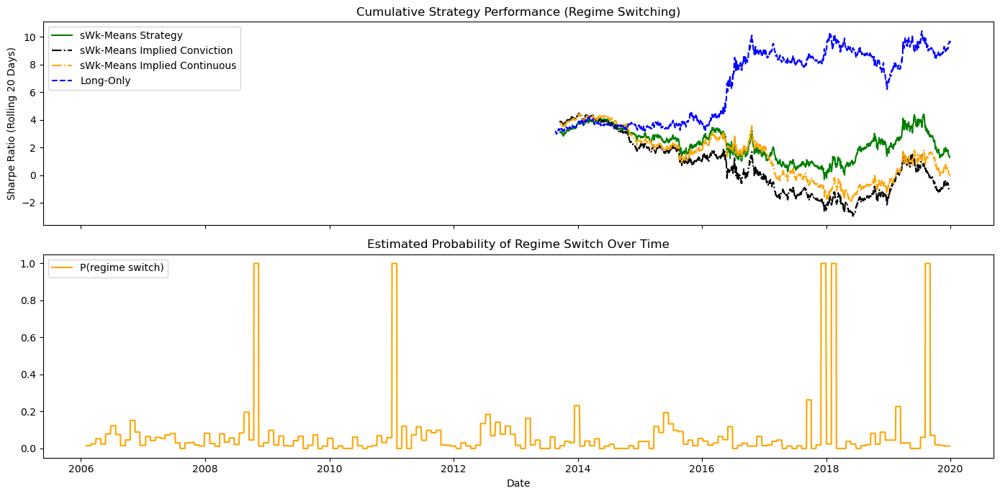

--------------------------------------------------
--- SWk-Means Strategy Performance ---
Final portfolio value: 178.2709 for the normal sWk-Means strategy.
Final cumulative P&L: 78.2709 for the normal sWk-Means strategy.
Final Sharpe ratio: 3.0981 for the normal sWk-Means strategy.
Annual return: 4.22% for the normal sWk-Means strategy.
////////////////////////////////////////////////////////////////////////////////////////////////////
--- SWk-Means Implied Strategy Conviction Performance ---
Final portfolio value: 137.5526 for the sWk-Means Implied strategy.
Final cumulative P&L: 37.5526 for the sWk-Means Implied strategy.
Final Sharpe ratio: 2.2094 for the sWk-Means Implied strategy.
Annual return: 2.30% for the sWk-Means Implied strategy.
////////////////////////////////////////////////////////////////////////////////////////////////////
--- SWk-Means Implied Strategy Continuous Performance ---
Final portfolio value: 159.3041 for the sWk-Means Implied strategy.
Final cumulative P&L

In [59]:
trade_start_idx = window_size  # trading begins after the first analysis window
trade_dates_unif = data.index[trade_start_idx : len(portfolio_value_unif) + trade_start_idx]
trade_dates_implied_conviction = data.index[trade_start_idx : len(portfolio_value_unif_implied_conviction) + trade_start_idx]
trade_dates_implied_continuous = data.index[trade_start_idx : len(portfolio_value_unif_implied_continuous) + trade_start_idx]
trade_dates_implied_hysteresis = data.index[trade_start_idx : len(portfolio_value_unif_implied_hysteresis) + trade_start_idx]
trade_dates_switch_conviction = data.index[trade_start_idx : trade_start_idx + len(switch_proba_history_conviction)]
trade_dates_switch_continuous = data.index[trade_start_idx : trade_start_idx + len(switch_proba_history_continuous)]
trade_dates_switch_hysteresis = data.index[trade_start_idx : trade_start_idx + len(switch_proba_history_hysteresis)]

vol_window = 4 * 24 * 7  # 1 week at 15-min granularity

# --- Helper: variance-adjust a portfolio value array ---
def vol_adjust(pv_array, dates):
    pv = pd.Series(pv_array, index=dates)
    returns = pv.pct_change()
    rolling_vol = returns.rolling(window=vol_window).std() * np.sqrt(4 * 24 * 252)  # annualise
    rolling_vol[rolling_vol < 1e-8] = 1e-8
    return pv / rolling_vol

def rolling_sharpe(pv_array, dates, days_lookback=20, rf=0, obs_per_year=1):
    # 1. Setup Series and Frequency
    pv = pd.Series(pv_array, index=dates)
    
    # Observations per day (4 per hour * 24 hours)
    obs_per_day = 4 * 24 
    window_size = days_lookback * obs_per_day
    
    # 2. Calculate Returns (15-minute intervals)
    returns = pv.pct_change()
    
    # 3. Calculate Rolling Mean and Std Dev
    # We annualize the mean return and the standard deviation
    ann_factor_mean = obs_per_day * 252
    ann_factor_std = np.sqrt(obs_per_day * 252)
    
    rolling_mean = returns.rolling(window=window_size).mean() * ann_factor_mean
    rolling_std = returns.rolling(window=window_size).std() * ann_factor_std
    
    # 4. Compute Sharpe Ratio
    # We use .clip to prevent division by zero or near-zero volatility
    sharpe = (rolling_mean - rf) / rolling_std.clip(lower=1e-8)
    
    return sharpe
# --- Variance-adjusted strategy curves ---
pv_unif_series = rolling_sharpe(portfolio_value_unif, trade_dates_unif)
pv_implied_series_conviction = rolling_sharpe(portfolio_value_unif_implied_conviction, trade_dates_implied_conviction)
pv_implied_series_continuous = rolling_sharpe(portfolio_value_unif_implied_continuous, trade_dates_implied_continuous)
pv_implied_series_hysteresis = rolling_sharpe(portfolio_value_unif_implied_hysteresis, trade_dates_implied_hysteresis)
pv_long_series = rolling_sharpe(portfolio_value_long.values, portfolio_value_long.index)
pv_short_series = rolling_sharpe(portfolio_value_short.values, portfolio_value_short.index)


# --- Switch proba series (unchanged) ---
sp_series_conviction = pd.Series(switch_proba_history_conviction, index=trade_dates_switch_conviction)
sp_series_continuous = pd.Series(switch_proba_history_continuous, index=trade_dates_switch_continuous)
sp_series_hysteresis = pd.Series(switch_proba_history_hysteresis, index=trade_dates_switch_hysteresis)
sp_series_conviction = pd.Series(switch_proba_history_conviction, index=trade_dates_switch_conviction)
sp_series_continuous = pd.Series(switch_proba_history_continuous, index=trade_dates_switch_continuous)
pv_implied_series_hysteresis = pd.Series(portfolio_value_unif_implied_hysteresis, index=trade_dates_implied_hysteresis)
sp_series_hysteresis = pd.Series(switch_proba_history_hysteresis, index=trade_dates_switch_hysteresis)

# --- Plot with correctly aligned datetime indices ---
fig, ax = plt.subplots(2, 1, figsize=(14, 7), sharex=True)


ax[0].plot(pv_unif_series.index, pv_unif_series.values, label='sWk-Means Strategy', color='green')
ax[0].plot(pv_implied_series_conviction.index, pv_implied_series_conviction.values, label='sWk-Means Implied Conviction', color='black', linestyle='-.')
ax[0].plot(pv_implied_series_continuous.index, pv_implied_series_continuous.values, label='sWk-Means Implied Continuous', color='orange', linestyle='-.')
#ax[0].plot(pv_implied_series_hysteresis.index, pv_implied_series_hysteresis.values, label='sWk-Means Implied Hysteresis', color='purple', linestyle='-.')
ax[0].plot(pv_long_series.index, pv_long_series.values, label='Long-Only', color='blue', linestyle='--')
#ax[0].plot(pv_short_series.index, pv_short_series.values, label='Short-Only', color='red', linestyle='--')
ax[0].set_title("Cumulative Strategy Performance (Regime Switching)")
ax[0].set_ylabel("Sharpe Ratio (Rolling 20 Days)", fontsize=10)
#ax[0].set_yscale('log')
ax[0].legend(loc='upper left')

ax[1].plot(sp_series_continuous.index, sp_series_continuous.values, label='P(regime switch)', color='orange')
ax[1].set_title("Estimated Probability of Regime Switch Over Time")
ax[1].set_xlabel("Date")
ax[1].legend()

plt.tight_layout()
plt.show()

# --- SWk-Means Strategy ---
daily_returns = np.diff(portfolio_value_unif) / portfolio_value_unif[:-1]
sharpe_ratio = np.mean(daily_returns) / np.std(daily_returns) * np.sqrt(4*24*252)
n_years = 14  # 2006 to 2020
annual_return = (portfolio_value_unif[-1] / portfolio_value_unif[0]) ** (1 / n_years) - 1

# --- SWk-Means Implied Strategy ---
daily_returns_implied_conviction = np.diff(portfolio_value_unif_implied_conviction) / portfolio_value_unif_implied_conviction[:-1]
sharpe_ratio_implied_conviction = np.mean(daily_returns_implied_conviction) / np.std(daily_returns_implied_conviction) * np.sqrt(4*24*252)
annual_return_implied_conviction = (portfolio_value_unif_implied_conviction[-1] / portfolio_value_unif_implied_conviction[0]) ** (1 / n_years) - 1

daily_returns_implied_continuous = np.diff(portfolio_value_unif_implied_continuous) / portfolio_value_unif_implied_continuous[:-1]
sharpe_ratio_implied_continuous = np.mean(daily_returns_implied_continuous) / np.std(daily_returns_implied_continuous) * np.sqrt(4*24*252)
annual_return_implied_continuous = (portfolio_value_unif_implied_continuous[-1] / portfolio_value_unif_implied_continuous[0]) ** (1 / n_years) - 1

daily_returns_implied_hysteresis = np.diff(portfolio_value_unif_implied_hysteresis) / portfolio_value_unif_implied_hysteresis[:-1]
sharpe_ratio_implied_hysteresis = np.mean(daily_returns_implied_hysteresis) / np.std(daily_returns_implied_hysteresis) * np.sqrt(4*24*252)
annual_return_implied_hysteresis = (portfolio_value_unif_implied_hysteresis[-1] / portfolio_value_unif_implied_hysteresis[0]) ** (1 / n_years) - 1

# --- Long Only ---
daily_returns_long = cum_pnl_long.pct_change().dropna()
sharpe_ratio_long = daily_returns_long.mean() / daily_returns_long.std() * np.sqrt(4*24*252)
annual_return_long = (cum_pnl_long.iloc[-1] / cum_pnl_long.iloc[0]) ** (1 / n_years) - 1

# --- Short Only ---
daily_returns_short = cum_pnl_short.pct_change().dropna()
sharpe_ratio_short = daily_returns_short.mean() / daily_returns_short.std() * np.sqrt(4*24*252)
annual_return_short = (cum_pnl_short.iloc[-1] / cum_pnl_short.iloc[0]) ** (1 / n_years) - 1

# --- Print Results ---
print('-' * 50)
print("--- SWk-Means Strategy Performance ---")
print(f'Final portfolio value: {portfolio_value_unif[-1]:.4f} for the normal sWk-Means strategy.')
print(f"Final cumulative P&L: {cum_pnl[-1]:.4f} for the normal sWk-Means strategy.")
print(f'Final Sharpe ratio: {sharpe_ratio:.4f} for the normal sWk-Means strategy.')
print(f"Annual return: {annual_return * 100:.2f}% for the normal sWk-Means strategy.")
print("//" * 50)
print("--- SWk-Means Implied Strategy Conviction Performance ---")
print(f'Final portfolio value: {portfolio_value_unif_implied_conviction[-1]:.4f} for the sWk-Means Implied strategy.')
print(f"Final cumulative P&L: {cum_pnl_implied_conviction[-1]:.4f} for the sWk-Means Implied strategy.")
print(f'Final Sharpe ratio: {sharpe_ratio_implied_conviction:.4f} for the sWk-Means Implied strategy.')
print(f"Annual return: {annual_return_implied_conviction * 100:.2f}% for the sWk-Means Implied strategy.")
print("//" * 50)

print("--- SWk-Means Implied Strategy Continuous Performance ---")
print(f'Final portfolio value: {portfolio_value_unif_implied_continuous[-1]:.4f} for the sWk-Means Implied strategy.')
print(f"Final cumulative P&L: {cum_pnl_implied_continuous[-1]:.4f} for the sWk-Means Implied strategy.")
print(f'Final Sharpe ratio: {sharpe_ratio_implied_continuous:.4f} for the sWk-Means Implied strategy.')
print(f"Annual return: {annual_return_implied_continuous * 100:.2f}% for the sWk-Means Implied strategy.")
print("//" * 50)

print("--- SWk-Means Implied Strategy Hysteresis Performance ---")
print(f'Final portfolio value: {portfolio_value_unif_implied_hysteresis[-1]:.4f} for the sWk-Means Implied strategy.')
print(f"Final cumulative P&L: {cum_pnl_implied_hysteresis[-1]:.4f} for the sWk-Means Implied strategy.")
print(f'Final Sharpe ratio: {sharpe_ratio_implied_hysteresis:.4f} for the sWk-Means Implied strategy.')
print(f"Annual return: {annual_return_implied_hysteresis * 100:.2f}% for the sWk-Means Implied strategy.")
print("//" * 50)

print("--- Long ONLY Performance ---")
print(f'Final P&L for long-only strategy: {(cum_pnl_long.iloc[-1] - 1) * 100:.2f}%')
print(f"Final cumulative Portfolio Value: {final_value_long:.4f} for the long-only strategy.")
print(f'Final Sharpe ratio: {sharpe_ratio_long:.4f} for the long-only strategy.')
print(f"Annual return: {annual_return_long * 100:.2f}% for the long-only strategy.")
print("//" * 50)
print("--- Short ONLY Performance ---")
print(f'Final P&L for short-only strategy: {(cum_pnl_short.iloc[-1] - 1) * 100:.2f}%')
print(f"Final cumulative Portfolio Value: {final_value_short:.4f} for the short-only strategy.")
print(f'Final Sharpe ratio: {sharpe_ratio_short:.4f} for the short-only strategy.')
print(f"Annual return: {annual_return_short * 100:.2f}% for the short-only strategy.")
print('-' * 50)


### (1) WTI Crude Oil, Brent Crude, Natural Gas, Heating Oil

### (2) Copper, Aluminum, Zinc, Nickel, Lead. (5D) (interesting to see on very recent data)

## (2.3) Equities Market (3D)

In [3]:
start_date = '2006-01-01'
end_date = '2020-01-01'
interval = '1d'

start_date_ref = '1990-01-01'
end_date_ref = '2020-01-01'

n_years = 30

### (2.3.1) America : NASDDAQ, Dow Jones , S&P500 

In [8]:
# Bloomberg data
df_america = pd.read_csv('data/df_america.csv', index_col=0, parse_dates=True)
df_america.dropna(inplace=True)

df_america = df_america.loc[start_date_ref:end_date_ref]

#Yahoo finance
#df_america = equity_loader.get_close_prices(start_date=start_date, end_date=end_date, regions=['america'], interval=interval)
#df_america.dropna(inplace=True)


#### PARAMETERS (AMERICA)

In [9]:
#data loading
S = df_america

# Parameters for sliced Wasserstein K-Means
h2 = 1
h1 = 3
N_S = 40
L = 20
epsilon = 1e-6

#initial capital for backtesting
initial_capital = 100

#lookback over a month of trading days
_window_size = 20 #window over which we compute regimes
_majority_lookback = 20 #for computing the exponetial weighting
_half_life = 5 #half life for exponential weighting of the regimes


_use_gradient = False 
_grad_weight = 0.7
_tau_gradient = None # 0.01
_tau = None #0.01
_lookback = 20 #for computing the gradient lookback



_entry_threshold = 0.35
_hold_threshold = 0.21

#### (A) Preliminary Regime Detection for American Index 

In [10]:
proj_emp, centroids, labels = ws.max_mccd_unifortho_sim(N_S, S, K=2, L=L, epsilon=epsilon, h1=h1, h2=h2, metric="CVaR")

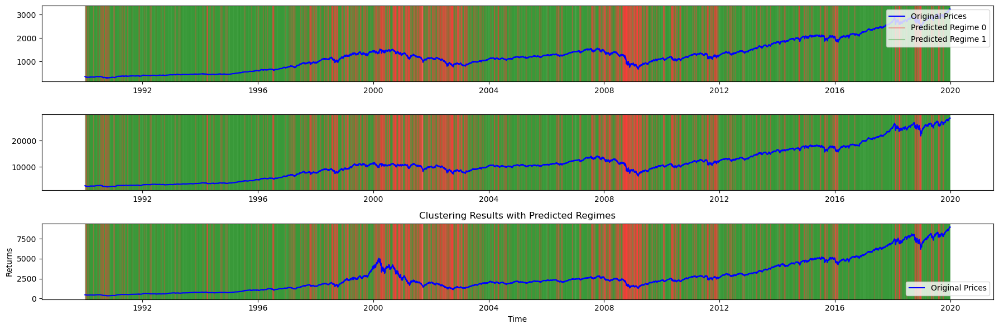

In [12]:
mt.visualize_clustering_results(df_america.index, df_america, labels, h1, h2, K=2, returns=False)

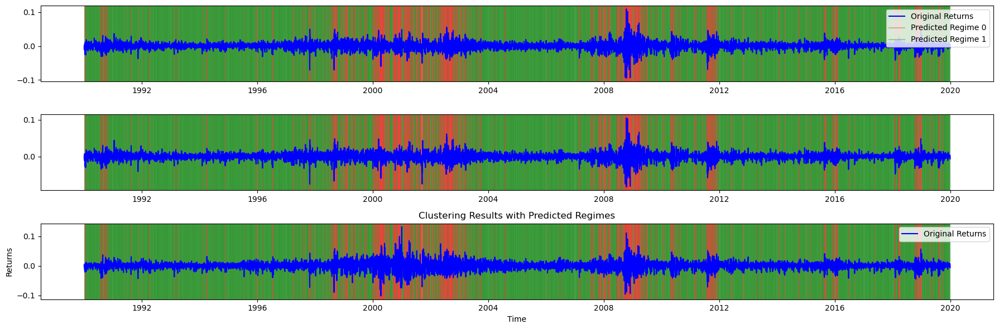

In [11]:
mt.visualize_clustering_results(df_america.index, df_america, labels, h1, h2, K=2)

#### (B) Trading Strategies on America Equity Indices(Lagged Signal)

In [13]:
# LONG-SHORT SWKMEANS
print("-----------------------LONG-SHORT SWKMEANS -------------------------")
portfolio_value_unif, trade_signals, cum_pnl = tr.long_strat_unifortho(
    initial_capital=initial_capital, N_S=N_S, S=S, L=L, h1=h1, h2=h2,
    window_size=_window_size, majority_lookback=_majority_lookback, half_life=_half_life)
mt.report_metrics("LongShort UnifOrtho", portfolio_value = portfolio_value_unif, trade_signals = trade_signals, window_size=_window_size, cum_pnl=cum_pnl, n_years=n_years)

# IMPLIED PROBABILITY (CONVICTION)
print("---------- IMPLIED PROBABILITY TRADING STRATEGY (CONVICTION) ---------")
_signal_type = "conviction"
portfolio_value_unif_implied_conviction, trade_signals_implied_conviction, cum_pnl_implied_conviction, switch_proba_history_conviction = tr.long_strat_implied(
    initial_capital, N_S, S, L, h1, h2, _window_size, signal_type=_signal_type,
    majority_lookback=_majority_lookback, half_life=_half_life, entry_threshold=_entry_threshold,
    hold_threshold=_hold_threshold, lookback=_lookback, gradient_weight=_grad_weight,
    use_gradient=_use_gradient, tau=_tau, tau_gradient=_tau_gradient)
mt.report_metrics("Implied Conviction", portfolio_value=portfolio_value_unif_implied_conviction, trade_signals=trade_signals_implied_conviction, window_size=_window_size, cum_pnl=cum_pnl_implied_conviction, n_years=n_years)

# IMPLIED PROBABILITY (HYSTERESIS)
print("---------- IMPLIED PROBABILITY TRADING STRATEGY (HYSTERESIS) --------")
_signal_type = "hysteresis"
portfolio_value_unif_implied_hysteresis, trade_signals_implied_hysteresis, cum_pnl_implied_hysteresis, switch_proba_history_hysteresis = tr.long_strat_implied(
    initial_capital, N_S, S, L, h1, h2, _window_size, signal_type=_signal_type,
    majority_lookback=_majority_lookback, half_life=_half_life, entry_threshold=_entry_threshold,
    hold_threshold=_hold_threshold, lookback=_lookback, gradient_weight=_grad_weight,
    use_gradient=_use_gradient, tau=_tau, tau_gradient=_tau_gradient)
mt.report_metrics("Implied Hysteresis", portfolio_value=portfolio_value_unif_implied_hysteresis, trade_signals=trade_signals_implied_hysteresis, window_size=_window_size, cum_pnl=cum_pnl_implied_hysteresis, n_years=n_years)

# IMPLIED PROBABILITY (CONTINUOUS)
print("---------- IMPLIED PROBABILITY TRADING STRATEGY (CONTINUOUS) --------")
_signal_type = "continuous"
portfolio_value_unif_implied_continuous, trade_signals_implied_continuous, cum_pnl_implied_continuous, switch_proba_history_continuous = tr.long_strat_implied(
    initial_capital, N_S, S, L, h1, h2, _window_size, signal_type=_signal_type,
    majority_lookback=_majority_lookback, half_life=_half_life, entry_threshold=_entry_threshold,
    hold_threshold=_hold_threshold, lookback=_lookback, gradient_weight=_grad_weight,
    use_gradient=_use_gradient, tau=_tau, tau_gradient=_tau_gradient)
mt.report_metrics("Implied Continuous", portfolio_value=portfolio_value_unif_implied_continuous, trade_signals=trade_signals_implied_continuous, window_size=_window_size, cum_pnl=cum_pnl_implied_continuous, n_years=n_years)

# ENSEMBLE (TUNED WEIGHTS)
print("---------- ENSEMBLE STRATEGY (TUNED WEIGHTS) --------")
_ensemble_weights = [0.1, 0.4, 0.1, 0.4]
portfolio_value_ensemble, trade_signals_ensemble, cum_pnl_ensemble, signal_details_ensemble = tr.ensemble_strategy(
    initial_capital, N_S, S, L, h1, h2, _window_size, majority_lookback=_majority_lookback,
    ensemble_weights=_ensemble_weights, lookback=_lookback, use_gradient=_use_gradient,
    gradient_weight=_grad_weight, entry_threshold=_entry_threshold, hold_threshold=_hold_threshold,
    tau=_tau, tau_gradient=_tau_gradient, half_life=_half_life)
mt.report_metrics("Ensemble (tuned)", portfolio_value=portfolio_value_ensemble, trade_signals=trade_signals_ensemble, window_size=_window_size, cum_pnl=cum_pnl_ensemble, n_years=n_years)

# ENSEMBLE (EQUAL WEIGHTS)
print("---------- ENSEMBLE STRATEGY (EQUAL WEIGHTS) --------")
_ensemble_weights = [0.25, 0.25, 0.25, 0.25]
portfolio_value_eq_wg, trade_signals_ensemble_eq_wg, cum_pnl_ensemble_eq_wg, signal_details_ensemble_eq_wg = tr.ensemble_strategy(
    initial_capital, N_S, S, L, h1, h2, _window_size, majority_lookback=_majority_lookback,
    ensemble_weights=_ensemble_weights, lookback=_lookback, use_gradient=_use_gradient,
    gradient_weight=_grad_weight, entry_threshold=_entry_threshold, hold_threshold=_hold_threshold,
    tau=_tau, tau_gradient=_tau_gradient, half_life=_half_life)
mt.report_metrics("Ensemble (equal)", portfolio_value = portfolio_value_eq_wg, trade_signals = trade_signals_ensemble_eq_wg, window_size=_window_size, cum_pnl=cum_pnl_ensemble_eq_wg, n_years=n_years)

# LONG / SHORT ONLY
print("---------- LONG AND SHORT ONLY --------")
portfolio_value_long,  cum_pnl_long,  final_value_long  = tr.long_only(df_america, initial_capital=initial_capital, weighting="inverse_vol", window_size=_window_size)
portfolio_value_short, cum_pnl_short, final_value_short = tr.short_only(df_america, initial_capital=initial_capital, weighting="inverse_vol", window_size=_window_size)
mt.report_metrics("Long only",  portfolio_value= portfolio_value_long,  window_size=_window_size, cum_pnl=cum_pnl_long, n_years=n_years)
mt.report_metrics("Short only", portfolio_value= portfolio_value_short, window_size=_window_size, cum_pnl=cum_pnl_short, n_years=n_years)

-----------------------LONG-SHORT SWKMEANS -------------------------
------[LongShort UnifOrtho]------
hit ratio: 0.5212 | win/loss: 0.4815 | final value: 85.57
Cummulative pnl: -14.4314 | Annualized Sharpe Ratio: 0.0581 | Annual return: -0.0052
---------- IMPLIED PROBABILITY TRADING STRATEGY (CONVICTION) ---------
------[Implied Conviction]------
hit ratio: 0.5199 | win/loss: 0.4847 | final value: 108.25
Cummulative pnl: 8.2456 | Annualized Sharpe Ratio: 0.0978 | Annual return: 0.0026
---------- IMPLIED PROBABILITY TRADING STRATEGY (HYSTERESIS) --------
------[Implied Hysteresis]------
hit ratio: 0.5178 | win/loss: 0.4806 | final value: 62.09
Cummulative pnl: -37.9140 | Annualized Sharpe Ratio: -0.0267 | Annual return: -0.0158
---------- IMPLIED PROBABILITY TRADING STRATEGY (CONTINUOUS) --------
------[Implied Continuous]------
hit ratio: 0.5155 | win/loss: 0.4955 | final value: 207.54
Cummulative pnl: 107.5396 | Annualized Sharpe Ratio: 0.2330 | Annual return: 0.0246
---------- ENSEM

/Users/oscarpeyron/Downloads/003_ETUDE_POST_BAC/MASTER_UCL_COMP_FINANCE/T3/ADIA/src/metrics.py:472:FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/Users/oscarpeyron/Downloads/003_ETUDE_POST_BAC/MASTER_UCL_COMP_FINANCE/T3/ADIA/src/metrics.py:488:FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/Users/oscarpeyron/Downloads/003_ETUDE_POST_BAC/MASTER_UCL_COMP_FINANCE/T3/ADIA/src/metrics.py:489:FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


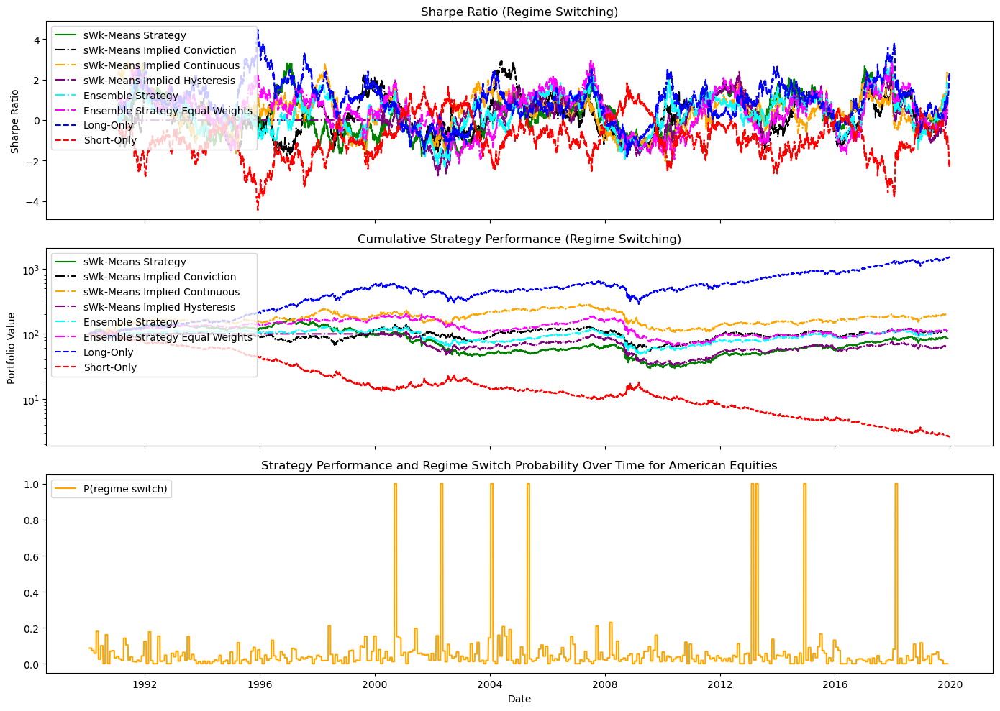

--------------------------------------------------
--- SWk-Means Strategy Performance ---
Final portfolio value: 85.5686 for the normal sWk-Means strategy.
Final cumulative P&L: -14.4314 for the normal sWk-Means strategy.
Final Sharpe ratio: 0.0581 for the normal sWk-Means strategy.
Annual return: -1.11% for the normal sWk-Means strategy.
////////////////////////////////////////////////////////////////////////////////////////////////////
--- SWk-Means Implied Strategy Conviction Performance ---
Final portfolio value: 108.2456 for the sWk-Means Implied strategy.
Final cumulative P&L: 8.2456 for the sWk-Means Implied strategy.
Final Sharpe ratio: 0.3659 for the sWk-Means Implied strategy.
Annual return: 0.57% for the sWk-Means Implied strategy.
////////////////////////////////////////////////////////////////////////////////////////////////////
--- SWk-Means Implied Strategy Continuous Performance ---
Final portfolio value: 207.5396 for the sWk-Means Implied strategy.
Final cumulative P&L

/var/folders/91/v98ksgyn3zb26xq2gsrl4jzr0000gn/T/ipykernel_38520/3821459907.py:101:RuntimeWarning: invalid value encountered in scalar power


In [14]:
# PLOTTING

data = S
window_size= _window_size


trade_start_idx = window_size  # trading begins after the first analysis window
trade_dates_unif = data.index[trade_start_idx : len(portfolio_value_unif) + trade_start_idx]
trade_dates_implied_conviction = data.index[trade_start_idx : len(portfolio_value_unif_implied_conviction) + trade_start_idx]
trade_dates_implied_continuous = data.index[trade_start_idx : len(portfolio_value_unif_implied_continuous) + trade_start_idx]
trade_dates_implied_hysteresis = data.index[trade_start_idx : len(portfolio_value_unif_implied_hysteresis) + trade_start_idx]
trade_dates_switch_conviction = data.index[trade_start_idx : trade_start_idx + len(switch_proba_history_conviction)]
trade_dates_switch_continuous = data.index[trade_start_idx : trade_start_idx + len(switch_proba_history_continuous)]
trade_dates_switch_hysteresis = data.index[trade_start_idx : trade_start_idx + len(switch_proba_history_hysteresis)]
trade_dates_ensemble = data.index[trade_start_idx : trade_start_idx + len(portfolio_value_ensemble)]
trade_dates_ensemble_eq_wg = data.index[trade_start_idx : trade_start_idx + len(portfolio_value_eq_wg)]


pv_unif_series = pd.Series(portfolio_value_unif, index=trade_dates_unif)
pv_implied_series_conviction = pd.Series(portfolio_value_unif_implied_conviction, index=trade_dates_implied_conviction)
pv_implied_series_continuous = pd.Series(portfolio_value_unif_implied_continuous, index=trade_dates_implied_continuous)
pv_ensemble_series = pd.Series(portfolio_value_ensemble, index=trade_dates_ensemble)
pv_ensemble_eq_wg_series = pd.Series(portfolio_value_eq_wg, index=trade_dates_ensemble)
pv_implied_series_hysteresis = pd.Series(portfolio_value_unif_implied_hysteresis, index=trade_dates_implied_hysteresis)
sp_series_conviction = pd.Series(switch_proba_history_conviction, index=trade_dates_switch_conviction)
sp_series_continuous = pd.Series(switch_proba_history_continuous, index=trade_dates_switch_continuous)
sp_series_hysteresis = pd.Series(switch_proba_history_hysteresis, index=trade_dates_switch_hysteresis)

# --- Plot with correctly aligned datetime indices ---
fig, ax = plt.subplots(3, 1, figsize=(14, 10), sharex=True)


ax[0].plot(pv_unif_series.index, tr.rolling_sharpe(pv_unif_series.values, dates=pv_unif_series.index, days_lookback=252), label='sWk-Means Strategy', color='green')
ax[0].plot(pv_implied_series_conviction.index, tr.rolling_sharpe(pv_implied_series_conviction.values, dates=pv_implied_series_conviction.index, days_lookback=252), label='sWk-Means Implied Conviction', color='black', linestyle='-.')
ax[0].plot(pv_implied_series_continuous.index, tr.rolling_sharpe(pv_implied_series_continuous.values, dates=pv_implied_series_continuous.index, days_lookback=252), label='sWk-Means Implied Continuous', color='orange', linestyle='-.')
ax[0].plot(pv_implied_series_hysteresis.index, tr.rolling_sharpe(pv_implied_series_hysteresis.values, dates=pv_implied_series_hysteresis.index, days_lookback=252), label='sWk-Means Implied Hysteresis', color='purple', linestyle='-.')
ax[0].plot(pv_ensemble_series.index, tr.rolling_sharpe(pv_ensemble_series.values, dates=pv_ensemble_series.index, days_lookback=252), label='Ensemble Strategy', color='cyan', linestyle='-.')
ax[0].plot(pv_ensemble_eq_wg_series.index, tr.rolling_sharpe(pv_ensemble_eq_wg_series.values, dates=pv_ensemble_eq_wg_series.index, days_lookback=252), label='Ensemble Strategy Equal Weights', color='magenta', linestyle='-.')
ax[0].plot(portfolio_value_long.index, tr.rolling_sharpe(portfolio_value_long.values, dates=portfolio_value_long.index, days_lookback=252), label='Long-Only', color='blue', linestyle='--')
ax[0].plot(portfolio_value_short.index, tr.rolling_sharpe(portfolio_value_short.values, dates=portfolio_value_short.index, days_lookback=252), label='Short-Only', color='red', linestyle='--')
ax[0].set_title("Sharpe Ratio (Regime Switching)")
ax[0].set_ylabel("Sharpe Ratio", fontsize=10)
ax[0].legend(loc='upper left')

ax[1].plot(pv_unif_series.index, pv_unif_series.values, label='sWk-Means Strategy', color='green')
ax[1].plot(pv_implied_series_conviction.index, pv_implied_series_conviction.values, label='sWk-Means Implied Conviction', color='black', linestyle='-.')
ax[1].plot(pv_implied_series_continuous.index, pv_implied_series_continuous.values, label='sWk-Means Implied Continuous', color='orange', linestyle='-.')
ax[1].plot(pv_implied_series_hysteresis.index, pv_implied_series_hysteresis.values, label='sWk-Means Implied Hysteresis', color='purple', linestyle='-.')
ax[1].plot(pv_ensemble_series.index, pv_ensemble_series.values, label='Ensemble Strategy', color='cyan', linestyle='-.')
ax[1].plot(pv_ensemble_eq_wg_series.index, pv_ensemble_eq_wg_series.values, label='Ensemble Strategy Equal Weights', color='magenta', linestyle='-.')
ax[1].plot(portfolio_value_long.index, portfolio_value_long.values, label='Long-Only', color='blue', linestyle='--')
ax[1].plot(portfolio_value_short.index, portfolio_value_short.values, label='Short-Only', color='red', linestyle='--')
ax[1].set_yscale('log')
ax[1].set_title("Cumulative Strategy Performance (Regime Switching)")
ax[1].set_ylabel("Portfolio Value")
ax[1].legend(loc='upper left')

ax[2].plot(sp_series_continuous.index, sp_series_continuous.values, label='P(regime switch)', color='orange')
ax[2].set_title("Estimated Probability of Regime Switch Over Time")
ax[2].set_xlabel("Date")
ax[2].legend()

plt.title("Strategy Performance and Regime Switch Probability Over Time for American Equities")
plt.tight_layout()
plt.show()





# --- SWk-Means Strategy ---
daily_returns = np.diff(portfolio_value_unif) / portfolio_value_unif[:-1]
sharpe_ratio = np.mean(daily_returns) / np.std(daily_returns) * np.sqrt(252)
n_years = 14  # 2006 to 2020
annual_return = (portfolio_value_unif[-1] / portfolio_value_unif[0]) ** (1 / n_years) - 1

# --- SWk-Means Implied Strategy ---
daily_returns_implied_conviction = np.diff(portfolio_value_unif_implied_conviction) / portfolio_value_unif_implied_conviction[:-1]
sharpe_ratio_implied_conviction = np.mean(daily_returns_implied_conviction) / np.std(daily_returns_implied_conviction) * np.sqrt(14*252)
annual_return_implied_conviction = (portfolio_value_unif_implied_conviction[-1] / portfolio_value_unif_implied_conviction[0]) ** (1 / n_years) - 1

daily_returns_implied_continuous = np.diff(portfolio_value_unif_implied_continuous) / portfolio_value_unif_implied_continuous[:-1]
sharpe_ratio_implied_continuous = np.mean(daily_returns_implied_continuous) / np.std(daily_returns_implied_continuous) * np.sqrt(14*252)
annual_return_implied_continuous = (portfolio_value_unif_implied_continuous[-1] / portfolio_value_unif_implied_continuous[0]) ** (1 / n_years) - 1

daily_returns_implied_hysteresis = np.diff(portfolio_value_unif_implied_hysteresis) / portfolio_value_unif_implied_hysteresis[:-1]
sharpe_ratio_implied_hysteresis = np.mean(daily_returns_implied_hysteresis) / np.std(daily_returns_implied_hysteresis) * np.sqrt(14*252)
annual_return_implied_hysteresis = (portfolio_value_unif_implied_hysteresis[-1] / portfolio_value_unif_implied_hysteresis[0]) ** (1 / n_years) - 1

daily_returns_ensemble = np.diff(portfolio_value_ensemble) / portfolio_value_ensemble[:-1]
sharpe_ratio_ensemble = np.mean(daily_returns_ensemble) / np.std(daily_returns_ensemble) * np.sqrt(14*252)
annual_return_ensemble = (portfolio_value_ensemble[-1] / portfolio_value_ensemble[0]) ** (1 / n_years) - 1

daily_returns_ensemble_eq_wg = np.diff(portfolio_value_eq_wg) / portfolio_value_eq_wg[:-1]
sharpe_ratio_ensemble_eq_wg = np.mean(daily_returns_ensemble_eq_wg) / np.std(daily_returns_ensemble_eq_wg) * np.sqrt(14*252)
annual_return_ensemble_eq_wg = (portfolio_value_eq_wg[-1] / portfolio_value_eq_wg[0]) ** (1 / n_years) - 1

# --- Long Only ---
daily_returns_long = cum_pnl_long.pct_change().dropna()
sharpe_ratio_long = daily_returns_long.mean() / daily_returns_long.std() * np.sqrt(14*252)
annual_return_long = (cum_pnl_long.iloc[-1] / cum_pnl_long.iloc[0]) ** (1 / n_years) - 1

# --- Short Only ---
daily_returns_short = cum_pnl_short.pct_change().dropna()
sharpe_ratio_short = daily_returns_short.mean() / daily_returns_short.std() * np.sqrt(14*252)
annual_return_short = (cum_pnl_short.iloc[-1] / cum_pnl_short.iloc[0]) ** (1 / n_years) - 1

# --- Print Results ---
print('-' * 50)
print("--- SWk-Means Strategy Performance ---")
print(f'Final portfolio value: {portfolio_value_unif[-1]:.4f} for the normal sWk-Means strategy.')
print(f"Final cumulative P&L: {cum_pnl[-1]:.4f} for the normal sWk-Means strategy.")
print(f'Final Sharpe ratio: {sharpe_ratio:.4f} for the normal sWk-Means strategy.')
print(f"Annual return: {annual_return * 100:.2f}% for the normal sWk-Means strategy.")
print("//" * 50)
print("--- SWk-Means Implied Strategy Conviction Performance ---")
print(f'Final portfolio value: {portfolio_value_unif_implied_conviction[-1]:.4f} for the sWk-Means Implied strategy.')
print(f"Final cumulative P&L: {cum_pnl_implied_conviction[-1]:.4f} for the sWk-Means Implied strategy.")
print(f'Final Sharpe ratio: {sharpe_ratio_implied_conviction:.4f} for the sWk-Means Implied strategy.')
print(f"Annual return: {annual_return_implied_conviction * 100:.2f}% for the sWk-Means Implied strategy.")
print("//" * 50)

print("--- SWk-Means Implied Strategy Continuous Performance ---")
print(f'Final portfolio value: {portfolio_value_unif_implied_continuous[-1]:.4f} for the sWk-Means Implied strategy.')
print(f"Final cumulative P&L: {cum_pnl_implied_continuous[-1]:.4f} for the sWk-Means Implied strategy.")
print(f'Final Sharpe ratio: {sharpe_ratio_implied_continuous:.4f} for the sWk-Means Implied strategy.')
print(f"Annual return: {annual_return_implied_continuous * 100:.2f}% for the sWk-Means Implied strategy.")
print("//" * 50)

print("--- SWk-Means Implied Strategy Hysteresis Performance ---")
print(f'Final portfolio value: {portfolio_value_unif_implied_hysteresis[-1]:.4f} for the sWk-Means Implied strategy.')
print(f"Final cumulative P&L: {cum_pnl_implied_hysteresis[-1]:.4f} for the sWk-Means Implied strategy.")
print(f'Final Sharpe ratio: {sharpe_ratio_implied_hysteresis:.4f} for the sWk-Means Implied strategy.')
print(f"Annual return: {annual_return_implied_hysteresis * 100:.2f}% for the sWk-Means Implied strategy.")
print("//" * 50)

print("--- Ensemble Strategy Performance ---")
print(f'Final portfolio value: {portfolio_value_ensemble[-1]:.4f} for the Ensemble strategy.')
print(f"Final cumulative P&L: {cum_pnl_ensemble[-1]:.4f} for the Ensemble strategy.")
print(f'Final Sharpe ratio: {sharpe_ratio_ensemble:.4f} for the Ensemble strategy.')
print(f"Annual return: {annual_return_ensemble * 100:.2f}% for the Ensemble strategy.")
print("//" * 50)

print("--- Ensemble Strategy Equal Weights Performance ---")
print(f'Final portfolio value: {portfolio_value_eq_wg[-1]:.4f} for the Ensemble strategy with equal weights.')
print(f"Final cumulative P&L: {cum_pnl_ensemble_eq_wg[-1]:.4f} for the Ensemble strategy with equal weights.")
print(f'Final Sharpe ratio: {sharpe_ratio_ensemble_eq_wg:.4f} for the Ensemble strategy with equal weights.')
print(f"Annual return: {annual_return_ensemble_eq_wg * 100:.2f}% for the Ensemble strategy with equal weights.")    
print("//" * 50)

print("--- Long ONLY Performance ---")
print(f'Final P&L for long-only strategy: {(cum_pnl_long.iloc[-1] - 1) * 100:.2f}%')
print(f"Final cumulative Portfolio Value: {final_value_long:.4f} for the long-only strategy.")
print(f'Final Sharpe ratio: {sharpe_ratio_long:.4f} for the long-only strategy.')
print(f"Annual return: {annual_return_long * 100:.2f}% for the long-only strategy.")
print("//" * 50)
print("--- Short ONLY Performance ---")
print(f'Final P&L for short-only strategy: {(cum_pnl_short.iloc[-1] - 1) * 100:.2f}%')
print(f"Final cumulative Portfolio Value: {final_value_short:.4f} for the short-only strategy.")
print(f'Final Sharpe ratio: {sharpe_ratio_short:.4f} for the short-only strategy.')
print(f"Annual return: {annual_return_short * 100:.2f}% for the short-only strategy.")
print('-' * 50)




##### LEDOIT - WOLF Sharpe Analysis of Strategies

In [25]:
benchmark_long_only_ret =  np.diff(portfolio_value_long.values) / portfolio_value_long.values[:-1]
strategy_unif_ret = np.diff(portfolio_value_unif) / portfolio_value_unif[:-1]
strategy_implied_conviction_ret = np.diff(portfolio_value_unif_implied_conviction) / portfolio_value_unif_implied_conviction[:-1]
strategy_implied_continuous_ret = np.diff(portfolio_value_unif_implied_continuous) / portfolio_value_unif_implied_continuous[:-1]
strategy_implied_hysteresis_ret = np.diff(portfolio_value_unif_implied_hysteresis) / portfolio_value_unif_implied_hysteresis[:-1]
strategy_ensemble_ret = np.diff(portfolio_value_ensemble) / portfolio_value_ensemble[:-1]
strategy_ensemble_eq_wg_ret = np.diff(portfolio_value_eq_wg) / portfolio_value_eq_wg[:-1]
min_len = min(len(strategy_unif_ret), len(benchmark_long_only_ret))

#Comparing the normal swkmean strategy returns to the benchmark
res = lw.ledoit_wolf_test(strategy_unif_ret[:min_len], benchmark_long_only_ret[:min_len], method="boot", K_calibration=1000)
lw.print_results(res, "sWk-Means", "Long-Only")

res = lw.ledoit_wolf_test(strategy_implied_conviction_ret[:min_len], benchmark_long_only_ret[:min_len], method="boot", K_calibration=500)
lw.print_results(res, "sWk-Means Implied Conviction", "Long-Only")

res = lw.ledoit_wolf_test(strategy_implied_continuous_ret[:min_len], benchmark_long_only_ret[:min_len], method="boot", K_calibration=500)
lw.print_results(res, "sWk-Means Implied Continuous", "Long-Only")

res = lw.ledoit_wolf_test(strategy_implied_hysteresis_ret[:min_len], benchmark_long_only_ret[:min_len], method="boot", K_calibration=500)
lw.print_results(res, "sWk-Means Implied Hysteresis", "Long-Only")


res = lw.ledoit_wolf_test(strategy_ensemble_ret[:min_len], benchmark_long_only_ret[:min_len], method="boot", K_calibration=500)
lw.print_results(res, "Ensemble Strategy", "Long-Only")


res = lw.ledoit_wolf_test(strategy_ensemble_eq_wg_ret[:min_len], benchmark_long_only_ret[:min_len], method="boot", K_calibration=500)
lw.print_results(res, "Ensemble Strategy Equal Weights", "Long-Only")

Running block-size calibration...
  block size b= 1  →  coverage = 0.8600  (target = 0.95)
  block size b= 2  →  coverage = 0.8620  (target = 0.95)
  block size b= 4  →  coverage = 0.8750  (target = 0.95)
  block size b= 6  →  coverage = 0.8780  (target = 0.95)
  block size b= 8  →  coverage = 0.8610  (target = 0.95)
  block size b=10  →  coverage = 0.8650  (target = 0.95)
  Ledoit & Wolf (2008) Sharpe Ratio Difference Test
  sWk-Means SR  :  0.0121
  Long-Only SR :  0.0379
  Δ (SR_i − SR_n)    :  -0.0257
  T (observations)   :  7519
-----------------------------------------------------------------
  Bootstrap p-value  :  0.4046
  Block size (b)     :  6
  95% CI             :  [-0.0848, 0.0333]
  ➜  FAIL TO REJECT H0 at 5%: no significant difference in Sharpe ratios.

Running block-size calibration...
  block size b= 1  →  coverage = 0.6900  (target = 0.95)
  block size b= 2  →  coverage = 0.6480  (target = 0.95)
  block size b= 4  →  coverage = 0.6860  (target = 0.95)
  block size b=

KeyboardInterrupt: 

#### (C) Trading Strategies on American Equity Indices (not-Lagged)

In [114]:
importlib.reload(tr)
importlib.reload(mt)
initial_capital = 100
portfolio_value, signals, cum_pnl = tr.look_ahead_strat_unifortho(initial_capital=initial_capital, N_S=N_S, S=S, L=L, h1=h1, h2=h2,window_size=_window_size, half_life=_half_life)
mt.report_metrics("Look-Ahead LongShort UnifOrtho", portfolio_value=portfolio_value, trade_signals=signals, window_size=_window_size, cum_pnl=cum_pnl, n_years=n_years)

------[Look-Ahead LongShort UnifOrtho]------
hit ratio: 0.6057 | win/loss: 0.5924 | final value: 138139360279.96
Cummulative pnl: 138139360179.9565 | Annualized Sharpe Ratio: 4.2415 | Annual return: 1.0175


In [116]:
portfolio_value_long, cum_pnl_long, _ = tr.long_only(S, initial_capital=initial_capital, weighting="inverse_vol", window_size=_window_size)
mt.report_metrics("Long-Only", portfolio_value=portfolio_value_long, trade_signals=None, window_size=_window_size, cum_pnl=cum_pnl_long, n_years=n_years)

------[Long-Only]------
final value: 1509.32
Cummulative pnl: 1409.3241 | Annualized Sharpe Ratio: 0.6071 | Annual return: 0.0951


/Users/oscarpeyron/Downloads/003_ETUDE_POST_BAC/MASTER_UCL_COMP_FINANCE/T3/ADIA/src/metrics.py:472:FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/Users/oscarpeyron/Downloads/003_ETUDE_POST_BAC/MASTER_UCL_COMP_FINANCE/T3/ADIA/src/metrics.py:488:FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/Users/oscarpeyron/Downloads/003_ETUDE_POST_BAC/MASTER_UCL_COMP_FINANCE/T3/ADIA/src/metrics.py:489:FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


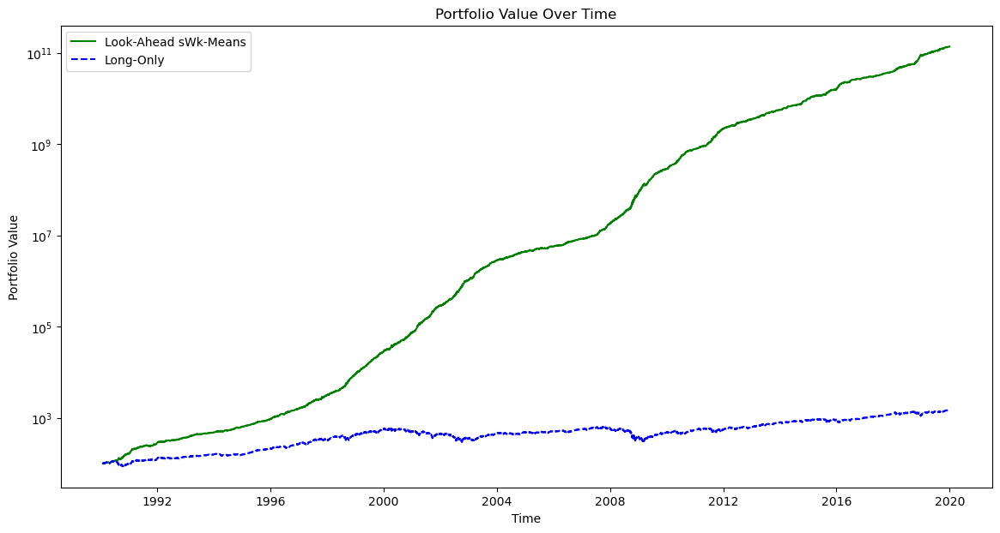

In [115]:
# Plotting 
index = S.index[_window_size:_window_size+len(portfolio_value)]  # Ensure the index aligns with the portfolio values
index_2 = S.index[_window_size:_window_size+len(portfolio_value_long)]

fig, ax = plt.subplots(figsize=(14, 7))
ax.plot(index, portfolio_value, label='Look-Ahead sWk-Means', color='green')  
ax.plot(index_2, portfolio_value_long, label='Long-Only', color='blue', linestyle='--')
ax.set_yscale('log')
ax.set_title("Portfolio Value Over Time")
ax.set_xlabel("Time")
ax.set_ylabel("Portfolio Value")
ax.legend()
plt.show()


### (2.3.2) Europe: CAC40, DAX 40, FTSE 100

In [2]:
#### 
#df_europe = equity_loader.get_close_prices(start_date=start_date, end_date=end_date, regions=['europe'], interval=interval)
#df_europe.dropna(inplace=True)

df_europe = pd.read_csv('data/df_europe.csv', index_col=0, parse_dates=True)
df_europe.dropna(inplace=True)

df_europe = df_europe.loc[start_date_ref:end_date_ref]



NameError: name 'start_date_ref' is not defined

#### PARAMETERS (EUROPE)

In [ ]:
#data loading
S = df_europe

# Parameters for sliced Wasserstein K-Means
h2 = 1
h1 = 3
N_S = 40
L = 20
epsilon = 1e-6

#initial capital for backtesting
initial_capital = 100

#lookback over a month of trading days
_window_size = 20 #window over which we compute regimes
_majority_lookback = 20 #for computing the exponetial weighting
_half_life = 5 #half life for exponential weighting of the regimes


_use_gradient = True 
_grad_weight = 0.7
_tau_gradient = None # 0.01
_tau = None #0.01
_lookback = 20 #for computing the gradient lookback



_entry_threshold = 0.30
_hold_threshold = 0.25

#### (A) Preliminary Regime Detection for European Index 

In [16]:
project_emp, centroids, labels = ws.max_mccd_unifortho_sim(N_S=N_S, S=df_europe, K=2, L=L, epsilon=epsilon, h1=h1, h2=h2, metric="CVaR")

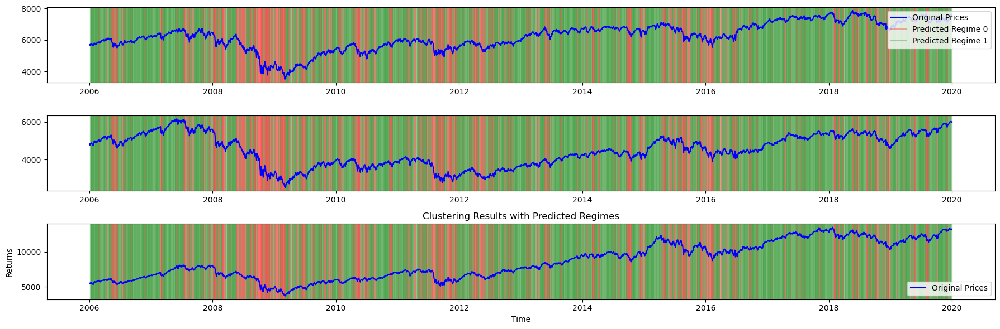

In [17]:
mt.visualize_clustering_results(df_europe.index, df_europe, labels, h1, h2, K=2, returns=False)

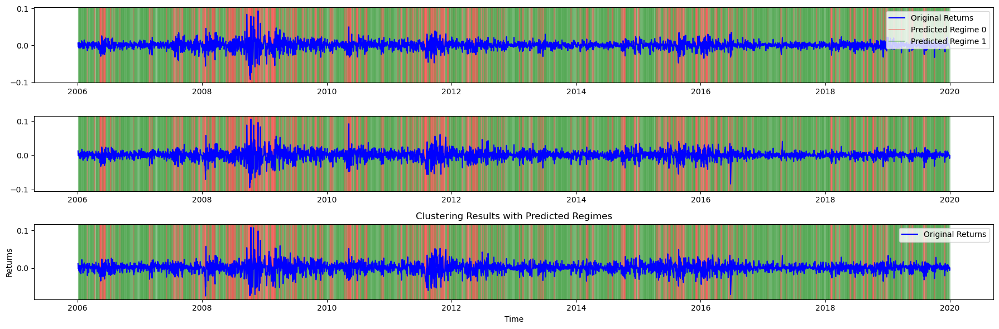

In [18]:
mt.visualize_clustering_results(df_europe.index, df_europe, labels, h1, h2, K=2)

#### (B) Trading Strategies on European Equity Indices (Lagged Signal)

In [ ]:
# LONG-SHORT SWKMEANS
print("-----------------------LONG-SHORT SWKMEANS -------------------------")
portfolio_value_unif, trade_signals, cum_pnl = tr.long_strat_unifortho(
    initial_capital=initial_capital, N_S=N_S, S=S, L=L, h1=h1, h2=h2,
    window_size=_window_size, majority_lookback=_majority_lookback, half_life=_half_life)
mt.report_metrics("LongShort UnifOrtho", portfolio_value = portfolio_value_unif, trade_signals = trade_signals, window_size=_window_size, cum_pnl=cum_pnl, n_years=n_years)

# IMPLIED PROBABILITY (CONVICTION)
print("---------- IMPLIED PROBABILITY TRADING STRATEGY (CONVICTION) ---------")
_signal_type = "conviction"
portfolio_value_unif_implied_conviction, trade_signals_implied_conviction, cum_pnl_implied_conviction, switch_proba_history_conviction = tr.long_strat_implied(
    initial_capital, N_S, S, L, h1, h2, _window_size, signal_type=_signal_type,
    majority_lookback=_majority_lookback, half_life=_half_life, entry_threshold=_entry_threshold,
    hold_threshold=_hold_threshold, lookback=_lookback, gradient_weight=_grad_weight,
    use_gradient=_use_gradient, tau=_tau, tau_gradient=_tau_gradient)
mt.report_metrics("Implied Conviction", portfolio_value=portfolio_value_unif_implied_conviction, trade_signals=trade_signals_implied_conviction, window_size=_window_size, cum_pnl=cum_pnl_implied_conviction, n_years=n_years)

# IMPLIED PROBABILITY (HYSTERESIS)
print("---------- IMPLIED PROBABILITY TRADING STRATEGY (HYSTERESIS) --------")
_signal_type = "hysteresis"
portfolio_value_unif_implied_hysteresis, trade_signals_implied_hysteresis, cum_pnl_implied_hysteresis, switch_proba_history_hysteresis = tr.long_strat_implied(
    initial_capital, N_S, S, L, h1, h2, _window_size, signal_type=_signal_type,
    majority_lookback=_majority_lookback, half_life=_half_life, entry_threshold=_entry_threshold,
    hold_threshold=_hold_threshold, lookback=_lookback, gradient_weight=_grad_weight,
    use_gradient=_use_gradient, tau=_tau, tau_gradient=_tau_gradient)
mt.report_metrics("Implied Hysteresis", portfolio_value=portfolio_value_unif_implied_hysteresis, trade_signals=trade_signals_implied_hysteresis, window_size=_window_size, cum_pnl=cum_pnl_implied_hysteresis, n_years=n_years)

# IMPLIED PROBABILITY (CONTINUOUS)
print("---------- IMPLIED PROBABILITY TRADING STRATEGY (CONTINUOUS) --------")
_signal_type = "continuous"
portfolio_value_unif_implied_continuous, trade_signals_implied_continuous, cum_pnl_implied_continuous, switch_proba_history_continuous = tr.long_strat_implied(
    initial_capital, N_S, S, L, h1, h2, _window_size, signal_type=_signal_type,
    majority_lookback=_majority_lookback, half_life=_half_life, entry_threshold=_entry_threshold,
    hold_threshold=_hold_threshold, lookback=_lookback, gradient_weight=_grad_weight,
    use_gradient=_use_gradient, tau=_tau, tau_gradient=_tau_gradient)
mt.report_metrics("Implied Continuous", portfolio_value=portfolio_value_unif_implied_continuous, trade_signals=trade_signals_implied_continuous, window_size=_window_size, cum_pnl=cum_pnl_implied_continuous, n_years=n_years)

# ENSEMBLE (TUNED WEIGHTS)
print("---------- ENSEMBLE STRATEGY (TUNED WEIGHTS) --------")
_ensemble_weights = [0.1, 0.4, 0.1, 0.4]
portfolio_value_ensemble, trade_signals_ensemble, cum_pnl_ensemble, signal_details_ensemble = tr.ensemble_strategy(
    initial_capital, N_S, S, L, h1, h2, _window_size, majority_lookback=_majority_lookback,
    ensemble_weights=_ensemble_weights, lookback=_lookback, use_gradient=_use_gradient,
    gradient_weight=_grad_weight, entry_threshold=_entry_threshold, hold_threshold=_hold_threshold,
    tau=_tau, tau_gradient=_tau_gradient, half_life=_half_life)
mt.report_metrics("Ensemble (tuned)", portfolio_value=portfolio_value_ensemble, trade_signals=trade_signals_ensemble, window_size=_window_size, cum_pnl=cum_pnl_ensemble, n_years=n_years)

# ENSEMBLE (EQUAL WEIGHTS)
print("---------- ENSEMBLE STRATEGY (EQUAL WEIGHTS) --------")
_ensemble_weights = [0.25, 0.25, 0.25, 0.25]
portfolio_value_eq_wg, trade_signals_ensemble_eq_wg, cum_pnl_ensemble_eq_wg, signal_details_ensemble_eq_wg = tr.ensemble_strategy(
    initial_capital, N_S, S, L, h1, h2, _window_size, majority_lookback=_majority_lookback,
    ensemble_weights=_ensemble_weights, lookback=_lookback, use_gradient=_use_gradient,
    gradient_weight=_grad_weight, entry_threshold=_entry_threshold, hold_threshold=_hold_threshold,
    tau=_tau, tau_gradient=_tau_gradient, half_life=_half_life)
mt.report_metrics("Ensemble (equal)", portfolio_value_eq_wg, trade_signals_ensemble_eq_wg, window_size=_window_size, cum_pnl=cum_pnl_ensemble_eq_wg, n_years=n_years)

# LONG / SHORT ONLY
print("---------- LONG AND SHORT ONLY --------")
portfolio_value_long,  cum_pnl_long,  final_value_long  = tr.long_only(df_america, initial_capital=initial_capital, weighting="inverse_vol", window_size=_window_size)
portfolio_value_short, cum_pnl_short, final_value_short = tr.short_only(df_america, initial_capital=initial_capital, weighting="inverse_vol", window_size=_window_size)
mt.report_metrics("Long only",  portfolio_value_long,  window_size=_window_size, cum_pnl=cum_pnl_long, n_years=n_years)
mt.report_metrics("Short only", portfolio_value_short, window_size=_window_size, cum_pnl=cum_pnl_short, n_years=n_years)

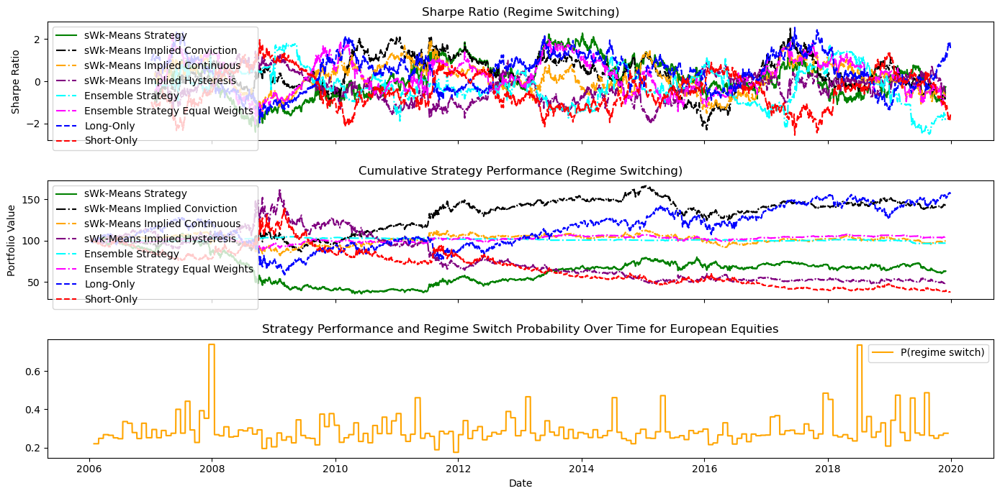

--------------------------------------------------
--- SWk-Means Strategy Performance ---
Final portfolio value: 63.2154 for the normal sWk-Means strategy.
Final cumulative P&L: -36.7846 for the normal sWk-Means strategy.
Final Sharpe ratio: -0.0738 for the normal sWk-Means strategy.
Annual return: -3.22% for the normal sWk-Means strategy.
////////////////////////////////////////////////////////////////////////////////////////////////////
--- SWk-Means Implied Strategy Conviction Performance ---
Final portfolio value: 143.5682 for the sWk-Means Implied strategy.
Final cumulative P&L: 43.5682 for the sWk-Means Implied strategy.
Final Sharpe ratio: 1.0405 for the sWk-Means Implied strategy.
Annual return: 2.62% for the sWk-Means Implied strategy.
////////////////////////////////////////////////////////////////////////////////////////////////////
--- SWk-Means Implied Strategy Continuous Performance ---
Final portfolio value: 99.9148 for the sWk-Means Implied strategy.
Final cumulative P&

In [ ]:
data = df_europe
window_size= _window_size

trade_start_idx = window_size  # trading begins after the first analysis window
trade_dates_unif = data.index[trade_start_idx : len(portfolio_value_unif) + trade_start_idx]
trade_dates_implied_conviction = data.index[trade_start_idx : len(portfolio_value_unif_implied_conviction) + trade_start_idx]
trade_dates_implied_continuous = data.index[trade_start_idx : len(portfolio_value_unif_implied_continuous) + trade_start_idx]
trade_dates_implied_hysteresis = data.index[trade_start_idx : len(portfolio_value_unif_implied_hysteresis) + trade_start_idx]
trade_dates_switch_conviction = data.index[trade_start_idx : trade_start_idx + len(switch_proba_history_conviction)]
trade_dates_switch_continuous = data.index[trade_start_idx : trade_start_idx + len(switch_proba_history_continuous)]
trade_dates_switch_hysteresis = data.index[trade_start_idx : trade_start_idx + len(switch_proba_history_hysteresis)]
trade_dates_ensemble = data.index[trade_start_idx : trade_start_idx + len(portfolio_value_ensemble)]
trade_dates_ensemble_eq_wg = data.index[trade_start_idx : trade_start_idx + len(portfolio_value_eq_wg)]


pv_unif_series = pd.Series(portfolio_value_unif, index=trade_dates_unif)
pv_implied_series_conviction = pd.Series(portfolio_value_unif_implied_conviction, index=trade_dates_implied_conviction)
pv_implied_series_continuous = pd.Series(portfolio_value_unif_implied_continuous, index=trade_dates_implied_continuous)
pv_ensemble_series = pd.Series(portfolio_value_ensemble, index=trade_dates_ensemble)
pv_ensemble_eq_wg_series = pd.Series(portfolio_value_eq_wg, index=trade_dates_ensemble)
pv_implied_series_hysteresis = pd.Series(portfolio_value_unif_implied_hysteresis, index=trade_dates_implied_hysteresis)
sp_series_conviction = pd.Series(switch_proba_history_conviction, index=trade_dates_switch_conviction)
sp_series_continuous = pd.Series(switch_proba_history_continuous, index=trade_dates_switch_continuous)
sp_series_hysteresis = pd.Series(switch_proba_history_hysteresis, index=trade_dates_switch_hysteresis)

# --- Plot with correctly aligned datetime indices ---
fig, ax = plt.subplots(3, 1, figsize=(14, 7), sharex=True)


ax[0].plot(pv_unif_series.index, tr.rolling_sharpe(pv_unif_series.values, dates=pv_unif_series.index, days_lookback=252), label='sWk-Means Strategy', color='green')
ax[0].plot(pv_implied_series_conviction.index, tr.rolling_sharpe(pv_implied_series_conviction.values, dates=pv_implied_series_conviction.index, days_lookback=252), label='sWk-Means Implied Conviction', color='black', linestyle='-.')
ax[0].plot(pv_implied_series_continuous.index, tr.rolling_sharpe(pv_implied_series_continuous.values, dates=pv_implied_series_continuous.index, days_lookback=252), label='sWk-Means Implied Continuous', color='orange', linestyle='-.')
ax[0].plot(pv_implied_series_hysteresis.index, tr.rolling_sharpe(pv_implied_series_hysteresis.values, dates=pv_implied_series_hysteresis.index, days_lookback=252), label='sWk-Means Implied Hysteresis', color='purple', linestyle='-.')
ax[0].plot(pv_ensemble_series.index, tr.rolling_sharpe(pv_ensemble_series.values, dates=pv_ensemble_series.index, days_lookback=252), label='Ensemble Strategy', color='cyan', linestyle='-.')
ax[0].plot(pv_ensemble_eq_wg_series.index, tr.rolling_sharpe(pv_ensemble_eq_wg_series.values, dates=pv_ensemble_eq_wg_series.index, days_lookback=252), label='Ensemble Strategy Equal Weights', color='magenta', linestyle='-.')
ax[0].plot(portfolio_value_long.index, tr.rolling_sharpe(portfolio_value_long.values, dates=portfolio_value_long.index, days_lookback=252), label='Long-Only', color='blue', linestyle='--')
ax[0].plot(portfolio_value_short.index, tr.rolling_sharpe(portfolio_value_short.values, dates=portfolio_value_short.index, days_lookback=252), label='Short-Only', color='red', linestyle='--')
ax[0].set_title("Sharpe Ratio (Regime Switching)")
ax[0].set_ylabel("Sharpe Ratio", fontsize=10)
ax[0].legend(loc='upper left')

ax[1].plot(pv_unif_series.index, pv_unif_series.values, label='sWk-Means Strategy', color='green')
ax[1].plot(pv_implied_series_conviction.index, pv_implied_series_conviction.values, label='sWk-Means Implied Conviction', color='black', linestyle='-.')
ax[1].plot(pv_implied_series_continuous.index, pv_implied_series_continuous.values, label='sWk-Means Implied Continuous', color='orange', linestyle='-.')
ax[1].plot(pv_implied_series_hysteresis.index, pv_implied_series_hysteresis.values, label='sWk-Means Implied Hysteresis', color='purple', linestyle='-.')
ax[1].plot(pv_ensemble_series.index, pv_ensemble_series.values, label='Ensemble Strategy', color='cyan', linestyle='-.')
ax[1].plot(pv_ensemble_eq_wg_series.index, pv_ensemble_eq_wg_series.values, label='Ensemble Strategy Equal Weights', color='magenta', linestyle='-.')
ax[1].plot(portfolio_value_long.index, portfolio_value_long.values, label='Long-Only', color='blue', linestyle='--')
ax[1].plot(portfolio_value_short.index, portfolio_value_short.values, label='Short-Only', color='red', linestyle='--')
ax[1].set_title("Cumulative Strategy Performance (Regime Switching)")
ax[1].set_ylabel("Portfolio Value")
ax[1].legend(loc='upper left')

ax[2].plot(sp_series_continuous.index, sp_series_continuous.values, label='P(regime switch)', color='orange')
ax[2].set_title("Estimated Probability of Regime Switch Over Time")
ax[2].set_xlabel("Date")
ax[2].legend()

plt.title("Strategy Performance and Regime Switch Probability Over Time for European Equities")
plt.tight_layout()
plt.show()





# --- SWk-Means Strategy ---
daily_returns = np.diff(portfolio_value_unif) / portfolio_value_unif[:-1]
sharpe_ratio = np.mean(daily_returns) / np.std(daily_returns) * np.sqrt(252)
n_years = 14  # 2006 to 2020
annual_return = (portfolio_value_unif[-1] / portfolio_value_unif[0]) ** (1 / n_years) - 1

# --- SWk-Means Implied Strategy ---
daily_returns_implied_conviction = np.diff(portfolio_value_unif_implied_conviction) / portfolio_value_unif_implied_conviction[:-1]
sharpe_ratio_implied_conviction = np.mean(daily_returns_implied_conviction) / np.std(daily_returns_implied_conviction) * np.sqrt(14*252)
annual_return_implied_conviction = (portfolio_value_unif_implied_conviction[-1] / portfolio_value_unif_implied_conviction[0]) ** (1 / n_years) - 1

daily_returns_implied_continuous = np.diff(portfolio_value_unif_implied_continuous) / portfolio_value_unif_implied_continuous[:-1]
sharpe_ratio_implied_continuous = np.mean(daily_returns_implied_continuous) / np.std(daily_returns_implied_continuous) * np.sqrt(14*252)
annual_return_implied_continuous = (portfolio_value_unif_implied_continuous[-1] / portfolio_value_unif_implied_continuous[0]) ** (1 / n_years) - 1

daily_returns_implied_hysteresis = np.diff(portfolio_value_unif_implied_hysteresis) / portfolio_value_unif_implied_hysteresis[:-1]
sharpe_ratio_implied_hysteresis = np.mean(daily_returns_implied_hysteresis) / np.std(daily_returns_implied_hysteresis) * np.sqrt(14*252)
annual_return_implied_hysteresis = (portfolio_value_unif_implied_hysteresis[-1] / portfolio_value_unif_implied_hysteresis[0]) ** (1 / n_years) - 1

daily_returns_ensemble = np.diff(portfolio_value_ensemble) / portfolio_value_ensemble[:-1]
sharpe_ratio_ensemble = np.mean(daily_returns_ensemble) / np.std(daily_returns_ensemble) * np.sqrt(14*252)
annual_return_ensemble = (portfolio_value_ensemble[-1] / portfolio_value_ensemble[0]) ** (1 / n_years) - 1

daily_returns_ensemble_eq_wg = np.diff(portfolio_value_eq_wg) / portfolio_value_eq_wg[:-1]
sharpe_ratio_ensemble_eq_wg = np.mean(daily_returns_ensemble_eq_wg) / np.std(daily_returns_ensemble_eq_wg) * np.sqrt(14*252)
annual_return_ensemble_eq_wg = (portfolio_value_eq_wg[-1] / portfolio_value_eq_wg[0]) ** (1 / n_years) - 1

# --- Long Only ---
daily_returns_long = cum_pnl_long.pct_change().dropna()
sharpe_ratio_long = daily_returns_long.mean() / daily_returns_long.std() * np.sqrt(14*252)
annual_return_long = (cum_pnl_long.iloc[-1] / cum_pnl_long.iloc[0]) ** (1 / n_years) - 1

# --- Short Only ---
daily_returns_short = cum_pnl_short.pct_change().dropna()
sharpe_ratio_short = daily_returns_short.mean() / daily_returns_short.std() * np.sqrt(14*252)
annual_return_short = (cum_pnl_short.iloc[-1] / cum_pnl_short.iloc[0]) ** (1 / n_years) - 1

# --- Print Results ---
print('-' * 50)
print("--- SWk-Means Strategy Performance ---")
print(f'Final portfolio value: {portfolio_value_unif[-1]:.4f} for the normal sWk-Means strategy.')
print(f"Final cumulative P&L: {cum_pnl[-1]:.4f} for the normal sWk-Means strategy.")
print(f'Final Sharpe ratio: {sharpe_ratio:.4f} for the normal sWk-Means strategy.')
print(f"Annual return: {annual_return * 100:.2f}% for the normal sWk-Means strategy.")
print("//" * 50)
print("--- SWk-Means Implied Strategy Conviction Performance ---")
print(f'Final portfolio value: {portfolio_value_unif_implied_conviction[-1]:.4f} for the sWk-Means Implied strategy.')
print(f"Final cumulative P&L: {cum_pnl_implied_conviction[-1]:.4f} for the sWk-Means Implied strategy.")
print(f'Final Sharpe ratio: {sharpe_ratio_implied_conviction:.4f} for the sWk-Means Implied strategy.')
print(f"Annual return: {annual_return_implied_conviction * 100:.2f}% for the sWk-Means Implied strategy.")
print("//" * 50)

print("--- SWk-Means Implied Strategy Continuous Performance ---")
print(f'Final portfolio value: {portfolio_value_unif_implied_continuous[-1]:.4f} for the sWk-Means Implied strategy.')
print(f"Final cumulative P&L: {cum_pnl_implied_continuous[-1]:.4f} for the sWk-Means Implied strategy.")
print(f'Final Sharpe ratio: {sharpe_ratio_implied_continuous:.4f} for the sWk-Means Implied strategy.')
print(f"Annual return: {annual_return_implied_continuous * 100:.2f}% for the sWk-Means Implied strategy.")
print("//" * 50)

print("--- SWk-Means Implied Strategy Hysteresis Performance ---")
print(f'Final portfolio value: {portfolio_value_unif_implied_hysteresis[-1]:.4f} for the sWk-Means Implied strategy.')
print(f"Final cumulative P&L: {cum_pnl_implied_hysteresis[-1]:.4f} for the sWk-Means Implied strategy.")
print(f'Final Sharpe ratio: {sharpe_ratio_implied_hysteresis:.4f} for the sWk-Means Implied strategy.')
print(f"Annual return: {annual_return_implied_hysteresis * 100:.2f}% for the sWk-Means Implied strategy.")
print("//" * 50)

print("--- Ensemble Strategy Performance ---")
print(f'Final portfolio value: {portfolio_value_ensemble[-1]:.4f} for the Ensemble strategy.')
print(f"Final cumulative P&L: {cum_pnl_ensemble[-1]:.4f} for the Ensemble strategy.")
print(f'Final Sharpe ratio: {sharpe_ratio_ensemble:.4f} for the Ensemble strategy.')
print(f"Annual return: {annual_return_ensemble * 100:.2f}% for the Ensemble strategy.")
print("//" * 50)

print("--- Ensemble Strategy Equal Weights Performance ---")
print(f'Final portfolio value: {portfolio_value_eq_wg[-1]:.4f} for the Ensemble strategy with equal weights.')
print(f"Final cumulative P&L: {cum_pnl_ensemble_eq_wg[-1]:.4f} for the Ensemble strategy with equal weights.")
print(f'Final Sharpe ratio: {sharpe_ratio_ensemble_eq_wg:.4f} for the Ensemble strategy with equal weights.')
print(f"Annual return: {annual_return_ensemble_eq_wg * 100:.2f}% for the Ensemble strategy with equal weights.")    
print("//" * 50)

print("--- Long ONLY Performance ---")
print(f'Final P&L for long-only strategy: {(cum_pnl_long.iloc[-1] - 1) * 100:.2f}%')
print(f"Final cumulative Portfolio Value: {final_value_long:.4f} for the long-only strategy.")
print(f'Final Sharpe ratio: {sharpe_ratio_long:.4f} for the long-only strategy.')
print(f"Annual return: {annual_return_long * 100:.2f}% for the long-only strategy.")
print("//" * 50)
print("--- Short ONLY Performance ---")
print(f'Final P&L for short-only strategy: {(cum_pnl_short.iloc[-1] - 1) * 100:.2f}%')
print(f"Final cumulative Portfolio Value: {final_value_short:.4f} for the short-only strategy.")
print(f'Final Sharpe ratio: {sharpe_ratio_short:.4f} for the short-only strategy.')
print(f"Annual return: {annual_return_short * 100:.2f}% for the short-only strategy.")
print('-' * 50)




##### LEDOIT-Wolf Sharpe Ratio Analysis 

In [94]:
benchmark_long_only_ret =  np.diff(portfolio_value_long.values) / portfolio_value_long.values[:-1]
strategy_unif_ret = np.diff(portfolio_value_unif) / portfolio_value_unif[:-1]
strategy_implied_conviction_ret = np.diff(portfolio_value_unif_implied_conviction) / portfolio_value_unif_implied_conviction[:-1]
strategy_implied_continuous_ret = np.diff(portfolio_value_unif_implied_continuous) / portfolio_value_unif_implied_continuous[:-1]
strategy_implied_hysteresis_ret = np.diff(portfolio_value_unif_implied_hysteresis) / portfolio_value_unif_implied_hysteresis[:-1]
strategy_ensemble_ret = np.diff(portfolio_value_ensemble) / portfolio_value_ensemble[:-1]
strategy_ensemble_eq_wg_ret = np.diff(portfolio_value_eq_wg) / portfolio_value_eq_wg[:-1]
min_len = min(len(strategy_unif_ret), len(benchmark_long_only_ret))

#Comparing the normal swkmean strategy returns to the benchmark
res = lw.ledoit_wolf_test(strategy_unif_ret[:min_len], benchmark_long_only_ret[:min_len], method="hac", K_calibration=500)
lw.print_results(res, "sWk-Means", "Long-Only")

res = lw.ledoit_wolf_test(strategy_implied_conviction_ret[:min_len], benchmark_long_only_ret[:min_len], method="hac", K_calibration=500)
lw.print_results(res, "sWk-Means Implied Conviction", "Long-Only")

res = lw.ledoit_wolf_test(strategy_implied_continuous_ret[:min_len], benchmark_long_only_ret[:min_len], method="hac", K_calibration=500)
lw.print_results(res, "sWk-Means Implied Continuous", "Long-Only")

res = lw.ledoit_wolf_test(strategy_implied_hysteresis_ret[:min_len], benchmark_long_only_ret[:min_len], method="hac", K_calibration=500)
lw.print_results(res, "sWk-Means Implied Hysteresis", "Long-Only")


res = lw.ledoit_wolf_test(strategy_ensemble_ret[:min_len], benchmark_long_only_ret[:min_len], method="hac", K_calibration=500)
lw.print_results(res, "Ensemble Strategy", "Long-Only")


res = lw.ledoit_wolf_test(strategy_ensemble_eq_wg_ret[:min_len], benchmark_long_only_ret[:min_len], method="hac", K_calibration=500)
lw.print_results(res, "Ensemble Strategy Equal Weights", "Long-Only")

  Ledoit & Wolf (2008) Sharpe Ratio Difference Test
  sWk-Means SR  :  -0.0033
  Long-Only SR :  0.0163
  Δ (SR_i − SR_n)    :  -0.0196
  T (observations)   :  3549
-----------------------------------------------------------------
  HAC p-value        :  0.2965
  HAC std error      :  0.018770
  ➜  FAIL TO REJECT H0 at 5%: no significant difference in Sharpe ratios.

  Ledoit & Wolf (2008) Sharpe Ratio Difference Test
  sWk-Means Implied Conviction SR  :  0.0023
  Long-Only SR :  0.0163
  Δ (SR_i − SR_n)    :  -0.0140
  T (observations)   :  3549
-----------------------------------------------------------------
  HAC p-value        :  0.4993
  HAC std error      :  0.020793
  ➜  FAIL TO REJECT H0 at 5%: no significant difference in Sharpe ratios.

  Ledoit & Wolf (2008) Sharpe Ratio Difference Test
  sWk-Means Implied Continuous SR  :  0.0069
  Long-Only SR :  0.0163
  Δ (SR_i − SR_n)    :  -0.0094
  T (observations)   :  3549
-----------------------------------------------------------

#### (C) Trading Strategies on European Equity Indices (not-Lagged)

### (2.3.3) Asia: Nikkei 225, KOSPI, Hang Seng

In [16]:
#df_asia = equity_loader.get_close_prices(start_date=start_date, end_date=end_date, regions=['asia'], interval=interval)

df_asia = pd.read_csv('data/df_asia.csv', index_col=0, parse_dates=True)
df_asia.dropna(inplace=True)

df_asia = df_asia.loc[start_date_ref:end_date_ref]

#### PARAMETERS (ASIA)

In [ ]:
#data loading
S = df_asia 

# Parameters for sliced Wasserstein K-Means
h2 = 1
h1 = 3
N_S = 40
L = 20
epsilon = 1e-6

#initial capital for backtesting
initial_capital = 100

#lookback over a month of trading days
_window_size = 20 #window over which we compute regimes
_majority_lookback = 20 #for computing the exponetial weighting
_half_life = 5 #half life for exponential weighting of the regimes


_use_gradient = True 
_grad_weight = 0.7
_tau_gradient = None # 0.01
_tau = None #0.01
_lookback = 20 #for computing the gradient lookback



_entry_threshold = 0.30
_hold_threshold = 0.25

#### (A) Preliminary Regime Detection for Asian Index 

In [17]:

project_emp, centroids, labels = ws.max_mccd_unifortho_sim(N_S=N_S, S=df_asia, K=2, L=L, epsilon=epsilon, h1=h1, h2=h2, metric="CVaR")

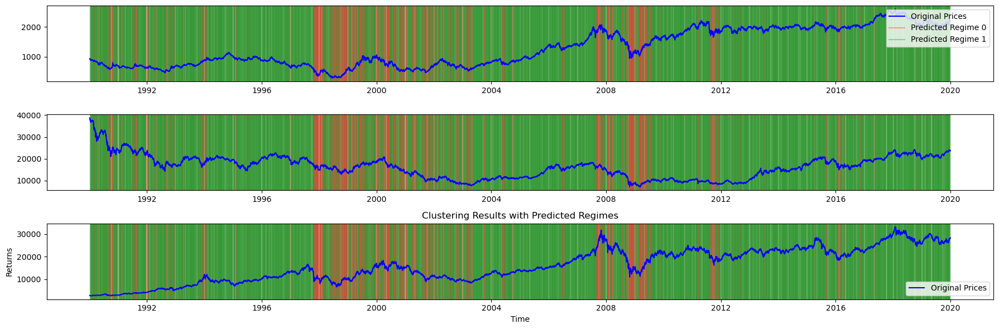

In [18]:
mt.visualize_clustering_results(df_asia.index, df_asia, labels, h1, h2, K=2, returns=False)

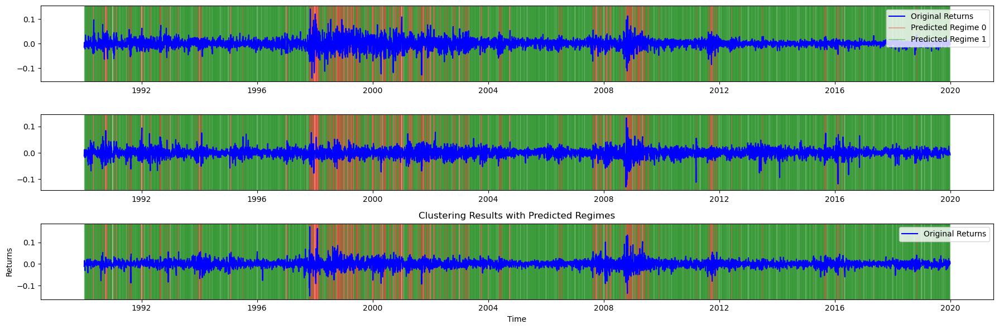

In [19]:
mt.visualize_clustering_results(df_asia.index, df_asia, labels, h1, h2, K=2) 

#### (B) Trading Strategies on Asian Equity Indices (Lagged)

In [ ]:
# LONG-SHORT SWKMEANS
print("-----------------------LONG-SHORT SWKMEANS -------------------------")
portfolio_value_unif, trade_signals, cum_pnl = tr.long_strat_unifortho(
    initial_capital=initial_capital, N_S=N_S, S=S, L=L, h1=h1, h2=h2,
    window_size=_window_size, majority_lookback=_majority_lookback, half_life=_half_life)
mt.report_metrics("LongShort UnifOrtho", portfolio_value = portfolio_value_unif, trade_signals = trade_signals, window_size=_window_size, cum_pnl=cum_pnl, n_years=n_years)

# IMPLIED PROBABILITY (CONVICTION)
print("---------- IMPLIED PROBABILITY TRADING STRATEGY (CONVICTION) ---------")
_signal_type = "conviction"
portfolio_value_unif_implied_conviction, trade_signals_implied_conviction, cum_pnl_implied_conviction, switch_proba_history_conviction = tr.long_strat_implied(
    initial_capital, N_S, S, L, h1, h2, _window_size, signal_type=_signal_type,
    majority_lookback=_majority_lookback, half_life=_half_life, entry_threshold=_entry_threshold,
    hold_threshold=_hold_threshold, lookback=_lookback, gradient_weight=_grad_weight,
    use_gradient=_use_gradient, tau=_tau, tau_gradient=_tau_gradient)
mt.report_metrics("Implied Conviction", portfolio_value=portfolio_value_unif_implied_conviction, trade_signals=trade_signals_implied_conviction, window_size=_window_size, cum_pnl=cum_pnl_implied_conviction, n_years=n_years)

# IMPLIED PROBABILITY (HYSTERESIS)
print("---------- IMPLIED PROBABILITY TRADING STRATEGY (HYSTERESIS) --------")
_signal_type = "hysteresis"
portfolio_value_unif_implied_hysteresis, trade_signals_implied_hysteresis, cum_pnl_implied_hysteresis, switch_proba_history_hysteresis = tr.long_strat_implied(
    initial_capital, N_S, S, L, h1, h2, _window_size, signal_type=_signal_type,
    majority_lookback=_majority_lookback, half_life=_half_life, entry_threshold=_entry_threshold,
    hold_threshold=_hold_threshold, lookback=_lookback, gradient_weight=_grad_weight,
    use_gradient=_use_gradient, tau=_tau, tau_gradient=_tau_gradient)
mt.report_metrics("Implied Hysteresis", portfolio_value=portfolio_value_unif_implied_hysteresis, trade_signals=trade_signals_implied_hysteresis, window_size=_window_size, cum_pnl=cum_pnl_implied_hysteresis, n_years=n_years)

# IMPLIED PROBABILITY (CONTINUOUS)
print("---------- IMPLIED PROBABILITY TRADING STRATEGY (CONTINUOUS) --------")
_signal_type = "continuous"
portfolio_value_unif_implied_continuous, trade_signals_implied_continuous, cum_pnl_implied_continuous, switch_proba_history_continuous = tr.long_strat_implied(
    initial_capital, N_S, S, L, h1, h2, _window_size, signal_type=_signal_type,
    majority_lookback=_majority_lookback, half_life=_half_life, entry_threshold=_entry_threshold,
    hold_threshold=_hold_threshold, lookback=_lookback, gradient_weight=_grad_weight,
    use_gradient=_use_gradient, tau=_tau, tau_gradient=_tau_gradient)
mt.report_metrics("Implied Continuous", portfolio_value=portfolio_value_unif_implied_continuous, trade_signals=trade_signals_implied_continuous, window_size=_window_size, cum_pnl=cum_pnl_implied_continuous, n_years=n_years)

# ENSEMBLE (TUNED WEIGHTS)
print("---------- ENSEMBLE STRATEGY (TUNED WEIGHTS) --------")
_ensemble_weights = [0.1, 0.4, 0.1, 0.4]
portfolio_value_ensemble, trade_signals_ensemble, cum_pnl_ensemble, signal_details_ensemble = tr.ensemble_strategy(
    initial_capital, N_S, S, L, h1, h2, _window_size, majority_lookback=_majority_lookback,
    ensemble_weights=_ensemble_weights, lookback=_lookback, use_gradient=_use_gradient,
    gradient_weight=_grad_weight, entry_threshold=_entry_threshold, hold_threshold=_hold_threshold,
    tau=_tau, tau_gradient=_tau_gradient, half_life=_half_life)
mt.report_metrics("Ensemble (tuned)", portfolio_value=portfolio_value_ensemble, trade_signals=trade_signals_ensemble, window_size=_window_size, cum_pnl=cum_pnl_ensemble, n_years=n_years)

# ENSEMBLE (EQUAL WEIGHTS)
print("---------- ENSEMBLE STRATEGY (EQUAL WEIGHTS) --------")
_ensemble_weights = [0.25, 0.25, 0.25, 0.25]
portfolio_value_eq_wg, trade_signals_ensemble_eq_wg, cum_pnl_ensemble_eq_wg, signal_details_ensemble_eq_wg = tr.ensemble_strategy(
    initial_capital, N_S, S, L, h1, h2, _window_size, majority_lookback=_majority_lookback,
    ensemble_weights=_ensemble_weights, lookback=_lookback, use_gradient=_use_gradient,
    gradient_weight=_grad_weight, entry_threshold=_entry_threshold, hold_threshold=_hold_threshold,
    tau=_tau, tau_gradient=_tau_gradient, half_life=_half_life)
mt.report_metrics("Ensemble (equal)", portfolio_value_eq_wg, trade_signals_ensemble_eq_wg, window_size=_window_size, cum_pnl=cum_pnl_ensemble_eq_wg, n_years=n_years)

# LONG / SHORT ONLY
print("---------- LONG AND SHORT ONLY --------")
portfolio_value_long,  cum_pnl_long,  final_value_long  = tr.long_only(df_america, initial_capital=initial_capital, weighting="inverse_vol", window_size=_window_size)
portfolio_value_short, cum_pnl_short, final_value_short = tr.short_only(df_america, initial_capital=initial_capital, weighting="inverse_vol", window_size=_window_size)
mt.report_metrics("Long only",  portfolio_value_long,  window_size=_window_size, cum_pnl=cum_pnl_long, n_years=n_years)
mt.report_metrics("Short only", portfolio_value_short, window_size=_window_size, cum_pnl=cum_pnl_short, n_years=n_years)

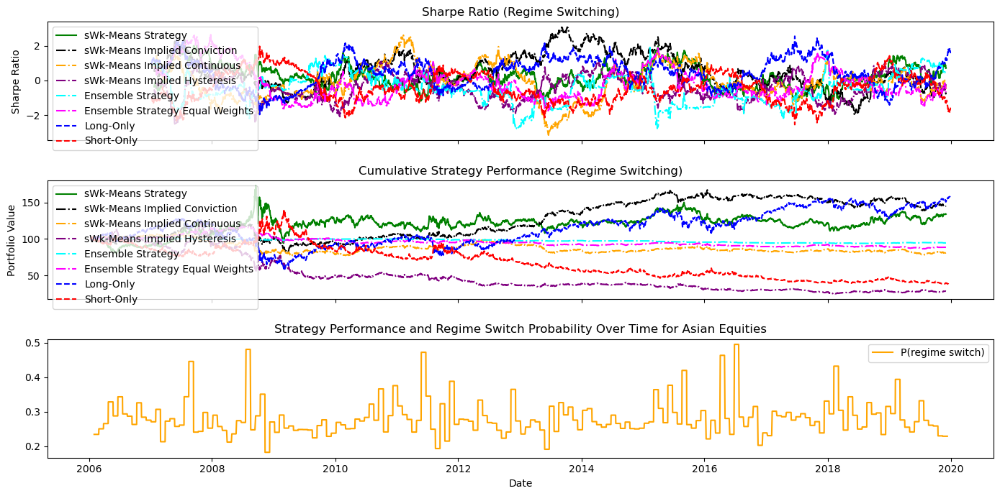

--------------------------------------------------
--- SWk-Means Strategy Performance ---
Final portfolio value: 133.9877 for the normal sWk-Means strategy.
Final cumulative P&L: 33.9877 for the normal sWk-Means strategy.
Final Sharpe ratio: 0.2043 for the normal sWk-Means strategy.
Annual return: 2.11% for the normal sWk-Means strategy.
////////////////////////////////////////////////////////////////////////////////////////////////////
--- SWk-Means Implied Strategy Conviction Performance ---
Final portfolio value: 145.5225 for the sWk-Means Implied strategy.
Final cumulative P&L: 45.5225 for the sWk-Means Implied strategy.
Final Sharpe ratio: 1.1506 for the sWk-Means Implied strategy.
Annual return: 2.72% for the sWk-Means Implied strategy.
////////////////////////////////////////////////////////////////////////////////////////////////////
--- SWk-Means Implied Strategy Continuous Performance ---
Final portfolio value: 81.0248 for the sWk-Means Implied strategy.
Final cumulative P&L:

In [ ]:
data = df_asia
window_size= _window_size

trade_start_idx = window_size  # trading begins after the first analysis window
trade_dates_unif = data.index[trade_start_idx : len(portfolio_value_unif) + trade_start_idx]
trade_dates_implied_conviction = data.index[trade_start_idx : len(portfolio_value_unif_implied_conviction) + trade_start_idx]
trade_dates_implied_continuous = data.index[trade_start_idx : len(portfolio_value_unif_implied_continuous) + trade_start_idx]
trade_dates_implied_hysteresis = data.index[trade_start_idx : len(portfolio_value_unif_implied_hysteresis) + trade_start_idx]
trade_dates_switch_conviction = data.index[trade_start_idx : trade_start_idx + len(switch_proba_history_conviction)]
trade_dates_switch_continuous = data.index[trade_start_idx : trade_start_idx + len(switch_proba_history_continuous)]
trade_dates_switch_hysteresis = data.index[trade_start_idx : trade_start_idx + len(switch_proba_history_hysteresis)]
trade_dates_ensemble = data.index[trade_start_idx : trade_start_idx + len(portfolio_value_ensemble)]
trade_dates_ensemble_eq_wg = data.index[trade_start_idx : trade_start_idx + len(portfolio_value_eq_wg)]


pv_unif_series = pd.Series(portfolio_value_unif, index=trade_dates_unif)
pv_implied_series_conviction = pd.Series(portfolio_value_unif_implied_conviction, index=trade_dates_implied_conviction)
pv_implied_series_continuous = pd.Series(portfolio_value_unif_implied_continuous, index=trade_dates_implied_continuous)
pv_ensemble_series = pd.Series(portfolio_value_ensemble, index=trade_dates_ensemble)
pv_ensemble_eq_wg_series = pd.Series(portfolio_value_eq_wg, index=trade_dates_ensemble)
pv_implied_series_hysteresis = pd.Series(portfolio_value_unif_implied_hysteresis, index=trade_dates_implied_hysteresis)
sp_series_conviction = pd.Series(switch_proba_history_conviction, index=trade_dates_switch_conviction)
sp_series_continuous = pd.Series(switch_proba_history_continuous, index=trade_dates_switch_continuous)
sp_series_hysteresis = pd.Series(switch_proba_history_hysteresis, index=trade_dates_switch_hysteresis)

# --- Plot with correctly aligned datetime indices ---
fig, ax = plt.subplots(3, 1, figsize=(14, 7), sharex=True)


ax[0].plot(pv_unif_series.index, tr.rolling_sharpe(pv_unif_series.values, dates=pv_unif_series.index, days_lookback=252), label='sWk-Means Strategy', color='green')
ax[0].plot(pv_implied_series_conviction.index, tr.rolling_sharpe(pv_implied_series_conviction.values, dates=pv_implied_series_conviction.index, days_lookback=252), label='sWk-Means Implied Conviction', color='black', linestyle='-.')
ax[0].plot(pv_implied_series_continuous.index, tr.rolling_sharpe(pv_implied_series_continuous.values, dates=pv_implied_series_continuous.index, days_lookback=252), label='sWk-Means Implied Continuous', color='orange', linestyle='-.')
ax[0].plot(pv_implied_series_hysteresis.index, tr.rolling_sharpe(pv_implied_series_hysteresis.values, dates=pv_implied_series_hysteresis.index, days_lookback=252), label='sWk-Means Implied Hysteresis', color='purple', linestyle='-.')
ax[0].plot(pv_ensemble_series.index, tr.rolling_sharpe(pv_ensemble_series.values, dates=pv_ensemble_series.index, days_lookback=252), label='Ensemble Strategy', color='cyan', linestyle='-.')
ax[0].plot(pv_ensemble_eq_wg_series.index, tr.rolling_sharpe(pv_ensemble_eq_wg_series.values, dates=pv_ensemble_eq_wg_series.index, days_lookback=252), label='Ensemble Strategy Equal Weights', color='magenta', linestyle='-.')
ax[0].plot(portfolio_value_long.index, tr.rolling_sharpe(portfolio_value_long.values, dates=portfolio_value_long.index, days_lookback=252), label='Long-Only', color='blue', linestyle='--')
ax[0].plot(portfolio_value_short.index, tr.rolling_sharpe(portfolio_value_short.values, dates=portfolio_value_short.index, days_lookback=252), label='Short-Only', color='red', linestyle='--')
ax[0].set_title("Sharpe Ratio (Regime Switching)")
ax[0].set_ylabel("Sharpe Ratio", fontsize=10)
ax[0].legend(loc='upper left')

ax[1].plot(pv_unif_series.index, pv_unif_series.values, label='sWk-Means Strategy', color='green')
ax[1].plot(pv_implied_series_conviction.index, pv_implied_series_conviction.values, label='sWk-Means Implied Conviction', color='black', linestyle='-.')
ax[1].plot(pv_implied_series_continuous.index, pv_implied_series_continuous.values, label='sWk-Means Implied Continuous', color='orange', linestyle='-.')
ax[1].plot(pv_implied_series_hysteresis.index, pv_implied_series_hysteresis.values, label='sWk-Means Implied Hysteresis', color='purple', linestyle='-.')
ax[1].plot(pv_ensemble_series.index, pv_ensemble_series.values, label='Ensemble Strategy', color='cyan', linestyle='-.')
ax[1].plot(pv_ensemble_eq_wg_series.index, pv_ensemble_eq_wg_series.values, label='Ensemble Strategy Equal Weights', color='magenta', linestyle='-.')
ax[1].plot(portfolio_value_long.index, portfolio_value_long.values, label='Long-Only', color='blue', linestyle='--')
ax[1].plot(portfolio_value_short.index, portfolio_value_short.values, label='Short-Only', color='red', linestyle='--')
ax[1].set_title("Cumulative Strategy Performance (Regime Switching)")
ax[1].set_ylabel("Portfolio Value")
ax[1].legend(loc='upper left')

ax[2].plot(sp_series_continuous.index, sp_series_continuous.values, label='P(regime switch)', color='orange')
ax[2].set_title("Estimated Probability of Regime Switch Over Time")
ax[2].set_xlabel("Date")
ax[2].legend()

plt.title("Strategy Performance and Regime Switch Probability Over Time for Asian Equities")
plt.tight_layout()
plt.show()





# --- SWk-Means Strategy ---
daily_returns = np.diff(portfolio_value_unif) / portfolio_value_unif[:-1]
sharpe_ratio = np.mean(daily_returns) / np.std(daily_returns) * np.sqrt(252)
n_years = 14  # 2006 to 2020
annual_return = (portfolio_value_unif[-1] / portfolio_value_unif[0]) ** (1 / n_years) - 1

# --- SWk-Means Implied Strategy ---
daily_returns_implied_conviction = np.diff(portfolio_value_unif_implied_conviction) / portfolio_value_unif_implied_conviction[:-1]
sharpe_ratio_implied_conviction = np.mean(daily_returns_implied_conviction) / np.std(daily_returns_implied_conviction) * np.sqrt(14*252)
annual_return_implied_conviction = (portfolio_value_unif_implied_conviction[-1] / portfolio_value_unif_implied_conviction[0]) ** (1 / n_years) - 1

daily_returns_implied_continuous = np.diff(portfolio_value_unif_implied_continuous) / portfolio_value_unif_implied_continuous[:-1]
sharpe_ratio_implied_continuous = np.mean(daily_returns_implied_continuous) / np.std(daily_returns_implied_continuous) * np.sqrt(14*252)
annual_return_implied_continuous = (portfolio_value_unif_implied_continuous[-1] / portfolio_value_unif_implied_continuous[0]) ** (1 / n_years) - 1

daily_returns_implied_hysteresis = np.diff(portfolio_value_unif_implied_hysteresis) / portfolio_value_unif_implied_hysteresis[:-1]
sharpe_ratio_implied_hysteresis = np.mean(daily_returns_implied_hysteresis) / np.std(daily_returns_implied_hysteresis) * np.sqrt(14*252)
annual_return_implied_hysteresis = (portfolio_value_unif_implied_hysteresis[-1] / portfolio_value_unif_implied_hysteresis[0]) ** (1 / n_years) - 1

daily_returns_ensemble = np.diff(portfolio_value_ensemble) / portfolio_value_ensemble[:-1]
sharpe_ratio_ensemble = np.mean(daily_returns_ensemble) / np.std(daily_returns_ensemble) * np.sqrt(14*252)
annual_return_ensemble = (portfolio_value_ensemble[-1] / portfolio_value_ensemble[0]) ** (1 / n_years) - 1

daily_returns_ensemble_eq_wg = np.diff(portfolio_value_eq_wg) / portfolio_value_eq_wg[:-1]
sharpe_ratio_ensemble_eq_wg = np.mean(daily_returns_ensemble_eq_wg) / np.std(daily_returns_ensemble_eq_wg) * np.sqrt(14*252)
annual_return_ensemble_eq_wg = (portfolio_value_eq_wg[-1] / portfolio_value_eq_wg[0]) ** (1 / n_years) - 1

# --- Long Only ---
daily_returns_long = cum_pnl_long.pct_change().dropna()
sharpe_ratio_long = daily_returns_long.mean() / daily_returns_long.std() * np.sqrt(14*252)
annual_return_long = (cum_pnl_long.iloc[-1] / cum_pnl_long.iloc[0]) ** (1 / n_years) - 1

# --- Short Only ---
daily_returns_short = cum_pnl_short.pct_change().dropna()
sharpe_ratio_short = daily_returns_short.mean() / daily_returns_short.std() * np.sqrt(14*252)
annual_return_short = (cum_pnl_short.iloc[-1] / cum_pnl_short.iloc[0]) ** (1 / n_years) - 1

# --- Print Results ---
print('-' * 50)
print("--- SWk-Means Strategy Performance ---")
print(f'Final portfolio value: {portfolio_value_unif[-1]:.4f} for the normal sWk-Means strategy.')
print(f"Final cumulative P&L: {cum_pnl[-1]:.4f} for the normal sWk-Means strategy.")
print(f'Final Sharpe ratio: {sharpe_ratio:.4f} for the normal sWk-Means strategy.')
print(f"Annual return: {annual_return * 100:.2f}% for the normal sWk-Means strategy.")
print("//" * 50)
print("--- SWk-Means Implied Strategy Conviction Performance ---")
print(f'Final portfolio value: {portfolio_value_unif_implied_conviction[-1]:.4f} for the sWk-Means Implied strategy.')
print(f"Final cumulative P&L: {cum_pnl_implied_conviction[-1]:.4f} for the sWk-Means Implied strategy.")
print(f'Final Sharpe ratio: {sharpe_ratio_implied_conviction:.4f} for the sWk-Means Implied strategy.')
print(f"Annual return: {annual_return_implied_conviction * 100:.2f}% for the sWk-Means Implied strategy.")
print("//" * 50)

print("--- SWk-Means Implied Strategy Continuous Performance ---")
print(f'Final portfolio value: {portfolio_value_unif_implied_continuous[-1]:.4f} for the sWk-Means Implied strategy.')
print(f"Final cumulative P&L: {cum_pnl_implied_continuous[-1]:.4f} for the sWk-Means Implied strategy.")
print(f'Final Sharpe ratio: {sharpe_ratio_implied_continuous:.4f} for the sWk-Means Implied strategy.')
print(f"Annual return: {annual_return_implied_continuous * 100:.2f}% for the sWk-Means Implied strategy.")
print("//" * 50)

print("--- SWk-Means Implied Strategy Hysteresis Performance ---")
print(f'Final portfolio value: {portfolio_value_unif_implied_hysteresis[-1]:.4f} for the sWk-Means Implied strategy.')
print(f"Final cumulative P&L: {cum_pnl_implied_hysteresis[-1]:.4f} for the sWk-Means Implied strategy.")
print(f'Final Sharpe ratio: {sharpe_ratio_implied_hysteresis:.4f} for the sWk-Means Implied strategy.')
print(f"Annual return: {annual_return_implied_hysteresis * 100:.2f}% for the sWk-Means Implied strategy.")
print("//" * 50)

print("--- Ensemble Strategy Performance ---")
print(f'Final portfolio value: {portfolio_value_ensemble[-1]:.4f} for the Ensemble strategy.')
print(f"Final cumulative P&L: {cum_pnl_ensemble[-1]:.4f} for the Ensemble strategy.")
print(f'Final Sharpe ratio: {sharpe_ratio_ensemble:.4f} for the Ensemble strategy.')
print(f"Annual return: {annual_return_ensemble * 100:.2f}% for the Ensemble strategy.")
print("//" * 50)

print("--- Ensemble Strategy Equal Weights Performance ---")
print(f'Final portfolio value: {portfolio_value_eq_wg[-1]:.4f} for the Ensemble strategy with equal weights.')
print(f"Final cumulative P&L: {cum_pnl_ensemble_eq_wg[-1]:.4f} for the Ensemble strategy with equal weights.")
print(f'Final Sharpe ratio: {sharpe_ratio_ensemble_eq_wg:.4f} for the Ensemble strategy with equal weights.')
print(f"Annual return: {annual_return_ensemble_eq_wg * 100:.2f}% for the Ensemble strategy with equal weights.")    
print("//" * 50)

print("--- Long ONLY Performance ---")
print(f'Final P&L for long-only strategy: {(cum_pnl_long.iloc[-1] - 1) * 100:.2f}%')
print(f"Final cumulative Portfolio Value: {final_value_long:.4f} for the long-only strategy.")
print(f'Final Sharpe ratio: {sharpe_ratio_long:.4f} for the long-only strategy.')
print(f"Annual return: {annual_return_long * 100:.2f}% for the long-only strategy.")
print("//" * 50)
print("--- Short ONLY Performance ---")
print(f'Final P&L for short-only strategy: {(cum_pnl_short.iloc[-1] - 1) * 100:.2f}%')
print(f"Final cumulative Portfolio Value: {final_value_short:.4f} for the short-only strategy.")
print(f'Final Sharpe ratio: {sharpe_ratio_short:.4f} for the short-only strategy.')
print(f"Annual return: {annual_return_short * 100:.2f}% for the short-only strategy.")
print('-' * 50)




##### LEDOIT-WOLF Sharpe Ratio Analysis 

In [110]:
benchmark_long_only_ret =  np.diff(portfolio_value_long.values) / portfolio_value_long.values[:-1]
strategy_unif_ret = np.diff(portfolio_value_unif) / portfolio_value_unif[:-1]
strategy_implied_conviction_ret = np.diff(portfolio_value_unif_implied_conviction) / portfolio_value_unif_implied_conviction[:-1]
strategy_implied_continuous_ret = np.diff(portfolio_value_unif_implied_continuous) / portfolio_value_unif_implied_continuous[:-1]
strategy_implied_hysteresis_ret = np.diff(portfolio_value_unif_implied_hysteresis) / portfolio_value_unif_implied_hysteresis[:-1]
strategy_ensemble_ret = np.diff(portfolio_value_ensemble) / portfolio_value_ensemble[:-1]
strategy_ensemble_eq_wg_ret = np.diff(portfolio_value_eq_wg) / portfolio_value_eq_wg[:-1]
min_len = min(len(strategy_unif_ret), len(benchmark_long_only_ret))

#Comparing the normal swkmean strategy returns to the benchmark
res = lw.ledoit_wolf_test(strategy_unif_ret[:min_len], benchmark_long_only_ret[:min_len], method="hac", K_calibration=500)
lw.print_results(res, "sWk-Means", "Long-Only")

res = lw.ledoit_wolf_test(strategy_implied_conviction_ret[:min_len], benchmark_long_only_ret[:min_len], method="hac", K_calibration=500)
lw.print_results(res, "sWk-Means Implied Conviction", "Long-Only")

res = lw.ledoit_wolf_test(strategy_implied_continuous_ret[:min_len], benchmark_long_only_ret[:min_len], method="hac", K_calibration=500)
lw.print_results(res, "sWk-Means Implied Continuous", "Long-Only")

res = lw.ledoit_wolf_test(strategy_implied_hysteresis_ret[:min_len], benchmark_long_only_ret[:min_len], method="hac", K_calibration=500)
lw.print_results(res, "sWk-Means Implied Hysteresis", "Long-Only")


res = lw.ledoit_wolf_test(strategy_ensemble_ret[:min_len], benchmark_long_only_ret[:min_len], method="hac", K_calibration=500)
lw.print_results(res, "Ensemble Strategy", "Long-Only")


res = lw.ledoit_wolf_test(strategy_ensemble_eq_wg_ret[:min_len], benchmark_long_only_ret[:min_len], method="hac", K_calibration=500)
lw.print_results(res, "Ensemble Strategy Equal Weights", "Long-Only")

  Ledoit & Wolf (2008) Sharpe Ratio Difference Test
  sWk-Means SR  :  -0.0249
  Long-Only SR :  0.0166
  Δ (SR_i − SR_n)    :  -0.0415
  T (observations)   :  3583
-----------------------------------------------------------------
  HAC p-value        :  0.0115
  HAC std error      :  0.016434
  ➜  REJECT H0 at 5%: the Sharpe ratios are significantly different.

  Ledoit & Wolf (2008) Sharpe Ratio Difference Test
  sWk-Means Implied Conviction SR  :  0.0024
  Long-Only SR :  0.0166
  Δ (SR_i − SR_n)    :  -0.0142
  T (observations)   :  3583
-----------------------------------------------------------------
  HAC p-value        :  0.5226
  HAC std error      :  0.022232
  ➜  FAIL TO REJECT H0 at 5%: no significant difference in Sharpe ratios.

  Ledoit & Wolf (2008) Sharpe Ratio Difference Test
  sWk-Means Implied Continuous SR  :  -0.0060
  Long-Only SR :  0.0166
  Δ (SR_i − SR_n)    :  -0.0226
  T (observations)   :  3583
---------------------------------------------------------------

#### (C) Trading Strategies on Asian Equity Indices (not-Lagged)

### (2.3.4) American Labelling for Trading in Europe and Asian Markets 

In [36]:
df_label_america = df_america

# align the data to keep only the common date range across all regions
common_dates = df_label_america.index.intersection(df_asia.index).intersection(df_europe.index)
df_label_america = df_label_america.loc[common_dates]
df_asia = df_asia.loc[common_dates]
df_europe = df_europe.loc[common_dates]
print(df_label_america.shape, df_asia.shape, df_europe.shape)

(6468, 3) (6468, 3) (6468, 3)


#### PARAMETERS 

In [59]:
# Parameters for sliced Wasserstein K-Means
h2 = 1
h1 = 3
N_S = 40
L = 20
epsilon = 1e-6

#initial capital for backtesting
initial_capital = 100

#lookback over a month of trading days
_window_size = 20 #window over which we compute regimes
_majority_lookback = 20 #for computing the exponetial weighting
_half_life = 5.0  #half life for exponential weighting of the regimes


_use_gradient = True
_grad_weight = 0.7 
_tau_gradient = None #1.0
_tau = None #0.05
_lookback = 20 #for computing the gradient lookback


_entry_threshold = 0.35
_hold_threshold = 0.21


#### (A) Trading Strategy American Labelling Europe Index (Lagged)

In [ ]:
importlib.reload(tr)
S_trade = df_europe
S_label = df_label_america

print(S_label.shape, S_trade.shape)

# For american label algo --> tau = None, tau_grad = None and half_file = 10

(6468, 3) (6468, 3)
(3589, 3)


In [ ]:
print("-----------------------LONG-SHORT SWKMEANS -------------------------")
portfolio_value_unif_label, trade_signals_label, cum_pnl_label = tr.long_strat_unifortho_label_data(initial_capital=initial_capital, N_S=N_S, S_label=S_label, S_trade=S_trade, L=L, h1=h1, h2=h2, window_size=_window_size, majority_lookback=_majority_lookback, half_life = _half_life)
portfolio_value_unif, trade_signals, cum_pnl = tr.long_strat_unifortho(initial_capital=initial_capital, N_S=N_S, S=S_trade, L=L, h1=h1, h2=h2, window_size=_window_size, majority_lookback=_majority_lookback, half_life=_half_life)
mt.report_metrics("LongShort UnifOrtho (label)", portfolio_value=portfolio_value_unif_label, trade_signals=trade_signals_label, window_size=_window_size, cum_pnl=cum_pnl_label, n_years=n_years)
mt.report_metrics("LongShort UnifOrtho",         portfolio_value=portfolio_value_unif,       trade_signals=trade_signals,       window_size=_window_size, cum_pnl=cum_pnl, n_years=n_years)


print("---------- IMPLIED PROBABILITY TRADING STRATEGY (CONVICTION) ---------")
_signal_type = "conviction"
portfolio_value_unif_implied_conviction_label, trade_signals_implied_conviction_label, cum_pnl_implied_conviction_label, switch_proba_history_conviction_label = tr.long_strat_implied_label_data(initial_capital=initial_capital, N_S=N_S, S_label=S_label, S_trade=S_trade, L=L, h1=h1, h2=h2, window_size=_window_size, metric="CVaR", signal_type=_signal_type,majority_lookback=_majority_lookback, entry_threshold=_entry_threshold, hold_threshold=_hold_threshold, lookback=_lookback, use_gradient=_use_gradient, gradient_weight=_grad_weight, half_life=_half_life)
portfolio_value_unif_implied_conviction, trade_signals_implied_conviction, cum_pnl_implied_conviction, switch_proba_history_conviction = tr.long_strat_implied(initial_capital, N_S, S_trade, L, h1, h2, _window_size, signal_type=_signal_type, majority_lookback=_majority_lookback, half_life=_half_life, entry_threshold=_entry_threshold, hold_threshold=_hold_threshold, lookback=_lookback, gradient_weight=_grad_weight, use_gradient=_use_gradient, tau=_tau, tau_gradient=_tau_gradient)
mt.report_metrics("Implied Conviction (label)", portfolio_value=portfolio_value_unif_implied_conviction_label, trade_signals=trade_signals_implied_conviction_label, window_size=_window_size, cum_pnl=cum_pnl_implied_conviction_label, n_years=n_years)
mt.report_metrics("Implied Conviction",         portfolio_value=portfolio_value_unif_implied_conviction,       trade_signals = trade_signals_implied_conviction,       window_size=_window_size, cum_pnl=cum_pnl_implied_conviction, n_years=n_years)


print("---------- IMPLIED PROBABILITY TRADING STRATEGY (HYSTERESIS) --------")
_signal_type = "hysteresis"
portfolio_value_unif_implied_hysteresis_label, trade_signals_implied_hysteresis_label, cum_pnl_implied_hysteresis_label, switch_proba_history_hysteresis_label = tr.long_strat_implied_label_data(initial_capital=initial_capital, N_S=N_S, S_label=S_label, S_trade=S_trade, L=L, h1=h1, h2=h2, window_size=_window_size, signal_type=_signal_type,majority_lookback=_majority_lookback, entry_threshold=_entry_threshold, hold_threshold=_hold_threshold, lookback=_lookback, use_gradient=_use_gradient, gradient_weight=_grad_weight, half_life=_half_life)
portfolio_value_unif_implied_hysteresis, trade_signals_implied_hysteresis, cum_pnl_implied_hysteresis, switch_proba_history_hysteresis = tr.long_strat_implied(initial_capital, N_S, S_trade, L, h1, h2, _window_size, signal_type=_signal_type, majority_lookback=_majority_lookback, half_life=_half_life, entry_threshold=_entry_threshold, hold_threshold=_hold_threshold, lookback=_lookback, gradient_weight=_grad_weight, use_gradient=_use_gradient, tau=_tau, tau_gradient=_tau_gradient)
mt.report_metrics("Implied Hysteresis (label)", portfolio_value =portfolio_value_unif_implied_hysteresis_label, trade_signals=trade_signals_implied_hysteresis_label, window_size=_window_size, cum_pnl=cum_pnl_implied_hysteresis_label, n_years=n_years)
mt.report_metrics("Implied Hysteresis",         portfolio_value=portfolio_value_unif_implied_hysteresis,       trade_signals=trade_signals_implied_hysteresis,       window_size=_window_size, cum_pnl=cum_pnl_implied_hysteresis, n_years=n_years)


print("---------- IMPLIED PROBABILITY TRADING STRATEGY (CONTINUOUS) --------")
_signal_type = "continuous"
portfolio_value_unif_implied_continuous_label, trade_signals_implied_continuous_label, cum_pnl_implied_continuous_label, switch_proba_history_continuous_label = tr.long_strat_implied_label_data(initial_capital=initial_capital, N_S=N_S, S_label=S_label, S_trade=S_trade, L=L, h1=h1, h2=h2, window_size=_window_size, signal_type=_signal_type,majority_lookback=_majority_lookback, entry_threshold=_entry_threshold, hold_threshold=_hold_threshold, lookback=_lookback, use_gradient=_use_gradient, gradient_weight=_grad_weight, half_life=_half_life)
portfolio_value_unif_implied_continuous, trade_signals_implied_continuous, cum_pnl_implied_continuous, switch_proba_history_continuous = tr.long_strat_implied(initial_capital, N_S, S_trade, L, h1, h2, _window_size, signal_type=_signal_type, majority_lookback=_majority_lookback, half_life=_half_life, entry_threshold=_entry_threshold, hold_threshold=_hold_threshold, lookback=_lookback, gradient_weight=_grad_weight, use_gradient=_use_gradient, tau=_tau, tau_gradient=_tau_gradient)
mt.report_metrics("Implied Continuous (label)", portfolio_value=portfolio_value_unif_implied_continuous_label, trade_signals=trade_signals_implied_continuous_label, window_size=_window_size, cum_pnl=cum_pnl_implied_continuous_label, n_years=n_years)
mt.report_metrics("Implied Continuous",         portfolio_value=portfolio_value_unif_implied_continuous,       trade_signals=trade_signals_implied_continuous,       window_size=_window_size, cum_pnl=cum_pnl_implied_continuous, n_years=n_years)

print("---------- ENSEMBLE STRATEGY (EQUAL WEIGHTS) --------")
_ensemble_weights = [0.25, 0.25, 0.25, 0.25]
portfolio_value_eq_wg_label, trade_signals_ensemble_eq_wg_label, cum_pnl_ensemble_eq_wg_label, signal_details_ensemble_eq_wg_label = tr.ensemble_strategy_label_data(initial_capital=initial_capital, N_S=N_S, S_label=S_label, S_trade=S_trade, L=L, h1=h1, h2=h2, window_size=_window_size, K=2, metric="CVaR", ensemble_weights=_ensemble_weights, lookback=_lookback, use_gradient=_use_gradient, gradient_weight=_grad_weight, entry_threshold=_entry_threshold, hold_threshold=_hold_threshold, majority_lookback=_majority_lookback, half_life=_half_life)
portfolio_value_eq_wg, trade_signals_ensemble_eq_wg, cum_pnl_ensemble_eq_wg, signal_details_ensemble_eq_wg = tr.ensemble_strategy(initial_capital, N_S, S_trade, L, h1, h2, _window_size, majority_lookback=_majority_lookback, ensemble_weights=_ensemble_weights, lookback=_lookback, use_gradient=_use_gradient, gradient_weight=_grad_weight, entry_threshold=_entry_threshold, hold_threshold=_hold_threshold, tau=_tau, tau_gradient=_tau_gradient, half_life=_half_life)
mt.report_metrics("Ensemble (label)", portfolio_value=portfolio_value_eq_wg_label, trade_signals=trade_signals_ensemble_eq_wg_label, window_size=_window_size, cum_pnl=cum_pnl_ensemble_eq_wg_label, n_years=n_years)
mt.report_metrics("Ensemble",        portfolio_value = portfolio_value_eq_wg,       trade_signals = trade_signals_ensemble_eq_wg,       window_size=_window_size, cum_pnl=cum_pnl_ensemble_eq_wg, n_years=n_years)


print("---------- LONG STRATEGY --------")
portfolio_value_long_europe, cum_pnl_long_europe, final_value_long_europe = tr.long_only(S_trade, initial_capital=initial_capital, weighting="inverse_vol", window_size=_window_size)
mt.report_metrics("Long only (Europe)", portfolio_value=portfolio_value_long_europe, window_size=_window_size, cum_pnl=cum_pnl_long_europe, n_years=n_years)

-----------------------LONG-SHORT SWKMEANS -------------------------
------[LongShort UnifOrtho (label)]------
hit ratio: 0.5170 | win/loss: 0.5004 | final value: 419.17
Cummulative pnl: 319.1686 | Annualized Sharpe Ratio: 0.3816 | Annual return: 0.0489
------[LongShort UnifOrtho]------
hit ratio: 0.5160 | win/loss: 0.4982 | final value: 296.32
Cummulative pnl: 196.3240 | Annualized Sharpe Ratio: 0.3133 | Annual return: 0.0369
---------- IMPLIED PROBABILITY TRADING STRATEGY (CONVICTION) ---------
------[Implied Conviction (label)]------
hit ratio: 0.5210 | win/loss: 0.4979 | final value: 456.40
Cummulative pnl: 356.3997 | Annualized Sharpe Ratio: 0.4155 | Annual return: 0.0519
------[Implied Conviction]------
hit ratio: 0.5101 | win/loss: 0.5108 | final value: 565.15
Cummulative pnl: 465.1451 | Annualized Sharpe Ratio: 0.4565 | Annual return: 0.0594
---------- IMPLIED PROBABILITY TRADING STRATEGY (HYSTERESIS) --------
------[Implied Hysteresis (label)]------
hit ratio: 0.5092 | win/los

/Users/oscarpeyron/Downloads/003_ETUDE_POST_BAC/MASTER_UCL_COMP_FINANCE/T3/ADIA/src/metrics.py:472:FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/Users/oscarpeyron/Downloads/003_ETUDE_POST_BAC/MASTER_UCL_COMP_FINANCE/T3/ADIA/src/metrics.py:488:FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/Users/oscarpeyron/Downloads/003_ETUDE_POST_BAC/MASTER_UCL_COMP_FINANCE/T3/ADIA/src/metrics.py:489:FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


In [ ]:

# TO FIX 
def plot_strategy(title, pv_nolabel, pv_label, pv_benchmark, window_size, data,  benchmark_label="Long-only (Europe)"): #index = S_label.index):
    fig ,ax = plt.subplots(figsize=(10, 5))

    index_label = data.index[window_size:len(pv_label) + window_size]
    index_nolabel = data.index[window_size:len(pv_nolabel) + window_size]
    index_benchmark = data.index[window_size:len(pv_benchmark) + window_size]
    #index = S_label.index

    ax.plot(index_nolabel,  pv_nolabel,  label=f"{title} (no label)", linewidth=1.6)
    ax.plot(index_label,    pv_label,    label=f"{title} (label)",    linewidth=1.6, linestyle="--")
    ax.plot(index_benchmark, pv_benchmark, label=benchmark_label, linewidth=1.3, color="grey", alpha=0.8)
    ax.set_title(f"Portfolio value — {title}")
    ax.set_xlabel("Step")
    ax.set_ylabel("Portfolio value")
    ax.legend()
    ax.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

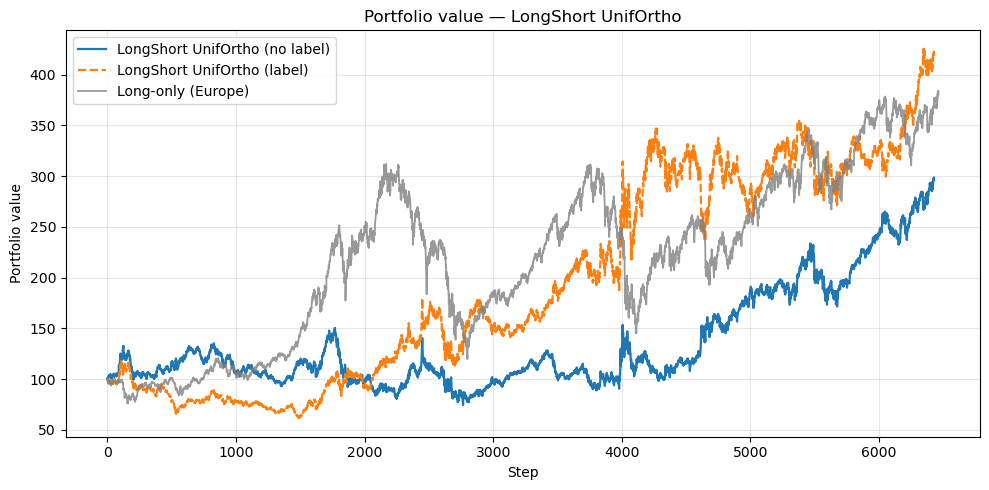

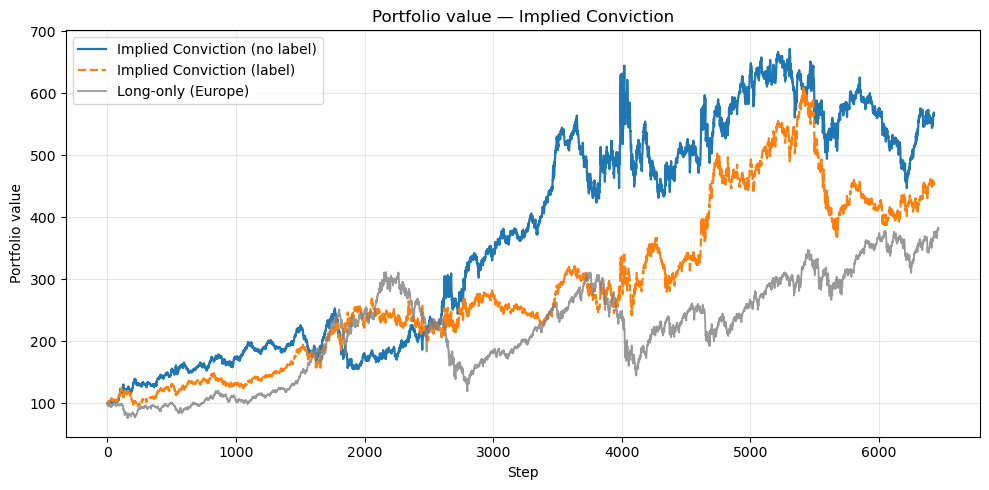

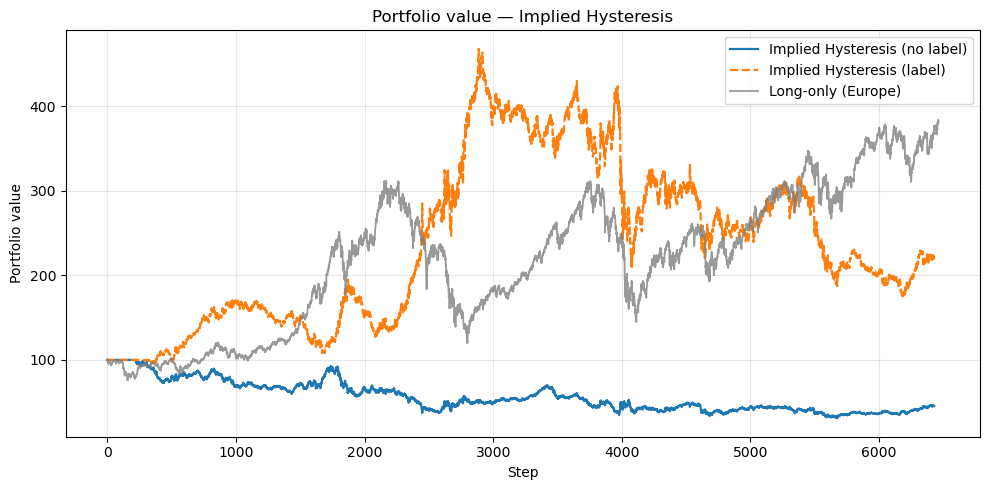

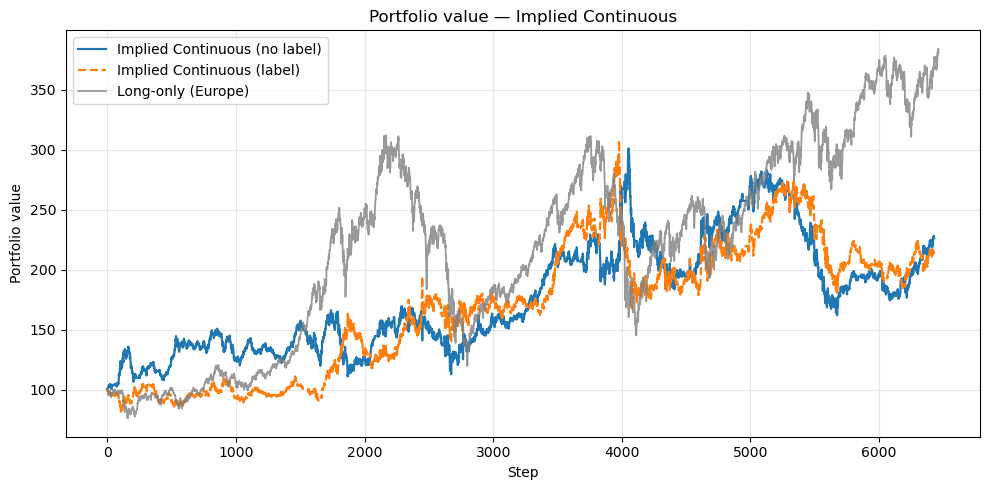

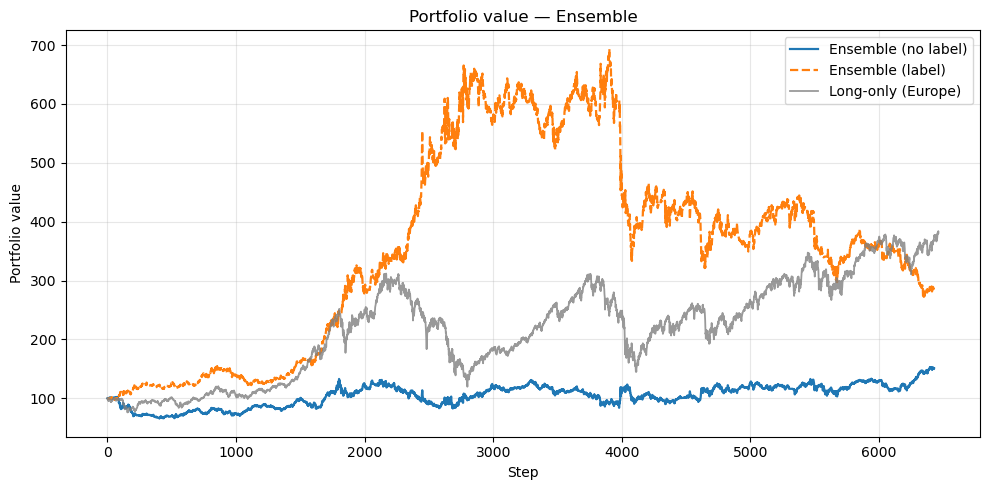

In [ ]:
# 1. Long-Short UnifOrtho
plot_strategy("LongShort UnifOrtho",
              portfolio_value_unif, portfolio_value_unif_label, portfolio_value_long_europe, _window_size, S_trade)

# 2. Implied Conviction
plot_strategy("Implied Conviction",
              portfolio_value_unif_implied_conviction, portfolio_value_unif_implied_conviction_label, portfolio_value_long_europe, _window_size, S_trade)

# 3. Implied Hysteresis
plot_strategy("Implied Hysteresis",
              portfolio_value_unif_implied_hysteresis, portfolio_value_unif_implied_hysteresis_label, portfolio_value_long_europe, _window_size, S_trade)

# 4. Implied Continuous
plot_strategy("Implied Continuous",
              portfolio_value_unif_implied_continuous, portfolio_value_unif_implied_continuous_label, portfolio_value_long_europe, _window_size, S_trade)

# 5. Ensemble
plot_strategy("Ensemble",
              portfolio_value_eq_wg, portfolio_value_eq_wg_label, portfolio_value_long_europe, _window_size, S_trade)

#### (B) Trading Strategy American Labelling Asian Index (Lagged)

In [73]:
S_trade = df_asia
S_label = df_label_america

print(S_trade.shape)
print(S_label.shape)

(6468, 3)
(6468, 3)


In [ ]:
print("-----------------------LONG-SHORT SWKMEANS -------------------------")
portfolio_value_unif_label, trade_signals_label, cum_pnl_label = tr.long_strat_unifortho_label_data(initial_capital=initial_capital, N_S=N_S, S_label=S_label, S_trade=S_trade, L=L, h1=h1, h2=h2, window_size=_window_size, majority_lookback=_majority_lookback, half_life = _half_life)
portfolio_value_unif, trade_signals, cum_pnl = tr.long_strat_unifortho(initial_capital=initial_capital, N_S=N_S, S=S_trade, L=L, h1=h1, h2=h2, window_size=_window_size, majority_lookback=_majority_lookback, half_life=_half_life)
mt.report_metrics("LongShort UnifOrtho (label)", portfolio_value=portfolio_value_unif_label, trade_signals=trade_signals_label, window_size=_window_size, cum_pnl=cum_pnl_label, n_years=n_years)
mt.report_metrics("LongShort UnifOrtho",         portfolio_value=portfolio_value_unif,       trade_signals=trade_signals,       window_size=_window_size, cum_pnl=cum_pnl, n_years=n_years)


print("---------- IMPLIED PROBABILITY TRADING STRATEGY (CONVICTION) ---------")
_signal_type = "conviction"
portfolio_value_unif_implied_conviction_label, trade_signals_implied_conviction_label, cum_pnl_implied_conviction_label, switch_proba_history_conviction_label = tr.long_strat_implied_label_data(initial_capital=initial_capital, N_S=N_S, S_label=S_label, S_trade=S_trade, L=L, h1=h1, h2=h2, window_size=_window_size, metric="CVaR", signal_type=_signal_type,majority_lookback=_majority_lookback, entry_threshold=_entry_threshold, hold_threshold=_hold_threshold, lookback=_lookback, use_gradient=_use_gradient, gradient_weight=_grad_weight, half_life=_half_life)
portfolio_value_unif_implied_conviction, trade_signals_implied_conviction, cum_pnl_implied_conviction, switch_proba_history_conviction = tr.long_strat_implied(initial_capital, N_S, S_trade, L, h1, h2, _window_size, signal_type=_signal_type, majority_lookback=_majority_lookback, half_life=_half_life, entry_threshold=_entry_threshold, hold_threshold=_hold_threshold, lookback=_lookback, gradient_weight=_grad_weight, use_gradient=_use_gradient, tau=_tau, tau_gradient=_tau_gradient)
mt.report_metrics("Implied Conviction (label)", portfolio_value=portfolio_value_unif_implied_conviction_label, trade_signals=trade_signals_implied_conviction_label, window_size=_window_size, cum_pnl=cum_pnl_implied_conviction_label, n_years=n_years)
mt.report_metrics("Implied Conviction",         portfolio_value=portfolio_value_unif_implied_conviction,       trade_signals = trade_signals_implied_conviction,       window_size=_window_size, cum_pnl=cum_pnl_implied_conviction, n_years=n_years)


print("---------- IMPLIED PROBABILITY TRADING STRATEGY (HYSTERESIS) --------")
_signal_type = "hysteresis"
portfolio_value_unif_implied_hysteresis_label, trade_signals_implied_hysteresis_label, cum_pnl_implied_hysteresis_label, switch_proba_history_hysteresis_label = tr.long_strat_implied_label_data(initial_capital=initial_capital, N_S=N_S, S_label=S_label, S_trade=S_trade, L=L, h1=h1, h2=h2, window_size=_window_size, signal_type=_signal_type,majority_lookback=_majority_lookback, entry_threshold=_entry_threshold, hold_threshold=_hold_threshold, lookback=_lookback, use_gradient=_use_gradient, gradient_weight=_grad_weight, half_life=_half_life)
portfolio_value_unif_implied_hysteresis, trade_signals_implied_hysteresis, cum_pnl_implied_hysteresis, switch_proba_history_hysteresis = tr.long_strat_implied(initial_capital, N_S, S_trade, L, h1, h2, _window_size, signal_type=_signal_type, majority_lookback=_majority_lookback, half_life=_half_life, entry_threshold=_entry_threshold, hold_threshold=_hold_threshold, lookback=_lookback, gradient_weight=_grad_weight, use_gradient=_use_gradient, tau=_tau, tau_gradient=_tau_gradient)
mt.report_metrics("Implied Hysteresis (label)", portfolio_value =portfolio_value_unif_implied_hysteresis_label, trade_signals=trade_signals_implied_hysteresis_label, window_size=_window_size, cum_pnl=cum_pnl_implied_hysteresis_label, n_years=n_years)
mt.report_metrics("Implied Hysteresis",         portfolio_value=portfolio_value_unif_implied_hysteresis,       trade_signals=trade_signals_implied_hysteresis,       window_size=_window_size, cum_pnl=cum_pnl_implied_hysteresis, n_years=n_years)


print("---------- IMPLIED PROBABILITY TRADING STRATEGY (CONTINUOUS) --------")
_signal_type = "continuous"
portfolio_value_unif_implied_continuous_label, trade_signals_implied_continuous_label, cum_pnl_implied_continuous_label, switch_proba_history_continuous_label = tr.long_strat_implied_label_data(initial_capital=initial_capital, N_S=N_S, S_label=S_label, S_trade=S_trade, L=L, h1=h1, h2=h2, window_size=_window_size, signal_type=_signal_type,majority_lookback=_majority_lookback, entry_threshold=_entry_threshold, hold_threshold=_hold_threshold, lookback=_lookback, use_gradient=_use_gradient, gradient_weight=_grad_weight, half_life=_half_life)
portfolio_value_unif_implied_continuous, trade_signals_implied_continuous, cum_pnl_implied_continuous, switch_proba_history_continuous = tr.long_strat_implied(initial_capital, N_S, S_trade, L, h1, h2, _window_size, signal_type=_signal_type, majority_lookback=_majority_lookback, half_life=_half_life, entry_threshold=_entry_threshold, hold_threshold=_hold_threshold, lookback=_lookback, gradient_weight=_grad_weight, use_gradient=_use_gradient, tau=_tau, tau_gradient=_tau_gradient)
mt.report_metrics("Implied Continuous (label)", portfolio_value=portfolio_value_unif_implied_continuous_label, trade_signals=trade_signals_implied_continuous_label, window_size=_window_size, cum_pnl=cum_pnl_implied_continuous_label, n_years=n_years)
mt.report_metrics("Implied Continuous",         portfolio_value=portfolio_value_unif_implied_continuous,       trade_signals=trade_signals_implied_continuous,       window_size=_window_size, cum_pnl=cum_pnl_implied_continuous, n_years=n_years)

print("---------- ENSEMBLE STRATEGY (EQUAL WEIGHTS) --------")
_ensemble_weights = [0.25, 0.25, 0.25, 0.25]
portfolio_value_eq_wg_label, trade_signals_ensemble_eq_wg_label, cum_pnl_ensemble_eq_wg_label, signal_details_ensemble_eq_wg_label = tr.ensemble_strategy_label_data(initial_capital=initial_capital, N_S=N_S, S_label=S_label, S_trade=S_trade, L=L, h1=h1, h2=h2, window_size=_window_size, K=2, metric="CVaR", ensemble_weights=_ensemble_weights, lookback=_lookback, use_gradient=_use_gradient, gradient_weight=_grad_weight, entry_threshold=_entry_threshold, hold_threshold=_hold_threshold, majority_lookback=_majority_lookback, half_life=_half_life)
portfolio_value_eq_wg, trade_signals_ensemble_eq_wg, cum_pnl_ensemble_eq_wg, signal_details_ensemble_eq_wg = tr.ensemble_strategy(initial_capital, N_S, S_trade, L, h1, h2, _window_size, majority_lookback=_majority_lookback, ensemble_weights=_ensemble_weights, lookback=_lookback, use_gradient=_use_gradient, gradient_weight=_grad_weight, entry_threshold=_entry_threshold, hold_threshold=_hold_threshold, tau=_tau, tau_gradient=_tau_gradient, half_life=_half_life)
mt.report_metrics("Ensemble (label)", portfolio_value=portfolio_value_eq_wg_label, trade_signals=trade_signals_ensemble_eq_wg_label, window_size=_window_size, cum_pnl=cum_pnl_ensemble_eq_wg_label, n_years=n_years)
mt.report_metrics("Ensemble",        portfolio_value = portfolio_value_eq_wg,       trade_signals = trade_signals_ensemble_eq_wg,       window_size=_window_size, cum_pnl=cum_pnl_ensemble_eq_wg, n_years=n_years)


print("---------- LONG STRATEGY --------")
portfolio_value_long_asia, cum_pnl_long_asia, final_value_long_asia = tr.long_only(S_trade, initial_capital=initial_capital, weighting="inverse_vol", window_size=_window_size)
mt.report_metrics("Long only (Asia)", portfolio_value=portfolio_value_long_europe, window_size=_window_size, cum_pnl=cum_pnl_long_europe, n_years=n_years)

-----------------------LONG-SHORT SWKMEANS -------------------------
------[LongShort UnifOrtho (label)]------
hit ratio: 0.5123 | win/loss: 0.5070 | final value: 514.16
Cummulative pnl: 414.1586 | Annualized Sharpe Ratio: 0.4216 | Annual return: 0.0561
------[LongShort UnifOrtho]------
hit ratio: 0.5126 | win/loss: 0.4995 | final value: 231.53
Cummulative pnl: 131.5265 | Annualized Sharpe Ratio: 0.2646 | Annual return: 0.0284
---------- IMPLIED PROBABILITY TRADING STRATEGY (CONVICTION) ---------
------[Implied Conviction (label)]------
hit ratio: 0.5092 | win/loss: 0.4866 | final value: 41.18
Cummulative pnl: -58.8209 | Annualized Sharpe Ratio: -0.0927 | Annual return: -0.0291
------[Implied Conviction]------
hit ratio: 0.5154 | win/loss: 0.4987 | final value: 276.76
Cummulative pnl: 176.7629 | Annualized Sharpe Ratio: 0.3064 | Annual return: 0.0345
---------- IMPLIED PROBABILITY TRADING STRATEGY (HYSTERESIS) --------
------[Implied Hysteresis (label)]------
hit ratio: 0.5164 | win/lo

/Users/oscarpeyron/Downloads/003_ETUDE_POST_BAC/MASTER_UCL_COMP_FINANCE/T3/ADIA/src/metrics.py:472:FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/Users/oscarpeyron/Downloads/003_ETUDE_POST_BAC/MASTER_UCL_COMP_FINANCE/T3/ADIA/src/metrics.py:488:FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
/Users/oscarpeyron/Downloads/003_ETUDE_POST_BAC/MASTER_UCL_COMP_FINANCE/T3/ADIA/src/metrics.py:489:FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


              KOSPI  Nikkei225  HangSeng
Date                                    
1990-01-04   928.82   38712.88   2867.95
1990-01-05   915.11   38274.76   2839.94
1990-01-08   919.46   38294.96   2816.24
1990-01-09   920.21   37951.46   2822.16
1990-01-10   911.48   37696.51   2868.00
...             ...        ...       ...
2019-12-19  2196.56   23864.85  27800.49
2019-12-20  2204.18   23816.63  27871.35
2019-12-23  2203.71   23821.11  27906.41
2019-12-27  2204.21   23837.72  28225.42
2019-12-30  2197.67   23656.62  28319.39

[6468 rows x 3 columns]


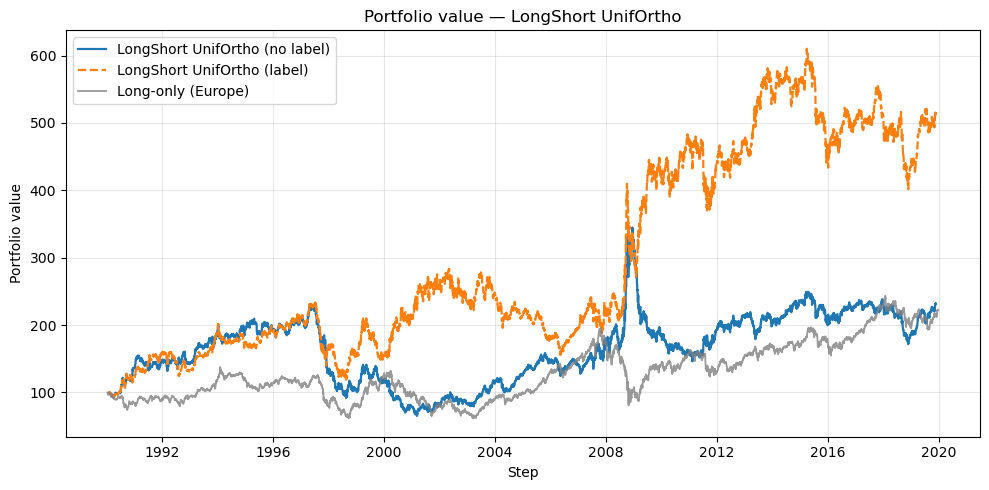

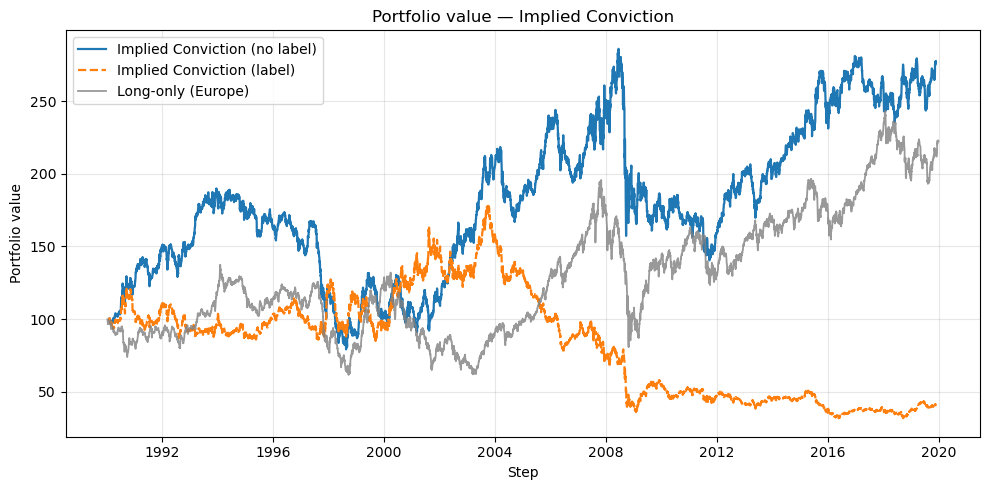

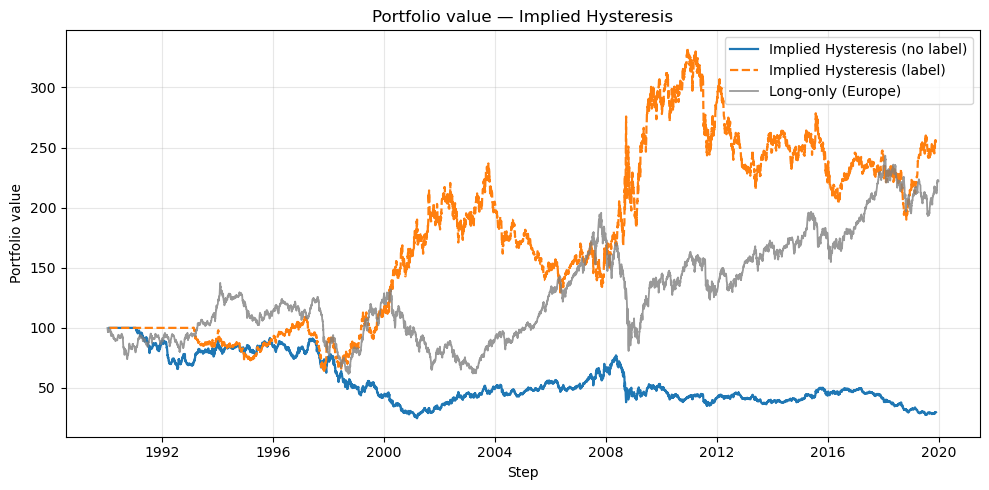

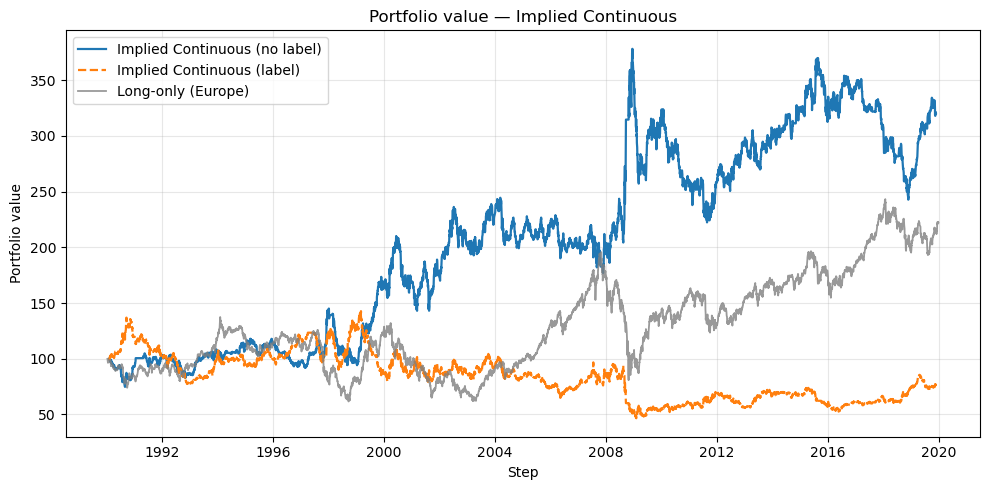

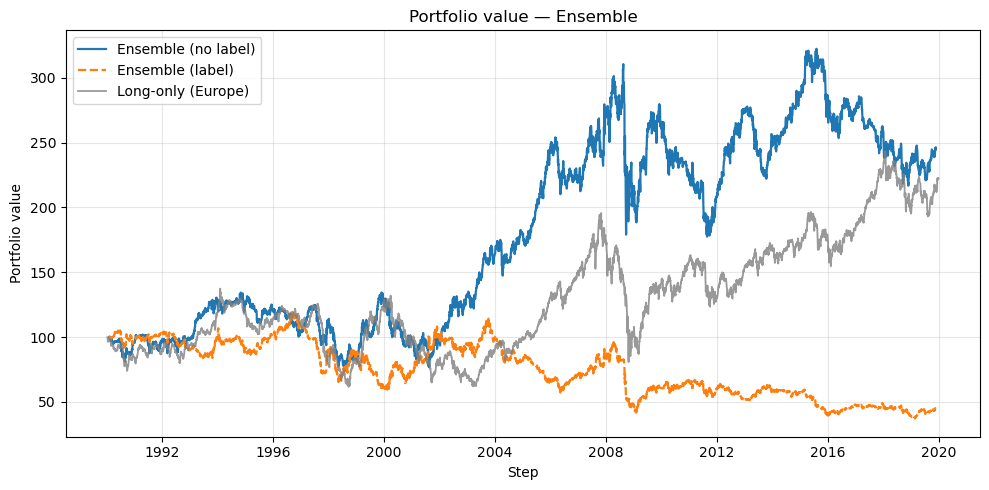

In [88]:

# 1. Long-Short UnifOrtho

print(S_trade)
plot_strategy("LongShort UnifOrtho",
              portfolio_value_unif, portfolio_value_unif_label, portfolio_value_long_europe, _window_size, S_trade)

# 2. Implied Conviction
plot_strategy("Implied Conviction",
              portfolio_value_unif_implied_conviction, portfolio_value_unif_implied_conviction_label, portfolio_value_long_europe, _window_size, S_trade)

# 3. Implied Hysteresis
plot_strategy("Implied Hysteresis",
              portfolio_value_unif_implied_hysteresis, portfolio_value_unif_implied_hysteresis_label, portfolio_value_long_europe, _window_size, S_trade)

# 4. Implied Continuous
plot_strategy("Implied Continuous",
              portfolio_value_unif_implied_continuous, portfolio_value_unif_implied_continuous_label, portfolio_value_long_europe, _window_size, S_trade)

# 5. Ensemble
plot_strategy("Ensemble",
              portfolio_value_eq_wg, portfolio_value_eq_wg_label, portfolio_value_long_europe, _window_size, S_trade)

# (3) Interpretability of Sliced Wasserstein K-Means Algorithm 

## (3.1) Data from Refinitiv and FRED (NOT TO BE USED IF NO REFINITIV LICENSE)

In [4]:
importlib.reload(macro)

START_DATE = "2006-01-01"
END_DATE   = "2019-12-31"
FRED_API_KEY = "0d472975ba8d0e5ee549648673b1e3de"

OUTPUT_DIR = "data/macro"
os.makedirs(OUTPUT_DIR, exist_ok=True)

# FRED series: code -> (friendly_name, frequency)
# "D" = daily (needs resampling), "M" = monthly (needs resampling)
FRED_SERIES = {
    "VIXCLS":   ("VIX",            "D"),
    "DGS5":     ("US_Treasury_5Y", "D"),
    "DGS10":    ("US_Treasury_10Y","D"),
    "DGS30":    ("US_Treasury_30Y","D"),
    "FEDFUNDS": ("Fed_Funds_Rate", "M"),
    #"NAPM":   ("ISM PMI Composite Index", "M"),  # proxy for ISM PMI
    "MANEMP": ("Manufacturing_Employment", "M"),
    # 3-month Eurodollar deposit rate (≈ LIBOR)
    #"USD3MTD156N": ("USD_3M_LIBOR", "D"),
}


# Refinitiv instruments (uncomment the ones you have access to)
REFINITIV_INSTRUMENTS = {
    ".DXY": (
        "DXY_Dollar_Index",
        ["OPEN_PRC", "HIGH_1", "LOW_1", "TRDPRC_1"],
        {"OPEN_PRC": "OPEN", "HIGH_1": "HIGH", "LOW_1": "LOW", "TRDPRC_1": "CLOSE"},
    ),
    "XAU=": (
        "Gold_Spot",
        ["MID_OPEN", "MID_HIGH", "MID_LOW", "MID_PRICE"],
        {"MID_OPEN": "OPEN", "MID_HIGH": "HIGH", "MID_LOW": "LOW", "MID_PRICE": "CLOSE"},
    ),
    "LCOc1": (
        "Brent_Crude_Oil",
        ["OPEN_PRC", "HIGH_1", "LOW_1", "TRDPRC_1"],
        {"OPEN_PRC": "OPEN", "HIGH_1": "HIGH", "LOW_1": "LOW", "TRDPRC_1": "CLOSE"},
    ),
}


In [5]:
fred_weekly = macro.download_fred_data(FRED_API_KEY, FRED_SERIES, START_DATE, END_DATE)
refinitiv_raw = macro.download_refinitiv_data(REFINITIV_INSTRUMENTS, START_DATE, END_DATE, OUTPUT_DIR)
refinitiv_weekly = macro.resample_refinitiv_to_weekly(refinitiv_raw)
combined = macro.build_combined_weekly(fred_weekly, refinitiv_weekly)


out_path = os.path.join(OUTPUT_DIR, "combined_macro_weekly.csv")
combined.to_csv(out_path)
print(f"\n  Saved to: {out_path}")
print(f"  Shape: {combined.shape}")
print(f"  Date range: {combined.index[0].date()} to {combined.index[-1].date()}")
print(f"\n  Columns: {list(combined.columns)}")
print("\n  Head:")
print(combined.head().to_string())
print("\n  Tail:")
print(combined.tail().to_string())


    -> 731 weekly observations saved.
    -> 731 weekly observations saved.
    -> 731 weekly observations saved.
    -> 731 weekly observations saved.
    -> 727 weekly observations saved.
    -> 727 weekly observations saved.

[Weekly] Downloading DXY_Dollar_Index (.DXY) ...
  2006: 53 rows
  2007: 53 rows
  2008: 53 rows
  2009: 53 rows
  2010: 52 rows
  2011: 53 rows
  2012: 53 rows
  2013: 53 rows
  2014: 53 rows
  2015: 53 rows
  2016: 53 rows
  2017: 53 rows
  2018: 53 rows
  2019: 53 rows
  -> Saved data/macro/DXY_Dollar_Index_weekly_2006_2020.csv (731 rows)

[Weekly] Downloading Gold_Spot (XAU=) ...
  2006: 53 rows
  2007: 53 rows
  2008: 53 rows
  2009: 53 rows
  2010: 52 rows
  2011: 53 rows
  2012: 53 rows
  2013: 53 rows
  2014: 53 rows
  2015: 53 rows
  2016: 53 rows
  2017: 53 rows
  2018: 53 rows
  2019: 53 rows
  -> Saved data/macro/Gold_Spot_weekly_2006_2020.csv (731 rows)

[Weekly] Downloading Brent_Crude_Oil (LCOc1) ...
  2006: 53 rows
  2007: 53 rows
  2008: 53 row

### Extract PMI data from Refinitiv 

In [7]:
 
import pandas as pd

# === 1. Read the "First Release Data" sheet ===
FILE_PATH = "data/PMI_data.xlsx"
 
df = pd.read_excel(FILE_PATH, sheet_name="First Release Data", header=None)
 
# === 2. Extract Period (col 0) and Actual First Release (col 2), skip header rows ===
df = df.iloc[4:].reset_index(drop=True)  # data starts at row 4
df.columns = ["Period", "Release_Date", "PMI"]
 
# === 3. Parse Period ("Mar 2026") into datetime and PMI into float ===
df["Date"] = pd.to_datetime(df["Period"], format="%b %Y")
df["PMI"] = pd.to_numeric(df["PMI"], errors="coerce")
 
# === 4. Drop rows with no PMI value and sort chronologically ===
df = df.dropna(subset=["PMI"])
df = df.sort_values("Date").reset_index(drop=True)
 
# === 5. Filter to Jan 2006 – Dec 2019 ===
mask = (df["Date"] >= "2006-01-01") & (df["Date"] <= "2019-12-31")
df = df.loc[mask]
 
# === 6. Build a clean pandas Series ===
pmi_series = pd.Series(df["PMI"].values, index=df["Date"], name="ISM_Manufacturing_PMI")
 
pmi_weekly = pmi_series.resample("W-FRI").ffill()

#forward fill until 2019-12-31
pmi_weekly = pmi_weekly.ffill().loc[:'2019-12-31']

In [8]:
combined = macro.build_combined_weekly(fred_weekly, refinitiv_weekly)
combined = pd.concat([combined, pmi_weekly.rename("ISM_Manufacturing_PMI")], axis=1)
combined = combined.ffill(limit=2).dropna()
combined.to_csv("data/macro/combined_macro_weekly.csv")


  Remaining NaNs after forward-fill (limit=2):
Fed_Funds_Rate              2
Manufacturing_Employment    2

  Rows: 731 -> 729 after dropna (2 removed)


## (3.1) DATA FROM FRED AND REFINITIV + EQUITIES DATA

In [3]:
START_DATE = "2006-01-01"
END_DATE   = "2019-12-31"
combined = pd.read_csv("data/macro/combined_macro_weekly.csv", index_col=0, parse_dates=True)


### Equities Data 

In [4]:
interval = "1d"

df_all_world = equity_loader.get_close_prices(start_date=START_DATE, end_date=END_DATE, regions=['america'], interval=interval)
df_all_world.dropna(inplace=True)



In [5]:
df_all_world_weekly = df_all_world.resample('W-FRI').last().loc['2006-01-06':'2019-12-20']
df_all_world_weekly.dropna(inplace=True)

In [6]:
print(df_all_world_weekly.shape)

(729, 3)


### Regime Detection Labelling using SWK-Means on weekly data from 2006-01-06 to 2019-12-20 

In [7]:
# dimension is 9*T

L = 25
h2 = 3
h1 = 7
N_S = 100 #simulations
projection_emp_dist, centroids, labels = ws.max_mccd_unifortho_sim(N_S=N_S, S=df_all_world_weekly, K=2, L=L, epsilon=1e-6, h1=h1, h2=h2, metric="CVaR")


In [8]:
N = df_all_world_weekly.shape[0]
regime_pred = mt.convert_prediction(N, labels, h1, h2)



In [9]:
df_all_world_pred = pd.concat([df_all_world_weekly, pd.Series(regime_pred.flatten(), index=df_all_world_weekly.index, name="Regime")], axis=1)

print(df_all_world_pred.head(30))

                  SP500      DowJones       Nasdaq  Regime
Date                                                      
2006-01-06  1285.449951  10959.309570  2305.620117     1.0
2006-01-13  1287.609985  10959.870117  2317.040039     1.0
2006-01-20  1261.489990  10667.389648  2247.699951     1.0
2006-01-27  1283.719971  10907.209961  2304.229980     1.0
2006-02-03  1264.030029  10793.620117  2262.580078     1.0
2006-02-10  1266.989990  10919.049805  2261.879883     1.0
2006-02-17  1287.239990  11115.320312  2282.360107     1.0
2006-02-24  1289.430054  11061.849609  2287.040039     1.0
2006-03-03  1287.229980  11021.589844  2302.600098     1.0
2006-03-10  1281.420044  11076.339844  2262.040039     1.0
2006-03-17  1307.250000  11279.650391  2306.479980     1.0
2006-03-24  1302.949951  11279.969727  2312.820068     1.0
2006-03-31  1294.869995  11109.320312  2339.790039     1.0
2006-04-07  1295.500000  11120.040039  2339.020020     1.0
2006-04-14  1289.119995  11137.650391  2326.110107     1

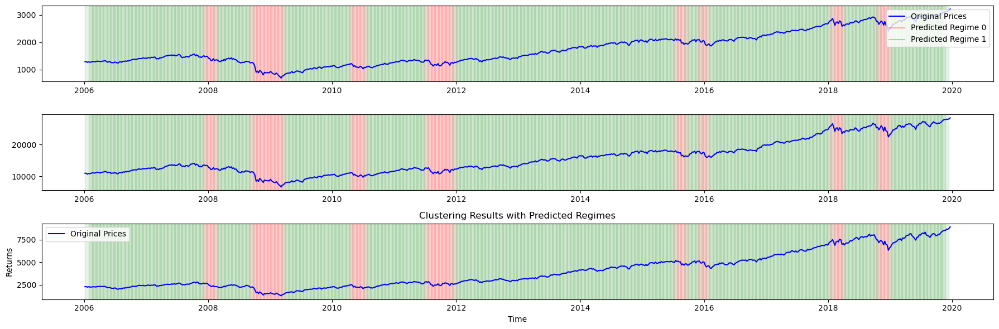

In [27]:
mt.visualize_clustering_results(df_all_world_weekly.index, df_all_world_weekly, labels, h1, h2, K=2, returns=False)

#### Construct Probabilistic Target for OLS 

In [10]:
lookback = 6

proba_matrix, switch_proba, transition_matrix, posterior = ws.compute_implied_proba(projection_emp_dist, centroids, labels, tau = None, lookback=lookback, use_gradient=False)


In [11]:
regime_proba = mt.convert_prediction_proba(N, proba_matrix, h1, h2)

bear_proba = pd.Series(regime_proba[:, 0], index=df_all_world_weekly.index, name="Bear_Prob")

## (3.2) SHAP Analysis 

In [17]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_curve, roc_auc_score, RocCurveDisplay
import shap
import matplotlib.pyplot as plt

# --- Assume df_all_world_pred already has "Regime" column (0 or 1) ---
# --- Assume combined DataFrame has macro features + Regime ---
# Adjust these column names to match your actual DataFrame:

feature_cols = ['VIX', 'US_Treasury_5Y', 'US_Treasury_10Y', 'US_Treasury_30Y',
       'Fed_Funds_Rate', 'Manufacturing_Employment', 'DXY_Dollar_Index',
       'Gold_Spot', 'Brent_Crude_Oil', 'ISM_Manufacturing_PMI']
# ^^^ Replace with your actual column names ^^^

# Build X and y
X = combined[feature_cols].copy()  # or df_all_world_pred[feature_cols]
X = X.astype(np.float64)
X.dropna(inplace=True)

# Align regime labels
Y_regime = df_all_world_pred["Regime"].loc[X.index]
Y_proba = bear_proba.loc[X.index]  # Use the probability of being in the "bear" regime as a continuous target


# 1 == bear and 0 == bull now 
y_binary = (Y_regime == 0).astype(int)  #

# Probabilistic target for OLS — use regime label as-is (or a probability if you have one)
y_ols = Y_proba.astype(float)


In [18]:
print(f"Samples: {len(X)}, Features: {X.shape[1]}")
print(f"Bear regime count: {y_binary.sum()} / {y_binary.count()}")

Samples: 729, Features: 10
Bear regime count: 110 / 729


In [19]:
bear_mask = (y_binary == 1)
print(X[bear_mask].shape)

(110, 10)


#### Look at what features are correlated 

In [20]:
X.corr()

,VIX,US_Treasury_5Y,US_Treasury_10Y,US_Treasury_30Y,Fed_Funds_Rate,Manufacturing_Employment,DXY_Dollar_Index,Gold_Spot,Brent_Crude_Oil,ISM_Manufacturing_PMI
VIX,1.000000,-0.080055,0.073948,0.146394,-0.180324,-0.107161,-0.290445,-0.124633,-0.027489,-0.609214
US_Treasury_5Y,-0.080055,1.000000,0.930209,0.747259,0.898913,0.821541,-0.090657,-0.853664,-0.190151,0.084647
US_Treasury_10Y,0.073948,0.930209,1.000000,0.934392,0.748874,0.645305,-0.384143,-0.819738,0.025995,0.056262
US_Treasury_30Y,0.146394,0.747259,0.934392,1.000000,0.536276,0.407981,-0.621184,-0.665795,0.243252,0.045487
Fed_Funds_Rate,-0.180324,0.898913,0.748874,0.536276,1.000000,0.924429,0.008480,-0.705995,-0.189999,0.018869
Manufacturing_Employment,-0.107161,0.821541,0.645305,0.407981,0.924429,1.000000,0.092798,-0.742661,-0.223458,-0.158154
DXY_Dollar_Index,-0.290445,-0.090657,-0.384143,-0.621184,0.008480,0.092798,1.000000,0.031129,-0.753740,0.084686
Gold_Spot,-0.124633,-0.853664,-0.819738,-0.665795,-0.705995,-0.742661,0.031129,1.000000,0.390916,0.208923
Brent_Crude_Oil,-0.027489,-0.190151,0.025995,0.243252,-0.189999,-0.223458,-0.753740,0.390916,1.000000,0.163333
ISM_Manufacturing_PMI,-0.609214,0.084647,0.056262,0.045487,0.018869,-0.158154,0.084686,0.208923,0.163333,1.000000


### (3.2.1) OLS Linreg (probabilistic Target)

                            OLS Regression Results                            
Dep. Variable:              Bear_Prob   R-squared:                       0.423
Model:                            OLS   Adj. R-squared:                  0.415
Method:                 Least Squares   F-statistic:                     52.66
Date:                Tue, 12 May 2026   Prob (F-statistic):           3.92e-79
Time:                        12:39:40   Log-Likelihood:                 332.63
No. Observations:                 729   AIC:                            -643.3
Df Residuals:                     718   BIC:                            -592.7
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                   

  0%|          | 0/729 [00:00<?, ?it/s]


===== OLS — Global SHAP Summary =====


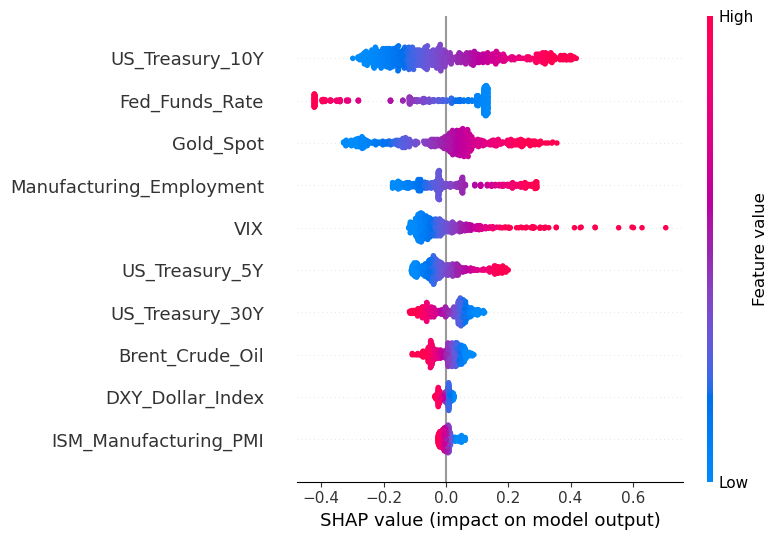

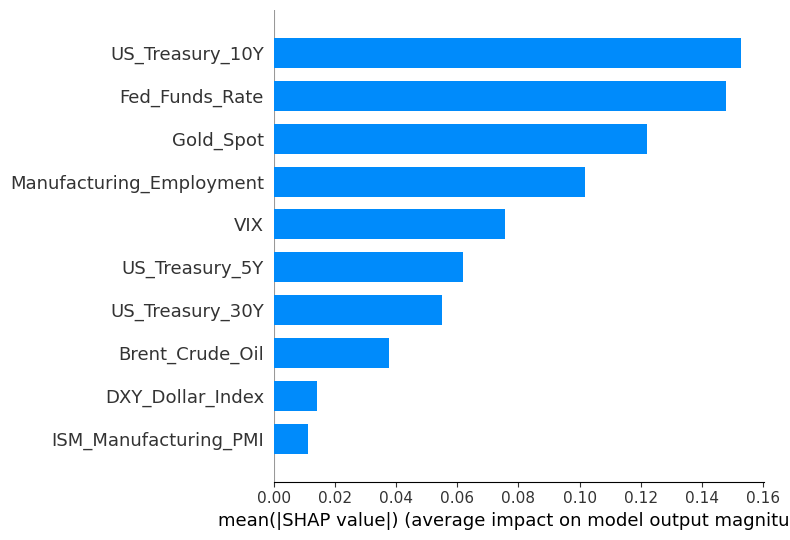

  0%|          | 0/108 [00:00<?, ?it/s]


===== OLS — Local SHAP (Bear periods, n=108) =====


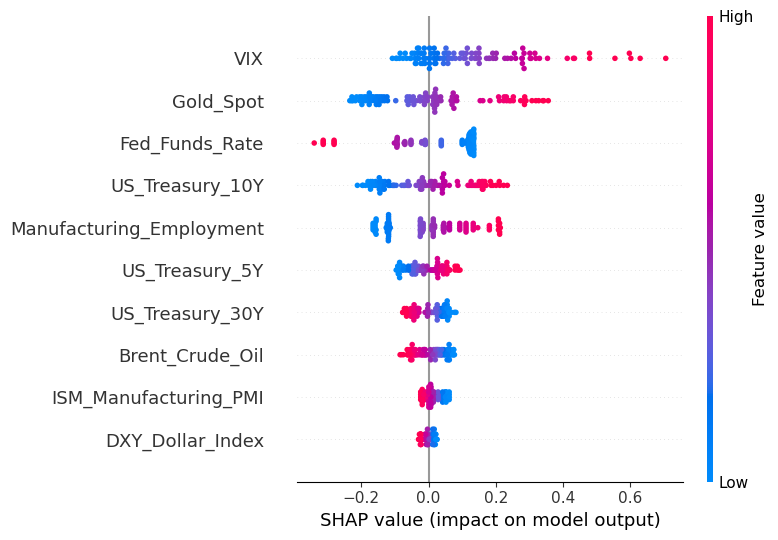

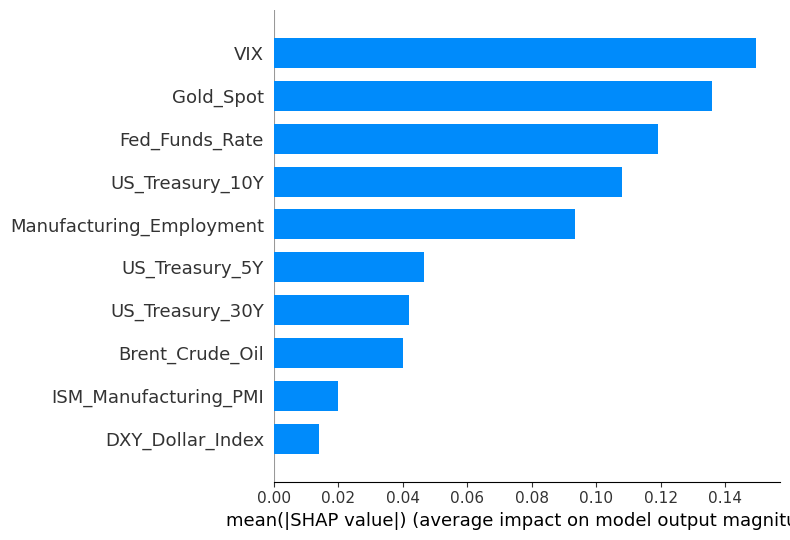


Bear regime dates:
[Timestamp('2007-11-30 00:00:00'), Timestamp('2007-12-07 00:00:00'), Timestamp('2007-12-14 00:00:00'), Timestamp('2007-12-21 00:00:00'), Timestamp('2007-12-28 00:00:00'), Timestamp('2008-01-04 00:00:00'), Timestamp('2008-01-11 00:00:00'), Timestamp('2008-01-18 00:00:00'), Timestamp('2008-01-25 00:00:00'), Timestamp('2008-05-16 00:00:00'), Timestamp('2008-05-23 00:00:00'), Timestamp('2008-05-30 00:00:00'), Timestamp('2008-08-29 00:00:00'), Timestamp('2008-09-05 00:00:00'), Timestamp('2008-09-12 00:00:00'), Timestamp('2008-09-19 00:00:00'), Timestamp('2008-09-26 00:00:00'), Timestamp('2008-10-03 00:00:00'), Timestamp('2008-10-10 00:00:00'), Timestamp('2008-10-17 00:00:00'), Timestamp('2008-10-24 00:00:00'), Timestamp('2008-10-31 00:00:00'), Timestamp('2008-11-07 00:00:00'), Timestamp('2008-11-14 00:00:00'), Timestamp('2008-11-21 00:00:00'), Timestamp('2008-11-28 00:00:00'), Timestamp('2008-12-05 00:00:00'), Timestamp('2008-12-12 00:00:00'), Timestamp('2008-12-19 00:00

In [21]:
# ========== OLS REGRESSION ==========
X_ols = sm.add_constant(X)  # adds intercept
ols_model = sm.OLS(y_ols, X_ols).fit()
print(ols_model.summary())

print("\nOLS Coefficients:")
print(ols_model.params)

# --- SHAP for OLS ---
def ols_predict(data):
    data_with_const = sm.add_constant(data, has_constant='add')
    return ols_model.predict(data_with_const)


background = shap.sample(X, 100, random_state=42)
ols_explainer = shap.KernelExplainer(ols_predict, background)

# ---- GLOBAL XAI: explain all training data ----
shap_values_ols = ols_explainer.shap_values(X)
print("\n===== OLS — Global SHAP Summary =====")
shap.summary_plot(shap_values_ols, X, feature_names=feature_cols, show=True)
shap.summary_plot(shap_values_ols, X, feature_names=feature_cols, plot_type="bar", show=True)

# ---- LOCAL XAI: bear regime periods only ----
# y_ols is P(Bear), so bear periods are when probability > 0.5
bear_mask = y_ols > 0.5
X_bear = X.loc[bear_mask]
shap_values_ols_bear = ols_explainer.shap_values(X_bear)

print(f"\n===== OLS — Local SHAP (Bear periods, n={bear_mask.sum()}) =====")
shap.summary_plot(shap_values_ols_bear, X_bear, feature_names=feature_cols, show=True)
shap.summary_plot(shap_values_ols_bear, X_bear, feature_names=feature_cols, plot_type="bar", show=True)

# Show bear regime dates
print("\nBear regime dates:")
print(X_bear.index.tolist())

#### ROC curve for understanding to understand the models strenght 

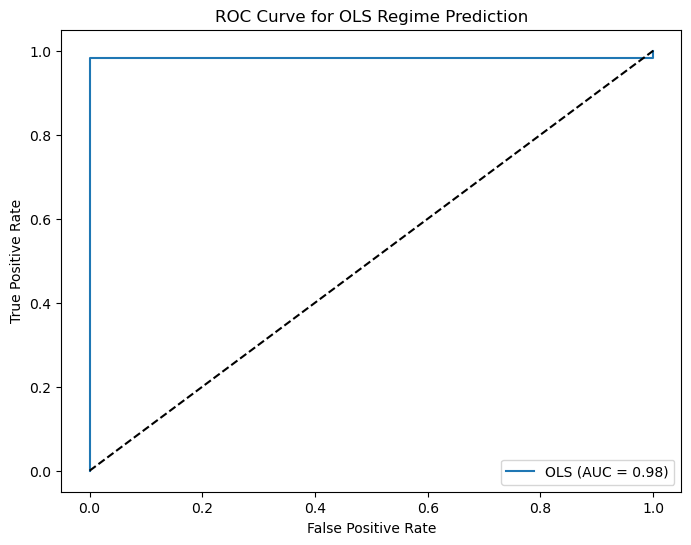

In [22]:
### ROC curve of OLS predictions
fpr, tpr, thresholds = roc_curve(y_binary, y_ols)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f"OLS (AUC = {roc_auc_score(y_binary, y_ols):.2f})")
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve for OLS Regime Prediction")
plt.legend()
plt.show()


### (3.2.2) Logistic Regresssion (Binary Target) 

Training balanced accuracy: 0.7018
Logistic Regression Coefficients:
  VIX                      : +1.7236
  US_Treasury_5Y           : +0.2790
  US_Treasury_10Y          : +1.4331
  US_Treasury_30Y          : -0.1268
  Fed_Funds_Rate           : -1.4360
  Manufacturing_Employment : +1.4023
  DXY_Dollar_Index         : +0.6582
  Gold_Spot                : +1.5211
  Brent_Crude_Oil          : +0.0108
  ISM_Manufacturing_PMI    : +0.0747
  Intercept: -2.1455

===== Logistic Regression — Global SHAP Summary =====


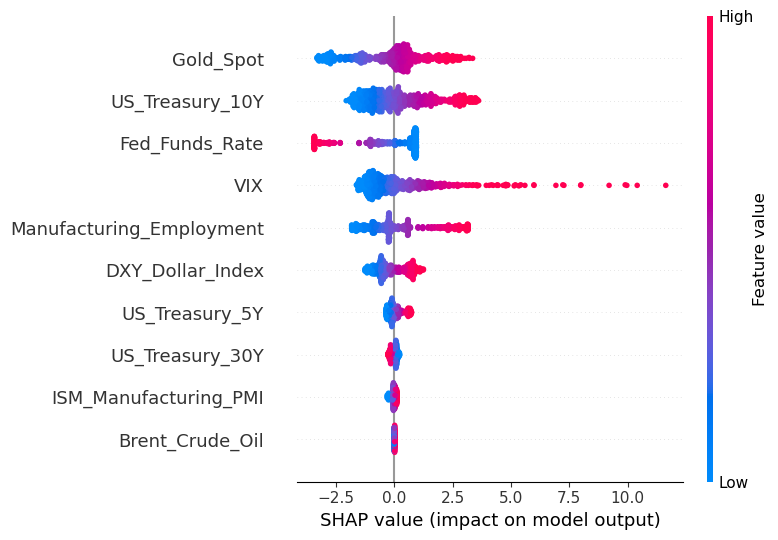

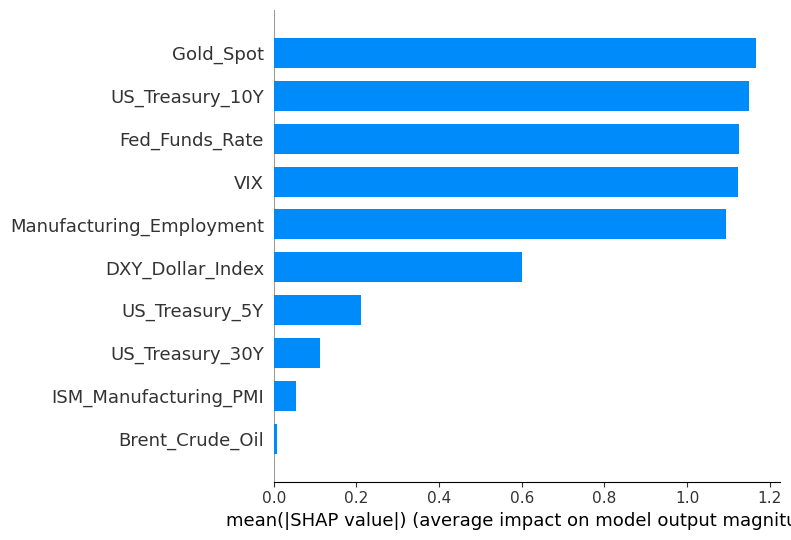


===== Logistic Regression — Local SHAP (Bear periods, n=110) =====


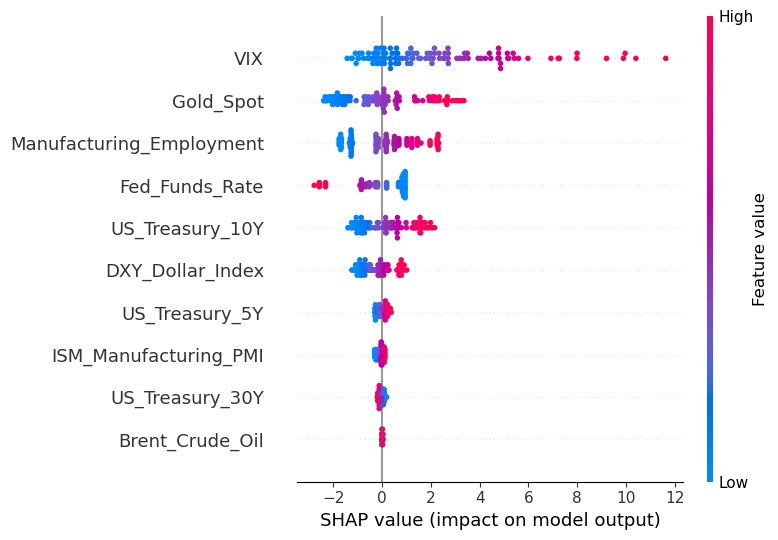

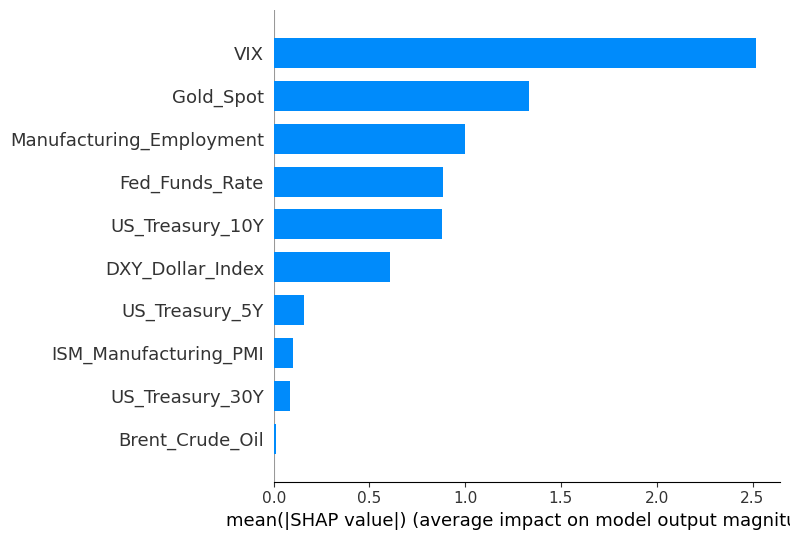

In [ ]:
# ========== LOGISTIC REGRESSION ==========
scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(X), index=X.index, columns=feature_cols)

log_model = LogisticRegression(max_iter=1000, random_state=42)
log_model.fit(X_scaled, y_binary)
y_train = log_model.predict(X_scaled)

print("Logistic Regression Coefficients:")
for feat, coef in zip(feature_cols, log_model.coef_[0]):
    print(f"  {feat:25s}: {coef:+.4f}")
print(f"  Intercept: {log_model.intercept_[0]:+.4f}")
print(f"Training balanced accuracy: {balanced_accuracy_score(y_binary, y_train):.4f}")

# --- SHAP for Logistic Regression ---
# LinearExplainer is exact and fast for linear models
log_explainer = shap.LinearExplainer(log_model, X_scaled)

# ---- GLOBAL XAI ----
shap_values_log = log_explainer.shap_values(X_scaled)

print("\n===== Logistic Regression — Global SHAP Summary =====")
shap.summary_plot(shap_values_log, X_scaled, feature_names=feature_cols, show=True)
shap.summary_plot(shap_values_log, X_scaled, feature_names=feature_cols, plot_type="bar", show=True)

# ---- LOCAL XAI: bear regime periods ----
bear_mask = (y_binary == 1)
X_bear_scaled = X_scaled.loc[bear_mask]
shap_values_log_bear = log_explainer.shap_values(X_bear_scaled)

print(f"\n===== Logistic Regression — Local SHAP (Bear periods, n={bear_mask.sum()}) =====")
shap.summary_plot(shap_values_log_bear, X_bear_scaled, feature_names=feature_cols, show=True)
shap.summary_plot(shap_values_log_bear, X_bear_scaled, feature_names=feature_cols, plot_type="bar", show=True)

### (3.2.3) Random Forest (Binary Target)

Training balanced accuracy: 1.0000
X shape: (729, 10)
Type of shap_values: <class 'numpy.ndarray'>
shap_values shape: (729, 10, 2)
shap_bear shape: (729, 10)
X shape: (729, 10)

===== Global SHAP — Bear Class =====


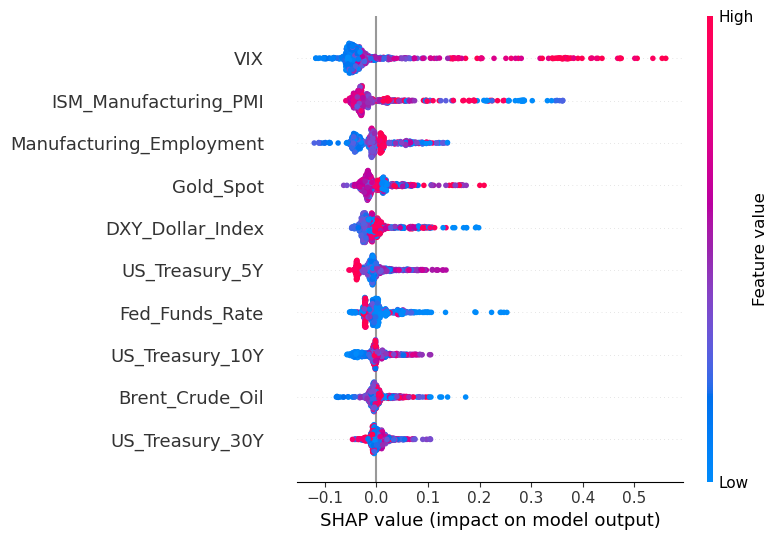

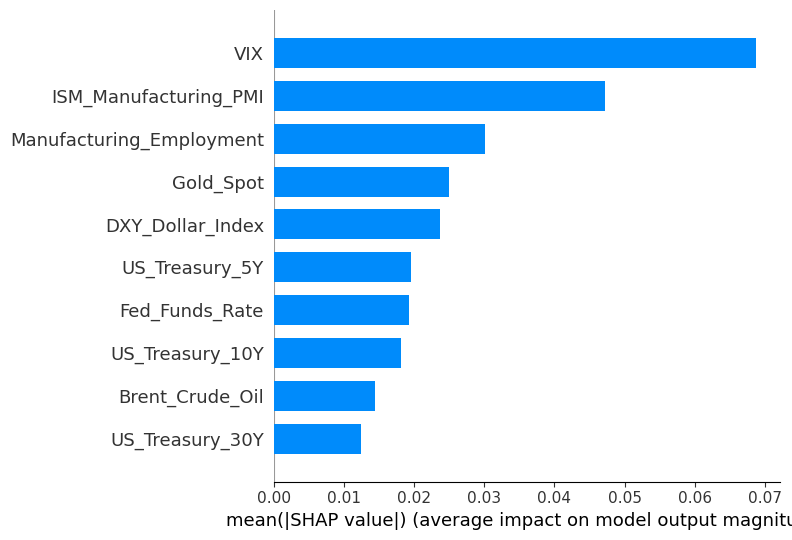


===== Local SHAP — Bear Periods (n=110) =====


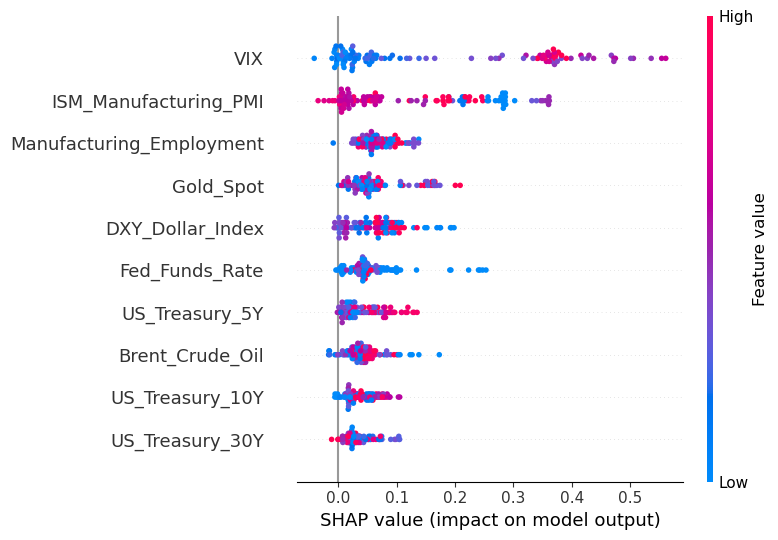

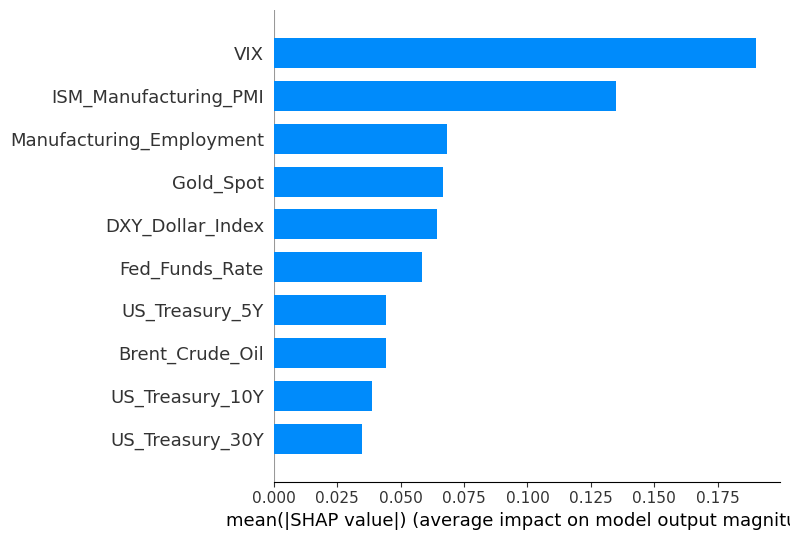

In [142]:
import shap
import numpy as np
from sklearn.ensemble import RandomForestClassifier

# ========== RANDOM FOREST CLASSIFIER ==========
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X, y_binary)

y_train_rf = rf_model.predict(X)
print(f"Training balanced accuracy: {balanced_accuracy_score(y_binary, y_train_rf):.4f}")

# ========== SHAP ANALYSIS ==========
rf_explainer = shap.TreeExplainer(rf_model)
shap_values = rf_explainer.shap_values(X)

# Debug: check what shap_values looks like
print(f"X shape: {X.shape}")
print(f"Type of shap_values: {type(shap_values)}")
if isinstance(shap_values, list):
    print(f"Number of classes: {len(shap_values)}")
    print(f"Shape per class: {shap_values[1].shape}")
    shap_bear = shap_values[1]  # class 1 = bear
elif isinstance(shap_values, np.ndarray):
    print(f"shap_values shape: {shap_values.shape}")
    # If 3D: (n_samples, n_features, n_classes)
    if shap_values.ndim == 3:
        shap_bear = shap_values[:, :, 1]  # class 1 = bear
    else:
        shap_bear = shap_values

print(f"shap_bear shape: {shap_bear.shape}")
print(f"X shape: {X.shape}")

# ---- GLOBAL: all observations ----
print("\n===== Global SHAP — Bear Class =====")
shap.summary_plot(shap_bear, X, feature_names=feature_cols, show=True)
shap.summary_plot(shap_bear, X, feature_names=feature_cols, plot_type="bar", show=True)

# ---- LOCAL: bear regime periods only ----
bear_mask = y_binary == 1
X_bear = X.loc[bear_mask]
shap_bear_local = shap_bear[bear_mask.values]

print(f"\n===== Local SHAP — Bear Periods (n={bear_mask.sum()}) =====")
shap.summary_plot(shap_bear_local, X_bear, feature_names=feature_cols, show=True)
shap.summary_plot(shap_bear_local, X_bear, feature_names=feature_cols, plot_type="bar", show=True)

### (3.2.3) Partial Least Squares on Probabilistic Target 

In [23]:
import sklearn.metrics as metrics
from sklearn.cross_decomposition import PLSRegression
from sklearn.preprocessing import StandardScaler


#Standardize to make mean 0 and variance 1 for better interpretability of coefficients and SHAP values
scaler = StandardScaler()
X_pls = pd.DataFrame(scaler.fit_transform(X), index=X_ols.index, columns=feature_cols)


pls = PLSRegression(n_components=5, scale=False)  # n_components can be tuned
pls.fit(X_pls, y_ols)
y_pls_pred = pls.predict(X_pls).flatten()

# Compute Vip scores

vip_scores = mt.compute_vip(pls,X_pls)

feature_names = X_pls.columns.tolist() if hasattr(X_pls, 'columns') else [f'f{i}' for i in range(X_pls.shape[1])]

vip_df = pd.DataFrame({
    'feature' : feature_names,
    'VIP'     : vip_scores
}).sort_values('VIP', ascending=False).reset_index(drop=True)

print(vip_df)







                    feature       VIP
0                       VIX  2.215607
1     ISM_Manufacturing_PMI  1.340891
2          DXY_Dollar_Index  0.928638
3           US_Treasury_30Y  0.716783
4           US_Treasury_10Y  0.663060
5                 Gold_Spot  0.639416
6           Brent_Crude_Oil  0.585938
7            US_Treasury_5Y  0.551622
8  Manufacturing_Employment  0.462455
9            Fed_Funds_Rate  0.454945


In [24]:
bear_mask = y_ols > 0.5
X_bear = X_pls.loc[bear_mask]
y_bear = y_ols.loc[bear_mask]

pls_bear = PLSRegression(n_components=5, scale=False)
pls_bear.fit(X_bear, y_bear)

y_bear_pred = pls_bear.predict(X_bear).flatten()

# VIP on bear-trained model
vip_bear = mt.compute_vip(pls_bear, X_bear)
vip_bear_df = pd.DataFrame({
    'feature': feature_names,
    'VIP_bear': vip_bear
}).sort_values('VIP_bear', ascending=False).reset_index(drop=True)

print("\n===== PLS VIP — Bear periods (retrained, n={}) =====".format(bear_mask.sum()))
print(vip_bear_df)


===== PLS VIP — Bear periods (retrained, n=108) =====
                    feature  VIP_bear
0     ISM_Manufacturing_PMI  1.501469
1                       VIX  1.463780
2          DXY_Dollar_Index  0.981970
3                 Gold_Spot  0.981502
4           Brent_Crude_Oil  0.879003
5           US_Treasury_30Y  0.820721
6           US_Treasury_10Y  0.803466
7  Manufacturing_Employment  0.774058
8            US_Treasury_5Y  0.765458
9            Fed_Funds_Rate  0.631228
